In [48]:
%matplotlib widget
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [2]:
import spikeforest as sf
import spikeinterface.full as si
import spikeinterface.widgets as sw
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from scipy import signal
from sklearn.linear_model import LinearRegression
import yaml
import notebook_helper as helper
import spikeinterface.qualitymetrics as qm
import spikeinterface.sortingcomponents.peak_detection as scpd

from cdlgr.dataset.dataset import get_dataset
import subprocess

In [3]:
def runProcess(exe):    
    p = subprocess.Popen(exe, stdout=subprocess.PIPE, stderr=subprocess.STDOUT)
    while(True):
        # returns None while subprocess is running
        retcode = p.poll() 
        line = p.stdout.readline().decode()
        yield line
        if retcode is not None:
            break
def run(cmd):
    for line in runProcess(cmd.split()):
        print(line, end="")

This notebook is organized in two parts:
- The first part explores the two datasets under scrutiny (synthetic and real) and applies pre-processing when needed;
- The second part is a set of experiments carried out on the two datasets.

## Data overview


### Synthetic dataset

In [4]:
dataset_synth = helper.load_dataset("synth_default_dataset")

#### Signal visualization

Let's visualize the signal.

In [5]:
sw.plot_traces(dataset_synth.recording, time_range=[0, 10], backend='ipywidgets')

AppLayout(children=(TimeSlider(children=(Dropdown(description='segment', options=(0,), value=0), Button(icon='…

In [6]:
print("Y-scale present?", dataset_synth.recording.has_scaled())

Y-scale present? False


#### Denoising

In [7]:
print("Noise (median absolute deviation)", si.get_noise_levels(dataset_synth.recording, return_scaled=False, chunk_size=10000))

Noise (median absolute deviation) [0.10328444]


No common noise removal is applied because there is only one channel. Note that in practice this signal will not be denoised, as the SNR is set manually to assess the robustness of the algorithm to random noise.

#### Spectrogram and FFT

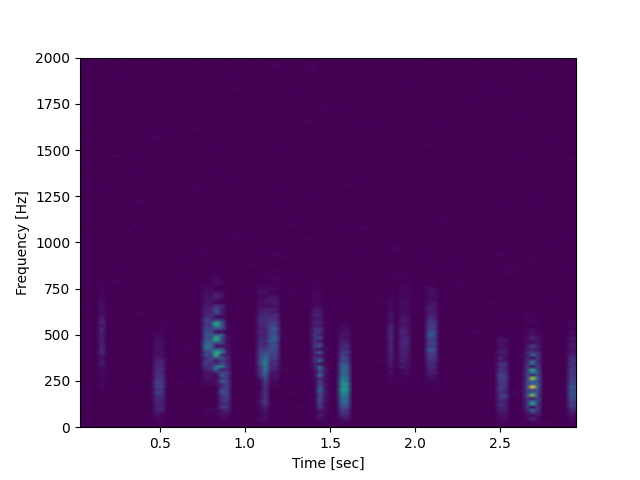

In [8]:
f, t, Sxx = helper.get_spectrogram(dataset_synth.recording, 30000)
plt.figure()
plt.pcolormesh(t, f, Sxx, shading='gouraud')
plt.ylabel('Frequency [Hz]')
plt.xlabel('Time [sec]')
plt.ylim(0, 2000)
plt.show()

8000
(24000, 1) (24000,)


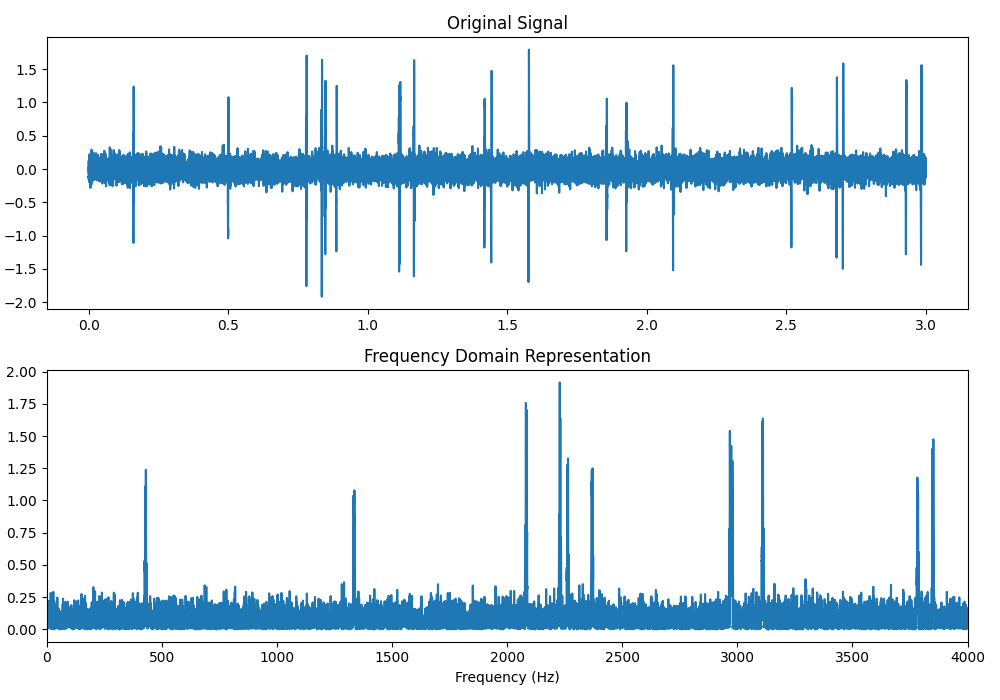

In [9]:
helper.fft_rec(dataset_synth.recording, 24000, freq_lim=4000)

#### Waveforms

extract waveforms shared_memory multi buffer:   0%|          | 0/3 [00:00<?, ?it/s]

Setting 'return_scaled' to False


extract waveforms shared_memory multi buffer:   0%|          | 0/3 [00:00<?, ?it/s]

AppLayout(children=(UnitSelector(children=(Label(value='Units', layout=Layout(justify_content='center')), Sele…

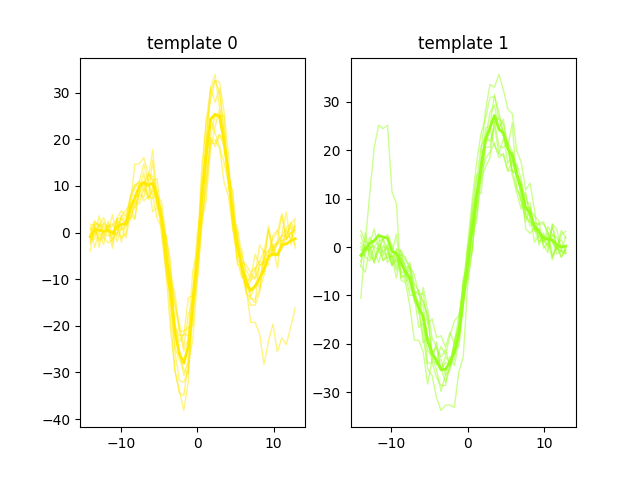

No such comm: e8351e603859478583655d394a7e3839


No such comm: b47d52792d374edbb9c009b4e8e30d86


In [10]:
plt.close('all')
waveforms = si.extract_waveforms(dataset_synth.recording, dataset_synth.sorting_true, max_spikes_per_unit=2500, mode="memory", ms_before=3, ms_after=3)
w = sw.plot_spikes_on_traces(waveform_extractor=waveforms, backend="ipywidgets")
sw.plot_unit_waveforms(waveforms)

In [11]:
snrs = qm.compute_snrs(waveforms)
print("SNR (dB)", 20*np.log10(snrs[1]))

SNR (dB) 21.811830339055042


We can compare these waveforms extracted from the signal with the true functions used to generate the signal:

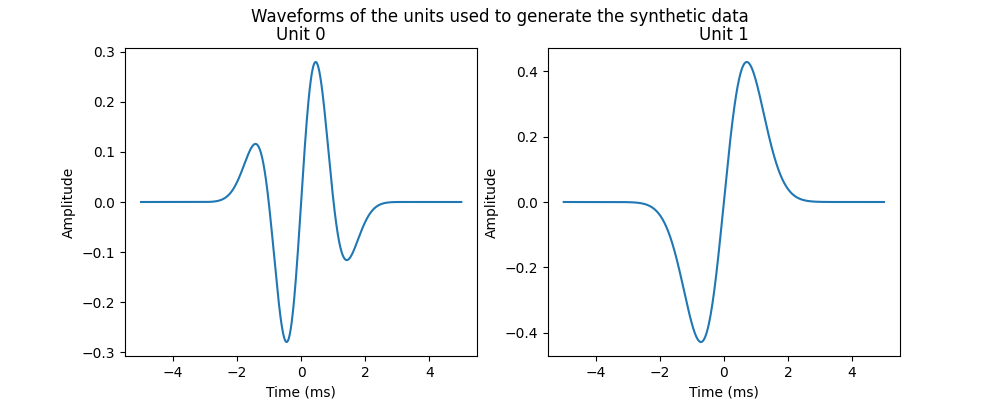

In [12]:
filter_length = 10.125  # Fitler length in ms
factor = 10/filter_length
units = [
    lambda x: (factor*x)*np.exp(-(factor*x)**2)*np.cos(2*np.pi*(factor*x)/4),
    lambda x: (factor*x)*np.exp(-(factor*x)**2)
]

times = np.linspace(-5, 5, 1000)
fig, axes = plt.subplots(1, 2, figsize=(10, 4))
for i in range(len(units)):
    axes[i].plot(times, units[i](times))
    axes[i].set_xlabel("Time (ms)")
    axes[i].set_ylabel("Amplitude")
    axes[i].set_title(f"Unit {i}")
fig.suptitle("Waveforms of the units used to generate the synthetic data")
plt.show()


### Real dataset

First, we need to retrieve the dataset. Here we do not use the function used in practice, so that we can understand the different operations performed.

In [13]:
dataset_real = helper.load_dataset("default_dataset")

If the command above does not work, you may need to manually set up kachery-cloud (see [here](https://github.com/flatironinstitute/kachery-cloud?tab=readme-ov-file#installation-and-setup)).

In [14]:
sw.plot_traces(dataset_real.recording, time_range=[0, 10], channel_ids=[18],backend='ipywidgets')

AppLayout(children=(TimeSlider(children=(Dropdown(description='segment', options=(0,), value=0), Button(icon='…

In [15]:
print(dataset_real.recording.has_scaled())

False


No scaled traces so we cannot have a unit for the y-axis.

#### Stationarity and ergodicity

Given the many spikes, the signal is not stationary and ergodic, but it seems that the background noise is quite stationary over time, which would allow us some basic preprocessing. The use of the median instead of the mean for statistics will make us more robust towards the spiking outliers.

#### Denoising

In [49]:
print(si.get_noise_levels(dataset_real.recording, return_scaled=False, chunk_size=10000)[18])

38.54765768114565


In [50]:
recording_denoised = si.common_reference(dataset_real.recording, reference='global')
print(si.get_noise_levels(recording_denoised, return_scaled=False, chunk_size=10000)[18])

37.065055462640046


In [51]:
recording = recording_denoised.channel_slice([18])

#### Spectrogram and FFT

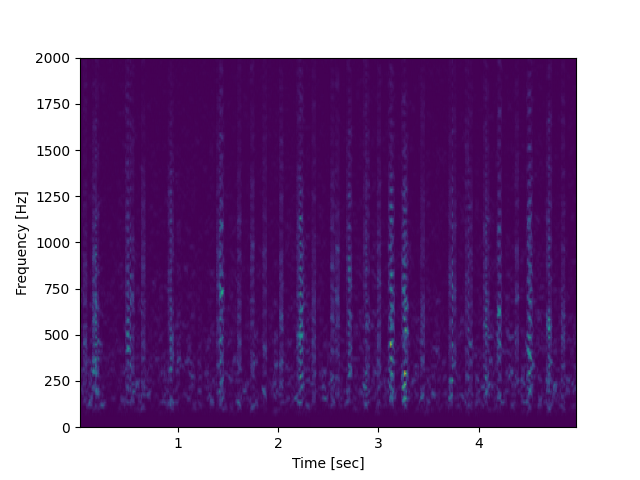

In [52]:
plt.close('all')
f, t, Sxx = signal.spectrogram(recording.get_traces(end_frame=100000).flatten(), recording.get_sampling_frequency(),
                               nperseg=1024, noverlap=1024 - 100, window=('tukey', 0.25))
plt.pcolormesh(t, f, Sxx, shading='gouraud')
plt.ylabel('Frequency [Hz]')
plt.xlabel('Time [sec]')
plt.ylim(0, 2000)
plt.show()

Even if the random peaks make the signal non stationary, it can be interesting to compute the FFT to check there is no systematic background noise like for instance some electric resonance around 60 Hz. We can use FFT because we assume there is no abrupt change in the timeseries, except spikes.

In [53]:
print(recording.is_filtered())

False


20000.0
(100000, 1) (100000,)


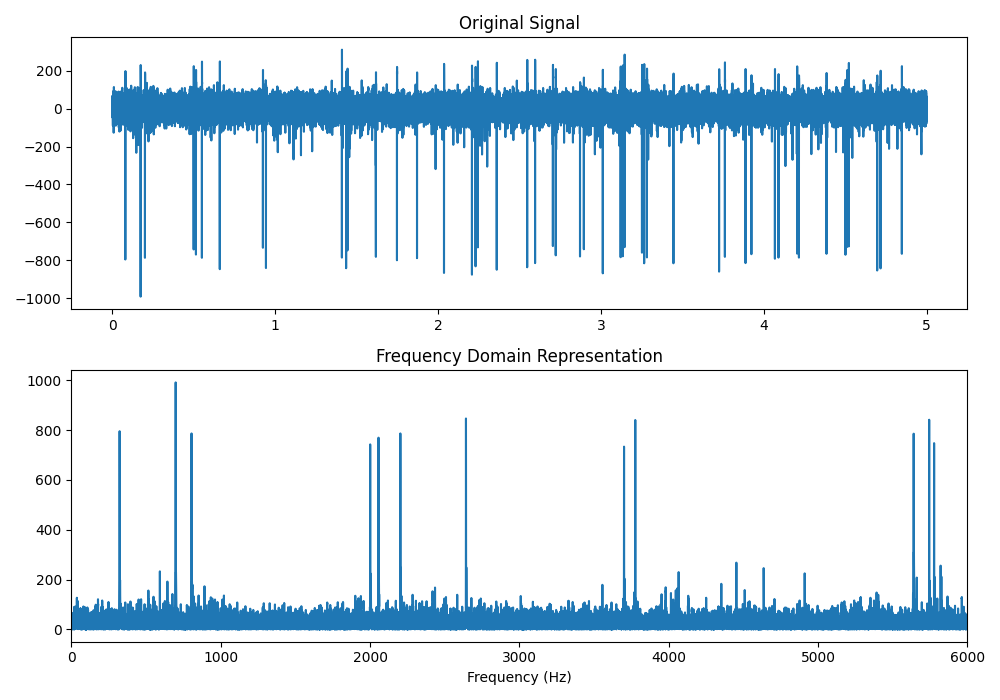

In [55]:
# Plot the original signal and its frequency domain representation
helper.fft_rec(recording)

We filter the signal to keep only the high-frequency components corresponding to the spikes.

20000.0
(100000, 1) (100000,)


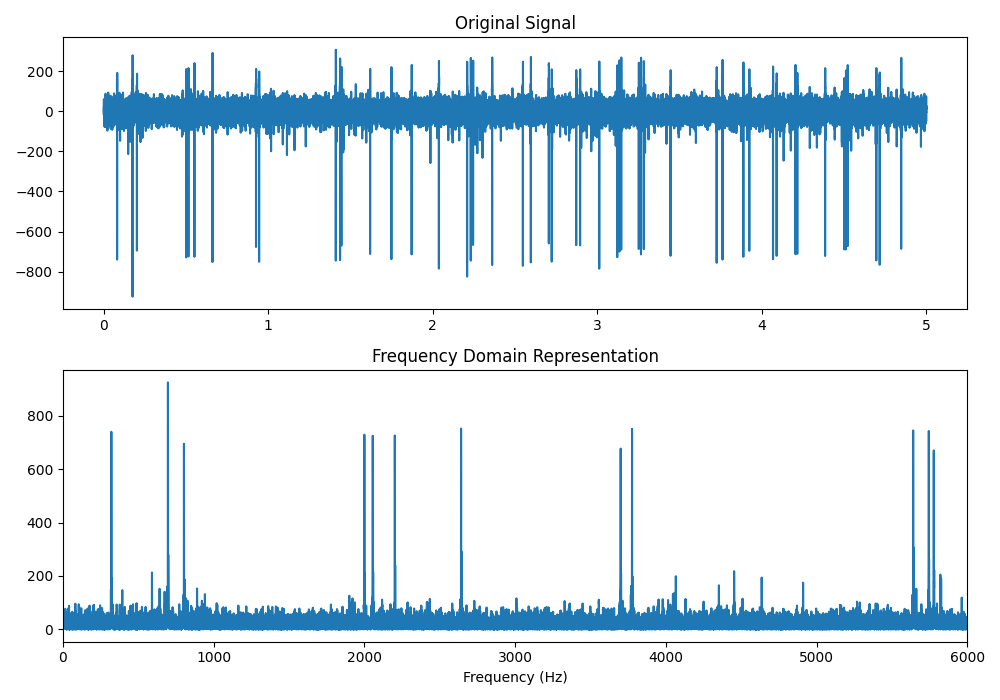

In [56]:
recording_filt = si.bandpass_filter(recording, 300, 6000)
helper.fft_rec(recording_filt)

In fact, contrary to what the recording object indicates, it has already been filtered.

In [57]:
recording.annotate(is_filtered=True)

Plotting autocorrelation does not make a lot of sense here:

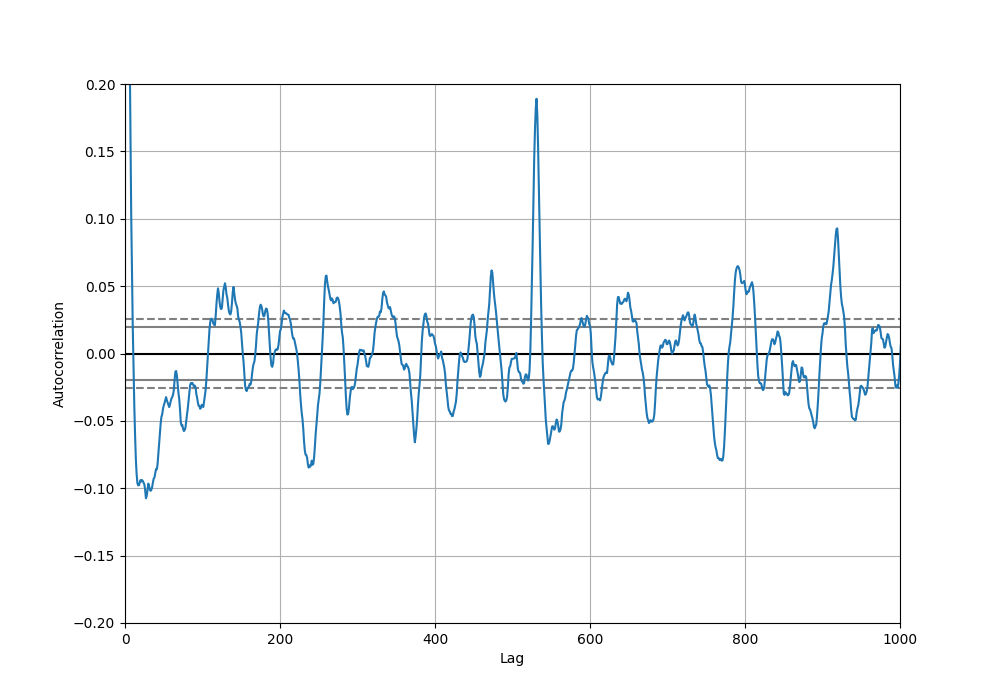

In [58]:
plt.figure(figsize=(10, 7))
pd.plotting.autocorrelation_plot(recording.get_traces(end_frame=10000))
plt.ylim(-0.2, 0.2)
plt.xlim(0, 1000)
plt.show()

#### Detrending

We check if there is no major trend in the signal, even though it does not seem so

Coefficients: [[-0.00093171]]


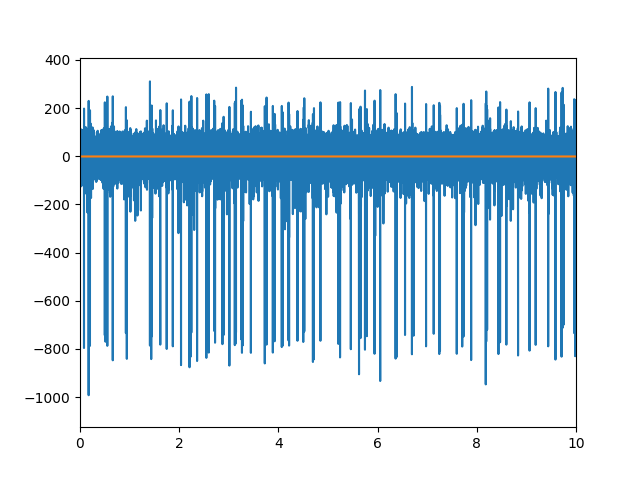

In [59]:
traces = recording.get_traces()
times = np.arange(len(traces)) / recording.get_sampling_frequency()
times = times.reshape((-1, 1))
model = LinearRegression()
model.fit(times, traces)
print('Coefficients: %s' % model.coef_)
# calculate trend
trend = model.predict(times)
# plot trend
plt.figure()
plt.plot(times, traces)
plt.plot(times, trend)
plt.xlim(0, 10)
plt.show()

#### Spikes waveforms

In [60]:
waveforms = si.extract_waveforms(recording, dataset_real.sorting_true, max_spikes_per_unit=2500, mode="memory")

extract waveforms shared_memory multi buffer:   0%|          | 0/100 [00:00<?, ?it/s]

Setting 'return_scaled' to False


extract waveforms shared_memory multi buffer:   0%|          | 0/100 [00:00<?, ?it/s]

In [61]:
w = sw.plot_spikes_on_traces(waveform_extractor=waveforms, backend="ipywidgets")

AppLayout(children=(UnitSelector(children=(Label(value='Units', layout=Layout(justify_content='center')), Sele…

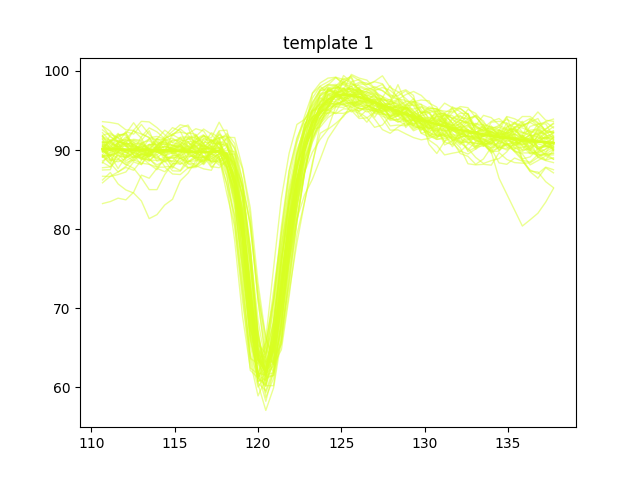

In [65]:
sw.plot_unit_waveforms(waveforms)

(905, 60, 1)


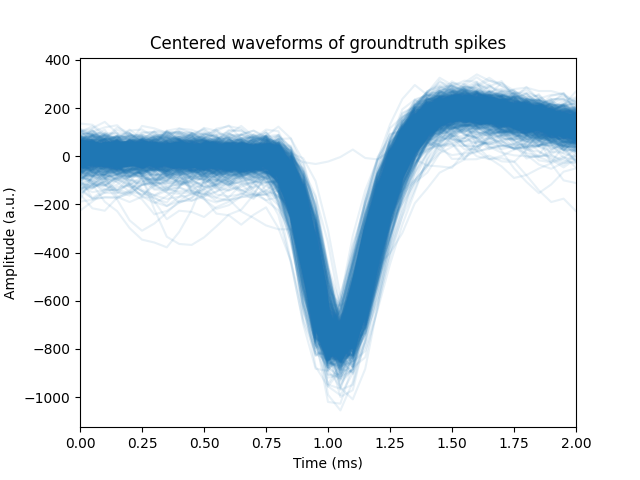

No such comm: a47c10946b32491db79e9987274ffabe
No such comm: a47c10946b32491db79e9987274ffabe
No such comm: a47c10946b32491db79e9987274ffabe
No such comm: a47c10946b32491db79e9987274ffabe


In [63]:
plt.close('all')
templates = waveforms.get_waveforms(unit_id=1)
print(templates.shape)
times = np.arange(templates.shape[1]) / recording.get_sampling_frequency() * 1000
for i in range(templates.shape[0]):
    plt.plot(times, templates[i, :, :].flatten(), color='tab:blue', alpha=0.1)
plt.xlim(0, 2)
plt.xlabel('Time (ms)')
plt.ylabel('Amplitude (a.u.)')
plt.title('Centered waveforms of groundtruth spikes')
plt.show()

In [64]:
peaks = scpd.detect_peaks(recording, detect_threshold=5)
peaks = pd.DataFrame(peaks)
# peaks = peaks[peaks["channel_index"] == 18]   

detect peaks using by_channel:   0%|          | 0/100 [00:00<?, ?it/s]

Text(0.5, 1.0, 'Detected spikes')

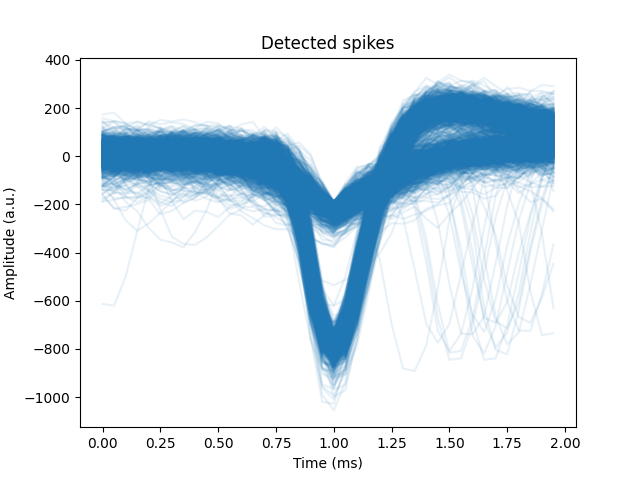

No such comm: 097c677bce384c48afbceaa999f437e3


No such comm: 2e66c778a0804de8b4bc055f4026b09c
No such comm: 2e66c778a0804de8b4bc055f4026b09c
No such comm: 2e66c778a0804de8b4bc055f4026b09c
No such comm: 2e66c778a0804de8b4bc055f4026b09c
No such comm: 2e66c778a0804de8b4bc055f4026b09c
No such comm: 2e66c778a0804de8b4bc055f4026b09c
No such comm: 2e66c778a0804de8b4bc055f4026b09c
No such comm: 2e66c778a0804de8b4bc055f4026b09c
No such comm: 2e66c778a0804de8b4bc055f4026b09c
No such comm: 2e66c778a0804de8b4bc055f4026b09c
No such comm: 2e66c778a0804de8b4bc055f4026b09c
No such comm: 2e66c778a0804de8b4bc055f4026b09c
No such comm: 2e66c778a0804de8b4bc055f4026b09c
No such comm: 2e66c778a0804de8b4bc055f4026b09c
No such comm: 2e66c778a0804de8b4bc055f4026b09c
No such comm: 2e66c778a0804de8b4bc055f4026b09c
No such comm: 2e66c778a0804de8b4bc055f4026b09c
No such comm: 2e66c778a0804de8b4bc055f4026b09c
No such comm: 2e66c778a0804de8b4bc055f4026b09c
No such comm: 2e66c778a0804de8b4bc055f4026b09c
No such comm: 2e66c778a0804de8b4bc055f4026b09c
No such comm:

In [ ]:
plt.close('all')
size = 20
times = np.arange(2*size) / recording.get_sampling_frequency() * 1000
for i, (_, peak) in enumerate(peaks.iterrows()):
    peak_idx = int(peak["sample_index"])
    plt.plot(times, recording.get_traces(start_frame=peak_idx-size, end_frame=peak_idx+size).flatten(), color='tab:blue', alpha=0.1)
plt.xlabel('Time (ms)')
plt.ylabel('Amplitude (a.u.)')
plt.title('Detected spikes')

In [33]:
snrs = qm.compute_snrs(waveforms)
print("SNR (dB)", 20*np.log10(snrs[1]))

SNR (dB) 26.44732758005682


------------

## Experiments

To run an experiment, you can run ``!ssrun [params]`` in a notebook cell or in a terminal (which allows a continuous display of the progress of the run). The parameters allow you to select a pre-defined configuration in ``cdlgr/config`` or to override a predefined config with ``field.subfield=value``.

For example, a typical run is instantiated by ``!ssrun dataset={dataset} model={model} experiment={experiment} output.verbose={verbose} output.plot={plot level}``, where:
- ``{dataset}`` should be replaced by the desired dataset, either synthetic or real (see configs in ``cdlgr/config/dataset``)
- ``{model}`` should be replaced by the desired model configuration (see configs in ``cdlgr/config/model``)
- ``{experiment}`` should be replaced with the experiment number used to name the folder in which the results will be stored
- ``{verbose}`` is one of {0, 1, 2} and sets the level of details in the log 
- ``{plot level}`` is one of {0, 1, 2} and sets the amount of plotted figures stored in the results folder. 

The results will be stored in ``outputs/{type of experiment}/{type of launch}/interp_{num elements}_{interpolation}/seed_{seed}``, where:
- ``{type of experiment}`` designates either the real dataset or the synthetic one
- ``{type of launch}`` is one of ``simple`` or ``multirun`` (see below)
- ``{num elements}`` is the number of elements (_i.e._ sources)
- ``{interpolation}`` is the number of subdivisions of a sample of the original grid used for refinement
- ``{seed}`` is the random seed used for the exerpiment

Last, an experiment can be run one at a time (``!ssrun``), or multiple instances of an experiment can be run at once (``!ssrun --multirun``) to average the results of several runs.

For information on the config parameters, see the files in ``cdlgr/config``. In what follows, experiments are run using the corresponding config files.

### Synthetic dataset

Each experiment varies a specific parameter for the algorithm. Briefly:
- Experiments 1, 2, 3 and 4 assess different intializations for the dictionary
- Experiments 5 tries a different number of templates in the dictionary
- Experiments 6 tries a different signal-to-noise ratio
- Experiments 7 tries a different sampling frequency
- Experiment 8 tries a different interpolator

The default configuration for the experiments is available in ``cdlgr/config/dataset/synth_default_dataset`` and ``cdlgr/config/dataset/synth_default_model``.

Each experiment is launched once with detailed outputs, and 5 times with few outputs and averaged results.

In [67]:
%matplotlib inline
# Generates an extraneous plot, to ignore
plt.figure();

<Figure size 640x480 with 0 Axes>

#### Experiment 1

The dictionary is initialized with random noise.

In [38]:
experiment = 1

In [38]:
# Single run with interpolation
run(f"ssrun dataset=synth_dataset_exp{experiment} model=synth_model_exp{experiment} experiment={experiment}")


experiment: 1
output:
  verbose: 2
  plot: 2
  preprocess:
    plot_traces: false
    plot_waveforms: false
    plot_snrs: false
  fp_threshold_ms: 15
dataset:
  type: synth
  name: synthetic
  recording: synthetic
  uri: null
  first_unit_index: null
  none_unit: null
  tstart_s: null
  tstop_s: null
  duration_s: null
  tstart_test_s: null
  tstop_test_s: null
  channel: 0
  detect_threshold: 5
  preprocess: false
  preprocess_params:
    freq_min: null
    freq_max: null
  window:
    split: true
    window_size_s: 0.015
  sources:
    num: 2
    length_ms: 10.125
  gen:
    seed: 11
    noise: 0.1
    amps:
    - 1
    - 2
    numOfEvents: 10
    T: 3
  fs: 8000
model:
  dictionary:
    num_elements: 2
    element_length_ms: 10.125
    init_templates: random
    real_random_noise: 0.2
    real_offset_ms: 0.5
  cdl:
    num_iterations: 10
    interpolate: 10
    sparsity_tol: 1
    sparsity_tol_test: 25
    rel_amp_split_test: 0.6
    error_tol: 0.01
    interpolator_type: sinc
   

Initial dictionary:


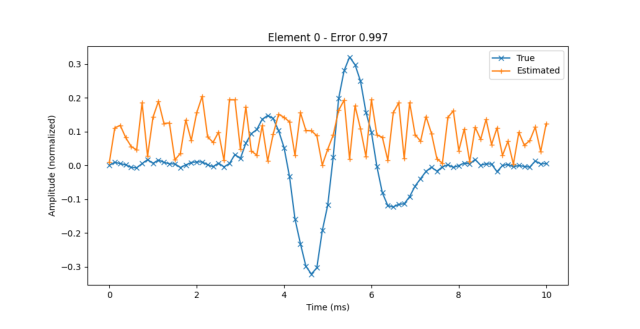

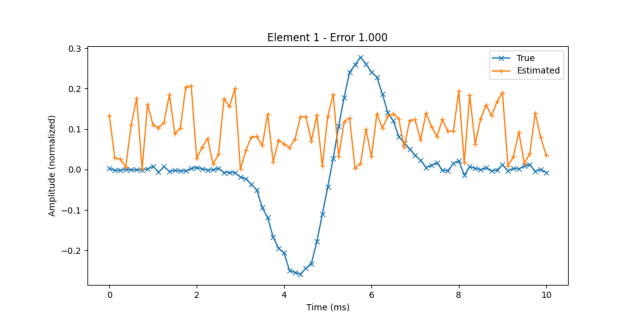

Final dictionary (shifted and interpolated truth):


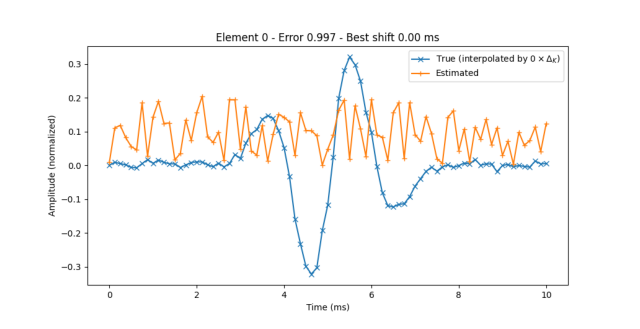

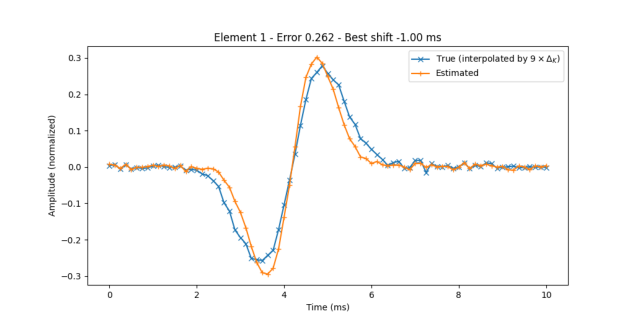

True positive on test set:


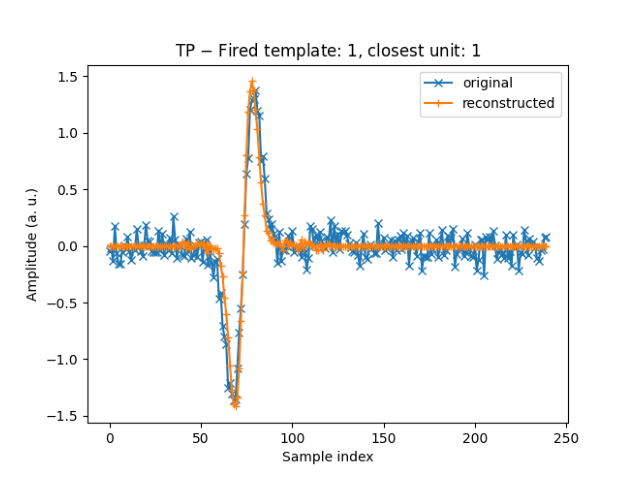

False positive on test set:


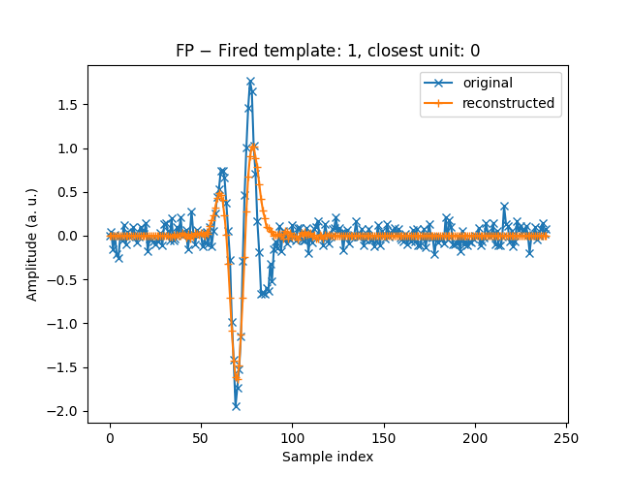

Confusion matrix test:


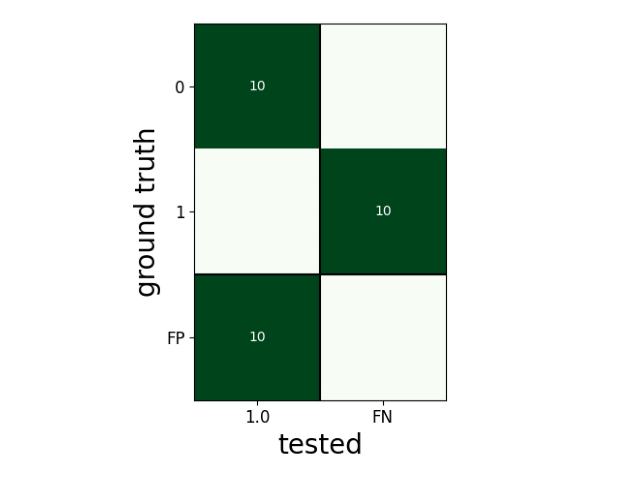

Time:


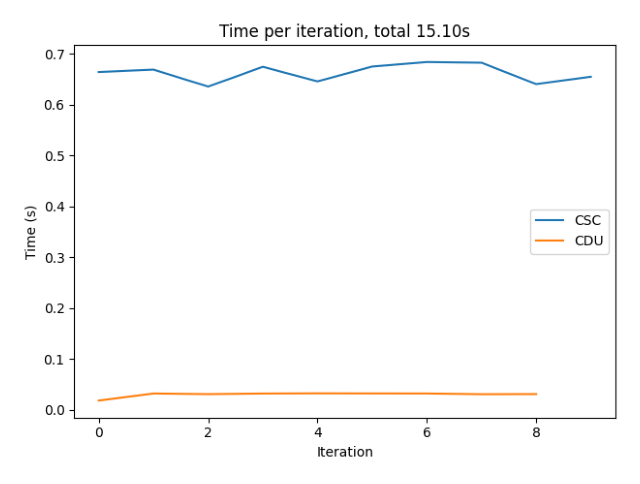

In [39]:
path = f"outputs/synth_experiments/experiment_{experiment}/single/interp_2_10/seed_{experiment+10}"
helper.show_plots(path)

In [40]:
# Single run without interpolation
run(f"ssrun dataset=synth_dataset_exp{experiment} model=synth_model_exp{experiment} experiment={experiment} model.cdl.interpolate=0")


experiment: 1
output:
  verbose: 2
  plot: 2
  preprocess:
    plot_traces: false
    plot_waveforms: false
    plot_snrs: false
  fp_threshold_ms: 15
dataset:
  type: synth
  name: synthetic
  recording: synthetic
  uri: null
  first_unit_index: null
  none_unit: null
  tstart_s: null
  tstop_s: null
  duration_s: null
  tstart_test_s: null
  tstop_test_s: null
  channel: 0
  detect_threshold: 5
  preprocess: false
  preprocess_params:
    freq_min: null
    freq_max: null
  window:
    split: true
    window_size_s: 0.015
  sources:
    num: 2
    length_ms: 10.125
  gen:
    seed: 11
    noise: 0.1
    amps:
    - 1
    - 2
    numOfEvents: 10
    T: 3
  fs: 8000
model:
  dictionary:
    num_elements: 2
    element_length_ms: 10.125
    init_templates: random
    real_random_noise: 0.2
    real_offset_ms: 0.5
  cdl:
    num_iterations: 10
    interpolate: 0
    sparsity_tol: 1
    sparsity_tol_test: 25
    rel_amp_split_test: 0.6
    error_tol: 0.01
    interpolator_type: sinc
    

Initial dictionary:


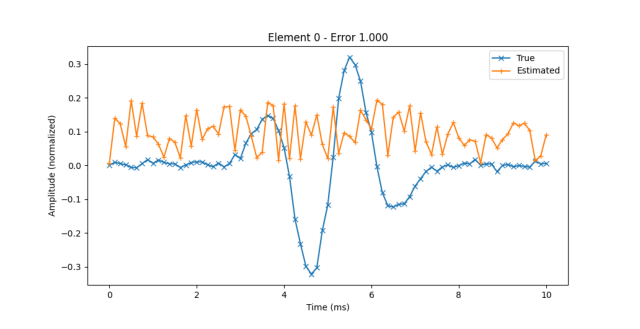

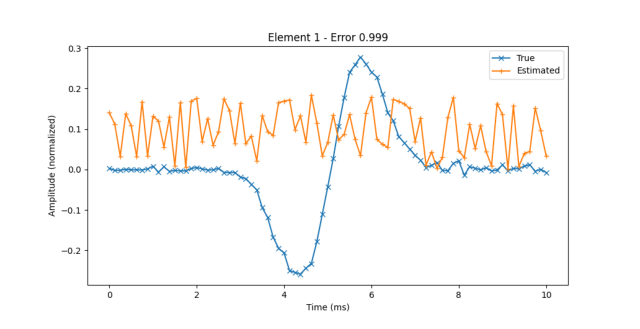

Final dictionary (shifted and interpolated truth):


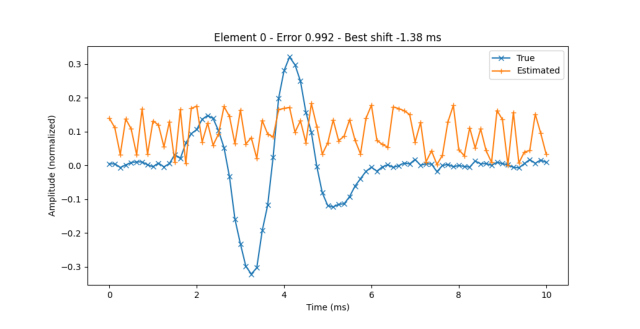

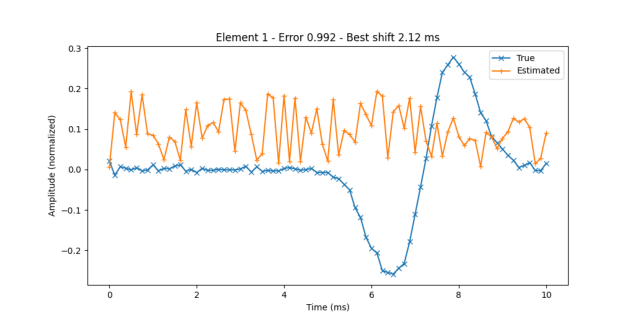

True positive on test set:


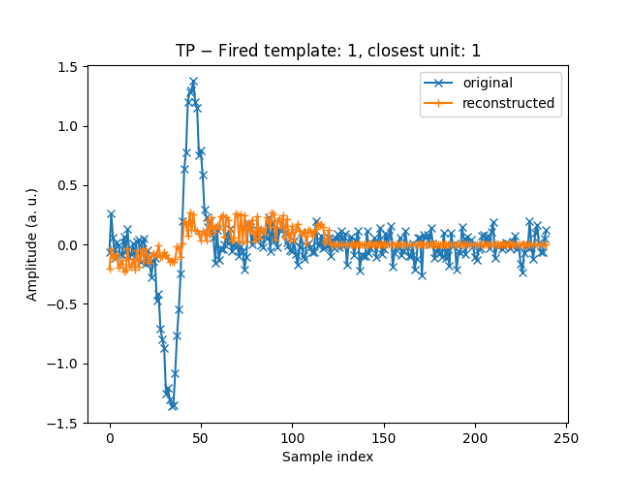

False positive on test set:


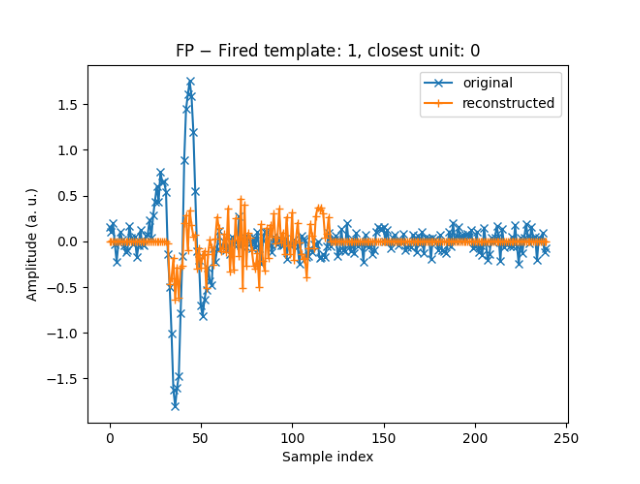

Confusion matrix test:


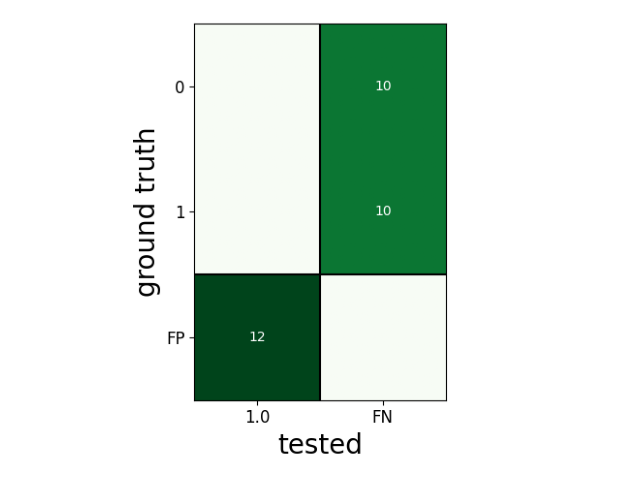

Time:


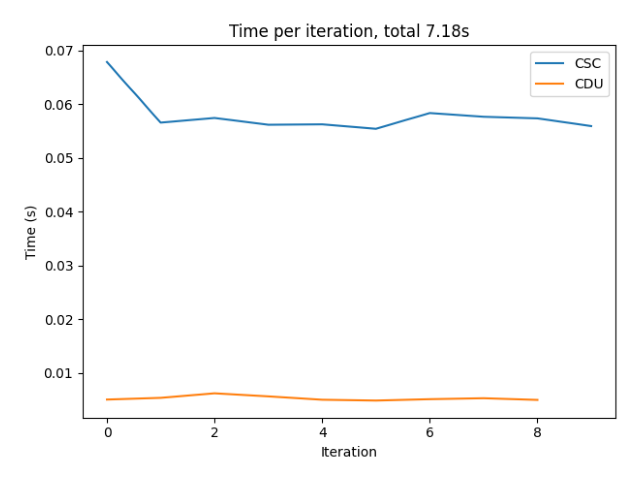

In [41]:
path = f"outputs/synth_experiments/experiment_{experiment}/single/interp_2_0/seed_{experiment+10}"
helper.show_plots(path)

In [42]:
# Run on multiple seeds
run(f"ssrun --multirun dataset=synth_dataset_exp{experiment} model=synth_model_exp{experiment} experiment={experiment} dataset.gen.seed=range(1,6) model.cdl.interpolate=0,10 output.verbose=0 output.plot=1")

[2024-01-09 19:34:13,410][HYDRA] Launching 10 jobs locally
[2024-01-09 19:34:13,410][HYDRA] 	#0 : dataset=synth_dataset_exp1 model=synth_model_exp1 experiment=1 dataset.gen.seed=1 model.cdl.interpolate=0 output.verbose=0 output.plot=1
extract waveforms shared_memory multi buffer: 100%|##########| 3/3 [00:00<00:00, 2998.79it/s]
Setting 'return_scaled' to False
detect peaks using by_channel: 100%|##########| 3/3 [00:00<00:00, 1500.11it/s]
C:\Users\PolletStars\Documents\Git\tsproj\cdlgr\model\cdl.py:403: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sub_spike_sorting["diff"] = diffs_norm
C:\Users\PolletStars\Documents\Git\tsproj\cdlgr\model\cdl.py:403: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try us

In [43]:
helper.report_multi_run_results(experiment)

Averaged accuracy:
interpolation: 0
unit 0: 0.000 +/- 0.000
unit 1: 0.653 +/- 0.361
Overall: 0.327 +/- 0.415

interpolation: 10
unit 0: 0.000 +/- 0.000
unit 1: 0.000 +/- 0.000
Overall: 0.000 +/- 0.000


--------------------------
Averaged precision:
interpolation: 0
unit 0: 0.000 +/- 0.000
unit 1: 0.702 +/- 0.364
Overall: 0.351 +/- 0.435

interpolation: 10
unit 0: 0.000 +/- 0.000
unit 1: 0.000 +/- 0.000
Overall: 0.000 +/- 0.000


--------------------------
Averaged recall:
interpolation: 0
unit 0: 0.000 +/- 0.000
unit 1: 0.720 +/- 0.376
Overall: 0.360 +/- 0.448

interpolation: 10
unit 0: 0.000 +/- 0.000
unit 1: 0.000 +/- 0.000
Overall: 0.000 +/- 0.000


--------------------------
Averaged error and time offset by interpolation and unit:
interpolation: 0
unit 0:
	error: 0.820 +/- 0.347
	offset: 2.100 ms +/- 1.439 ms
unit 1:
	error: 0.818 +/- 0.345
	offset: 0.000 ms +/- 1.956 ms
Overall:
	error: 0.8190508763448804 +/- 0.34585927414319695
	offset: 1.05  ms +/- 2.012616456257873 ms

interp

**Observations**: The algorithm has a tendency to fit detected spikes with the composition of several (possibly noisy) templates. Furthermore, it has a tendency to reconstruct unit 0 by overlapping copies of unit 1, leading to bad accuracy on unit 0. Grid-refinement brings no significant improvement in this case.

#### Experiment 2

The dictionary is initialized with the real templates

In [44]:
experiment = 2

In [45]:
# Single run with interpolation
run(f"ssrun dataset=synth_dataset_exp{experiment} model=synth_model_exp{experiment} experiment={experiment}")


experiment: 2
output:
  verbose: 2
  plot: 2
  preprocess:
    plot_traces: false
    plot_waveforms: false
    plot_snrs: false
  fp_threshold_ms: 15
dataset:
  type: synth
  name: synthetic
  recording: synthetic
  uri: null
  first_unit_index: null
  none_unit: null
  tstart_s: null
  tstop_s: null
  duration_s: null
  tstart_test_s: null
  tstop_test_s: null
  channel: 0
  detect_threshold: 5
  preprocess: false
  preprocess_params:
    freq_min: null
    freq_max: null
  window:
    split: true
    window_size_s: 0.015
  sources:
    num: 2
    length_ms: 10.125
  gen:
    seed: 12
    noise: 0.1
    amps:
    - 1
    - 2
    numOfEvents: 10
    T: 3
  fs: 8000
model:
  dictionary:
    num_elements: 2
    element_length_ms: 10.125
    init_templates: real
    real_random_noise: 0.2
    real_offset_ms: 0.5
  cdl:
    num_iterations: 10
    interpolate: 10
    sparsity_tol: 1
    sparsity_tol_test: 25
    rel_amp_split_test: 0.6
    error_tol: 0.01
    interpolator_type: sinc
    p

Initial dictionary:


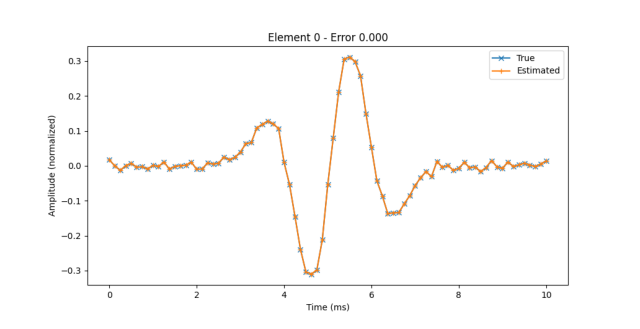

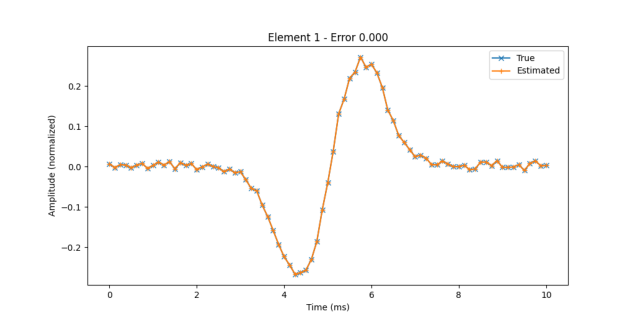

Final dictionary (shifted and interpolated truth):


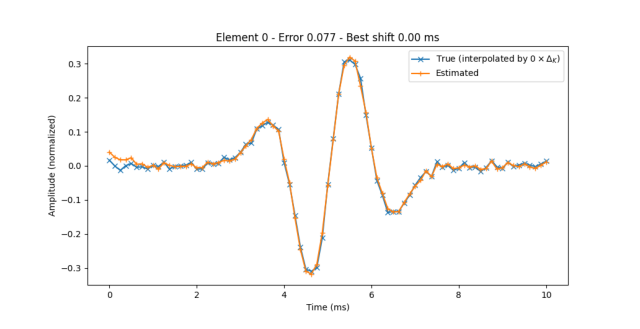

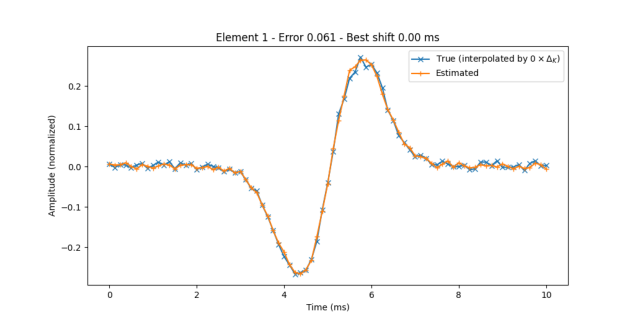

True positive on test set:


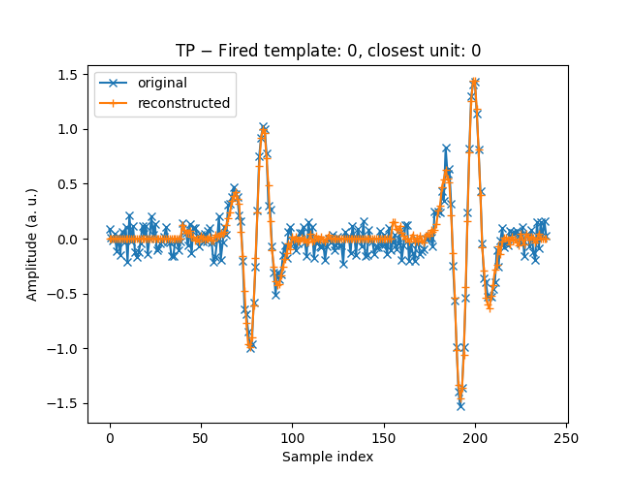

False positive on test set:


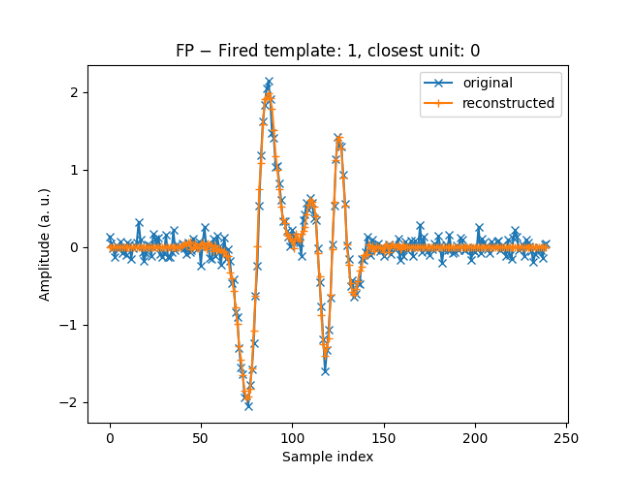

Confusion matrix test:


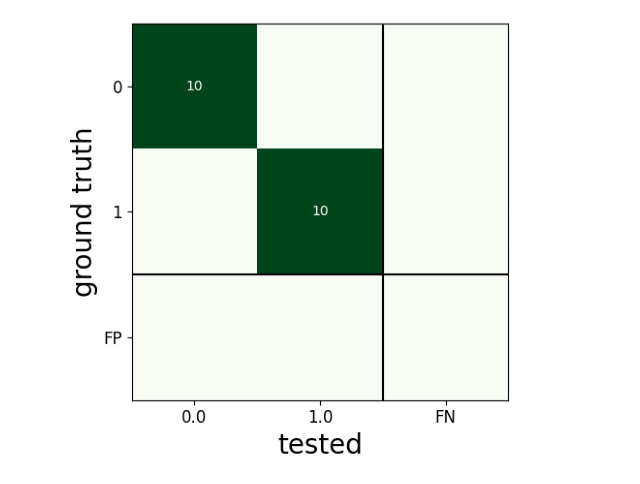

Time:


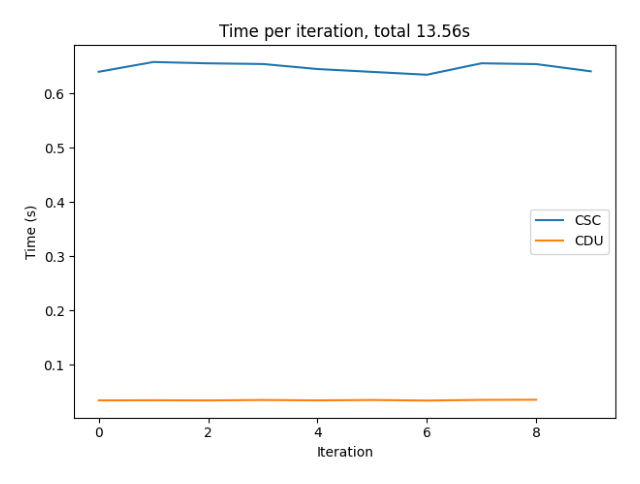

In [46]:
path = f"outputs/synth_experiments/experiment_{experiment}/single/interp_2_10/seed_{experiment+10}"
helper.show_plots(path)

In [47]:
# Single run without interpolation
run(f"ssrun dataset=synth_dataset_exp{experiment} model=synth_model_exp{experiment} experiment={experiment} model.cdl.interpolate=0")


experiment: 2
output:
  verbose: 2
  plot: 2
  preprocess:
    plot_traces: false
    plot_waveforms: false
    plot_snrs: false
  fp_threshold_ms: 15
dataset:
  type: synth
  name: synthetic
  recording: synthetic
  uri: null
  first_unit_index: null
  none_unit: null
  tstart_s: null
  tstop_s: null
  duration_s: null
  tstart_test_s: null
  tstop_test_s: null
  channel: 0
  detect_threshold: 5
  preprocess: false
  preprocess_params:
    freq_min: null
    freq_max: null
  window:
    split: true
    window_size_s: 0.015
  sources:
    num: 2
    length_ms: 10.125
  gen:
    seed: 12
    noise: 0.1
    amps:
    - 1
    - 2
    numOfEvents: 10
    T: 3
  fs: 8000
model:
  dictionary:
    num_elements: 2
    element_length_ms: 10.125
    init_templates: real
    real_random_noise: 0.2
    real_offset_ms: 0.5
  cdl:
    num_iterations: 10
    interpolate: 0
    sparsity_tol: 1
    sparsity_tol_test: 25
    rel_amp_split_test: 0.6
    error_tol: 0.01
    interpolator_type: sinc
    pe

Initial dictionary:


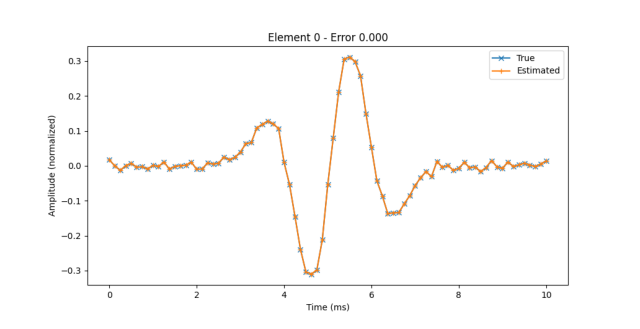

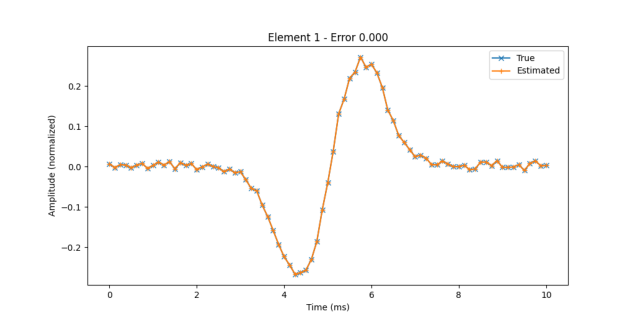

Final dictionary (shifted and interpolated truth):


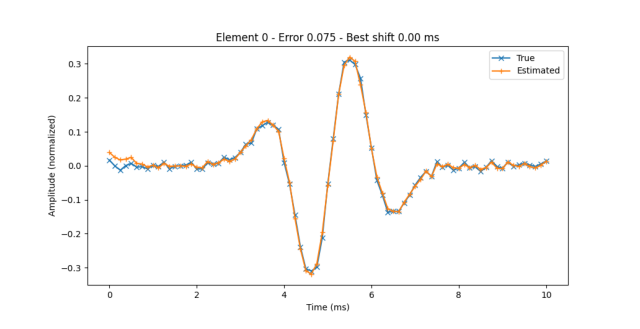

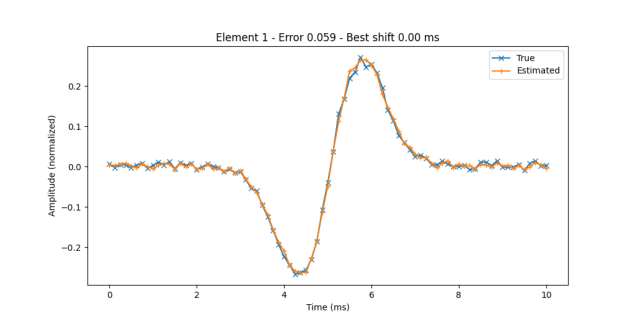

True positive on test set:


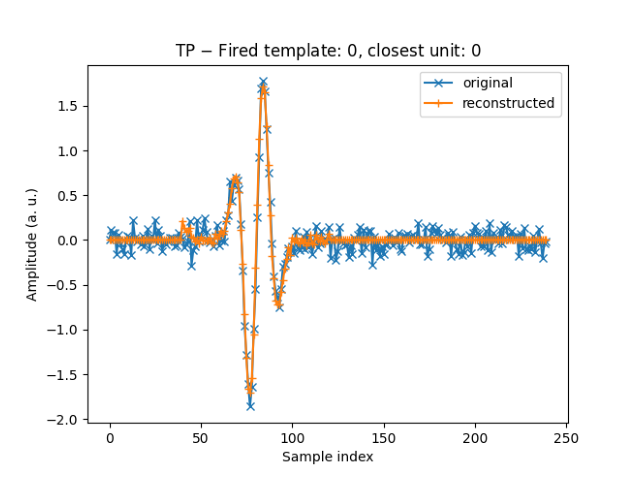

False positive on test set:


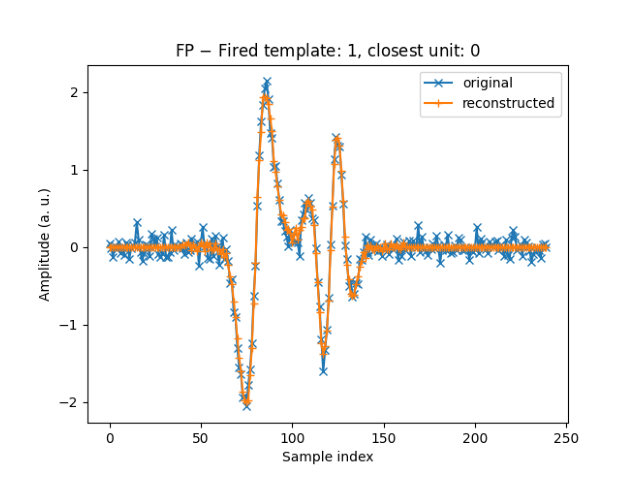

Confusion matrix test:


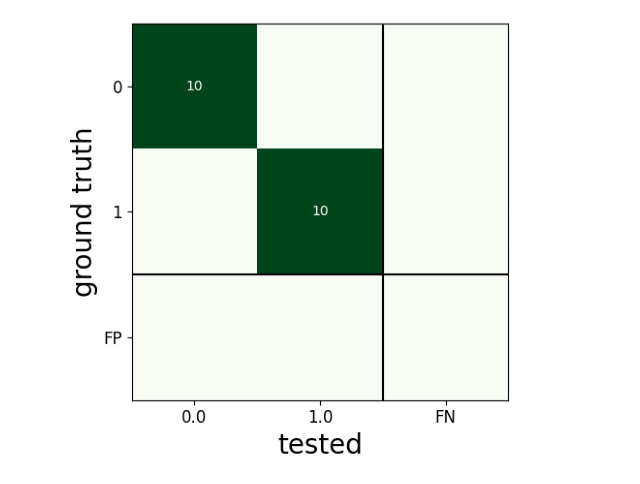

Time:


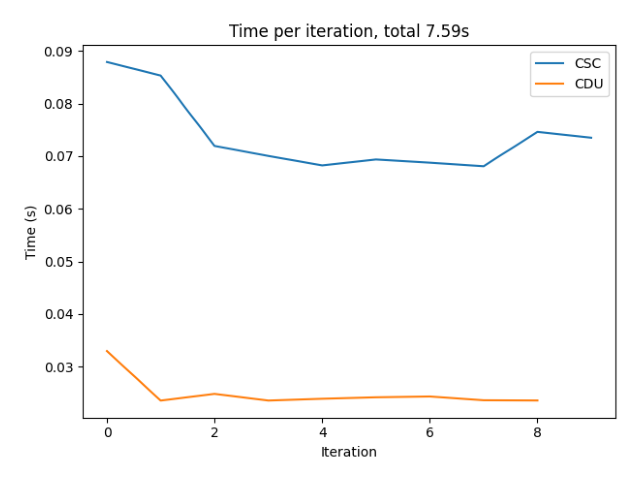

In [48]:
path = f"outputs/synth_experiments/experiment_{experiment}/single/interp_2_0/seed_{experiment+10}"
helper.show_plots(path)

In [49]:
# Run on multiple seeds
run(f"ssrun --multirun dataset=synth_dataset_exp{experiment} model=synth_model_exp{experiment} experiment={experiment} dataset.gen.seed=range(1,6) model.cdl.interpolate=0,10 output.verbose=0 output.plot=0")

[2024-01-09 19:37:03,109][HYDRA] Launching 10 jobs locally
[2024-01-09 19:37:03,109][HYDRA] 	#0 : dataset=synth_dataset_exp2 model=synth_model_exp2 experiment=2 dataset.gen.seed=1 model.cdl.interpolate=0 output.verbose=0 output.plot=0
extract waveforms shared_memory multi buffer: 100%|##########| 3/3 [00:00<?, ?it/s]
Setting 'return_scaled' to False
detect peaks using by_channel: 100%|##########| 3/3 [00:00<00:00, 1500.29it/s]
C:\Users\PolletStars\Documents\Git\tsproj\cdlgr\model\cdl.py:403: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sub_spike_sorting["diff"] = diffs_norm
C:\Users\PolletStars\Documents\Git\tsproj\cdlgr\model\cdl.py:403: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

In [50]:
helper.report_multi_run_results(experiment)

Averaged accuracy:
interpolation: 0
unit 0: 1.000 +/- 0.000
unit 1: 1.000 +/- 0.000
Overall: 1.000 +/- 0.000

interpolation: 10
unit 0: 1.000 +/- 0.000
unit 1: 1.000 +/- 0.000
Overall: 1.000 +/- 0.000


--------------------------
Averaged precision:
interpolation: 0
unit 0: 1.000 +/- 0.000
unit 1: 1.000 +/- 0.000
Overall: 1.000 +/- 0.000

interpolation: 10
unit 0: 1.000 +/- 0.000
unit 1: 1.000 +/- 0.000
Overall: 1.000 +/- 0.000


--------------------------
Averaged recall:
interpolation: 0
unit 0: 1.000 +/- 0.000
unit 1: 1.000 +/- 0.000
Overall: 1.000 +/- 0.000

interpolation: 10
unit 0: 1.000 +/- 0.000
unit 1: 1.000 +/- 0.000
Overall: 1.000 +/- 0.000


--------------------------
Averaged error and time offset by interpolation and unit:
interpolation: 0
unit 0:
	error: 0.077 +/- 0.031
	offset: 0.000 ms +/- 0.000 ms
unit 1:
	error: 0.055 +/- 0.016
	offset: 0.000 ms +/- 0.000 ms
Overall:
	error: 0.06633837776913828 +/- 0.027032090285881237
	offset: 0.0  ms +/- 0.0 ms

interpolation: 10
u

**Observations**: As exptected for this trivial situation, we get an accuracy of $1$ in both cases, with not apparent difference in the error on the reconstruction of the dictionary.

*NB:* In some cases, the output figure may display a false positive when there is none in the confusion matrix, because false positive are not detected the same way for the plots and for the confusion matrix

#### Experiment 3

The dictionary is initialized with real templates and added random noise (of standard deviation $0.2$).

In [51]:
experiment = 3

In [52]:
# Single run with interpolation
run(f"ssrun dataset=synth_dataset_exp{experiment} model=synth_model_exp{experiment} experiment={experiment}")


experiment: 3
output:
  verbose: 2
  plot: 2
  preprocess:
    plot_traces: false
    plot_waveforms: false
    plot_snrs: false
  fp_threshold_ms: 15
dataset:
  type: synth
  name: synthetic
  recording: synthetic
  uri: null
  first_unit_index: null
  none_unit: null
  tstart_s: null
  tstop_s: null
  duration_s: null
  tstart_test_s: null
  tstop_test_s: null
  channel: 0
  detect_threshold: 5
  preprocess: false
  preprocess_params:
    freq_min: null
    freq_max: null
  window:
    split: true
    window_size_s: 0.015
  sources:
    num: 2
    length_ms: 10.125
  gen:
    seed: 13
    noise: 0.1
    amps:
    - 1
    - 2
    numOfEvents: 10
    T: 3
  fs: 8000
model:
  dictionary:
    num_elements: 2
    element_length_ms: 10.125
    init_templates: real_noisy
    real_random_noise: 0.2
    real_offset_ms: 0.5
  cdl:
    num_iterations: 10
    interpolate: 10
    sparsity_tol: 1
    sparsity_tol_test: 25
    rel_amp_split_test: 0.6
    error_tol: 0.01
    interpolator_type: sinc

Initial dictionary:


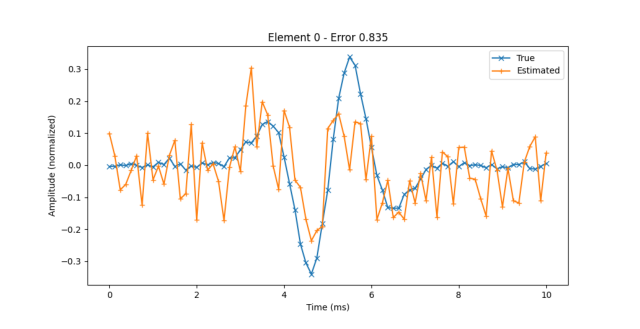

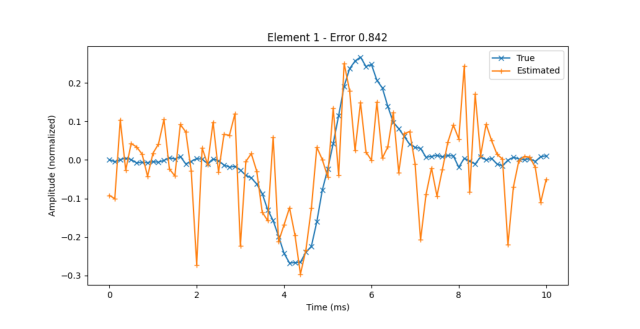

Final dictionary (shifted and interpolated truth):


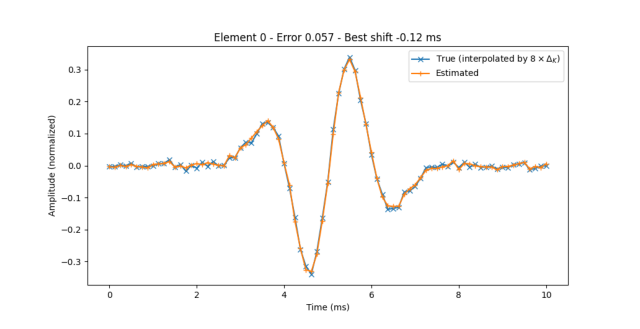

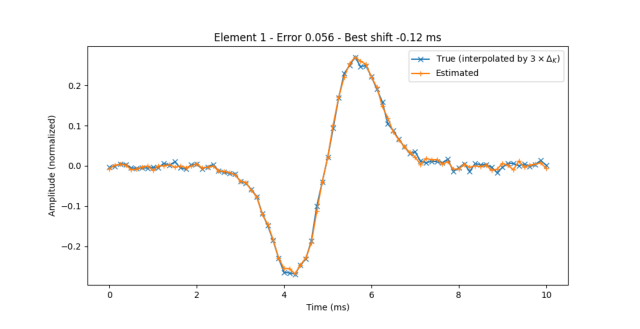

True positive on test set:


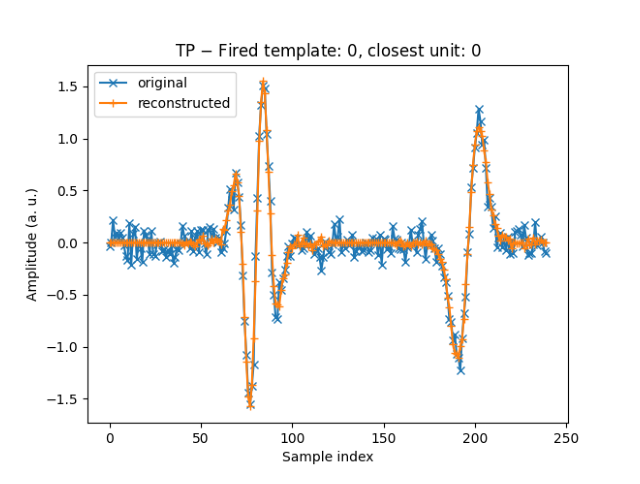

False positive on test set:
No false positive for test run.
Confusion matrix test:


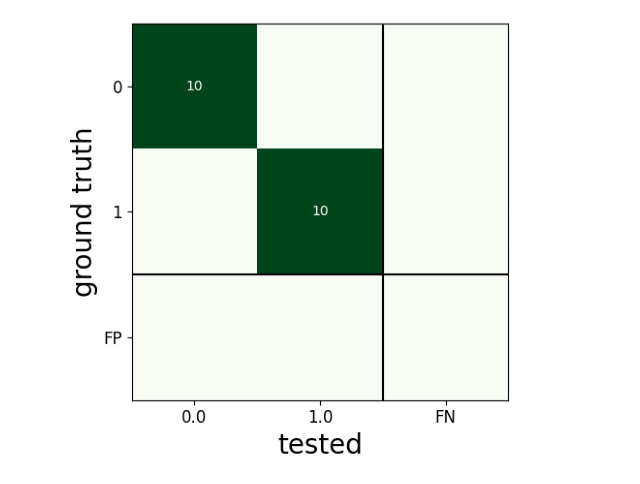

Time:


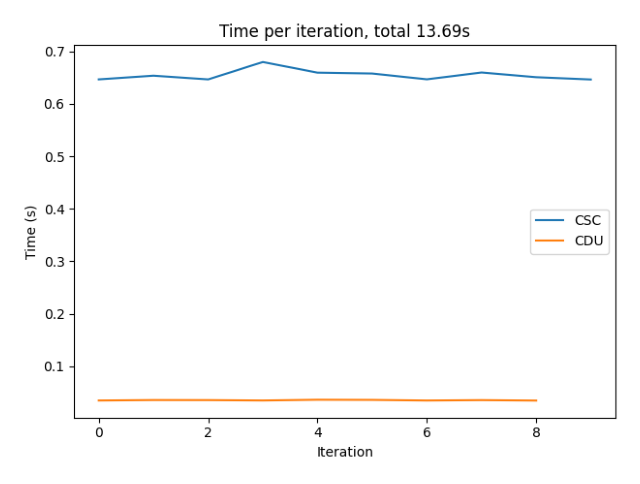

In [53]:
path = f"outputs/synth_experiments/experiment_{experiment}/single/interp_2_10/seed_{experiment+10}"
helper.show_plots(path)

In [54]:
# Single run without interpolation
run(f"ssrun dataset=synth_dataset_exp{experiment} model=synth_model_exp{experiment} experiment={experiment} model.cdl.interpolate=0")


experiment: 3
output:
  verbose: 2
  plot: 2
  preprocess:
    plot_traces: false
    plot_waveforms: false
    plot_snrs: false
  fp_threshold_ms: 15
dataset:
  type: synth
  name: synthetic
  recording: synthetic
  uri: null
  first_unit_index: null
  none_unit: null
  tstart_s: null
  tstop_s: null
  duration_s: null
  tstart_test_s: null
  tstop_test_s: null
  channel: 0
  detect_threshold: 5
  preprocess: false
  preprocess_params:
    freq_min: null
    freq_max: null
  window:
    split: true
    window_size_s: 0.015
  sources:
    num: 2
    length_ms: 10.125
  gen:
    seed: 13
    noise: 0.1
    amps:
    - 1
    - 2
    numOfEvents: 10
    T: 3
  fs: 8000
model:
  dictionary:
    num_elements: 2
    element_length_ms: 10.125
    init_templates: real_noisy
    real_random_noise: 0.2
    real_offset_ms: 0.5
  cdl:
    num_iterations: 10
    interpolate: 0
    sparsity_tol: 1
    sparsity_tol_test: 25
    rel_amp_split_test: 0.6
    error_tol: 0.01
    interpolator_type: sinc


Initial dictionary:


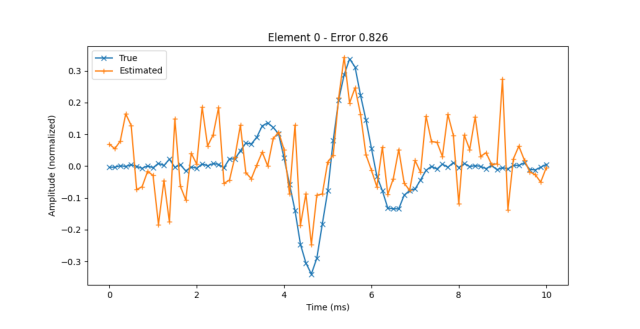

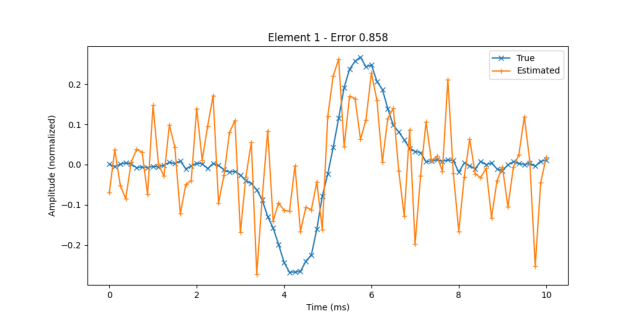

Final dictionary (shifted and interpolated truth):


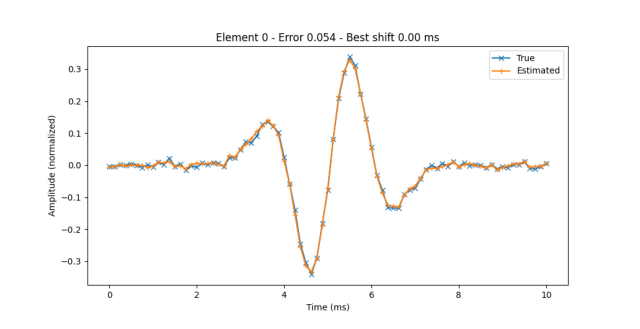

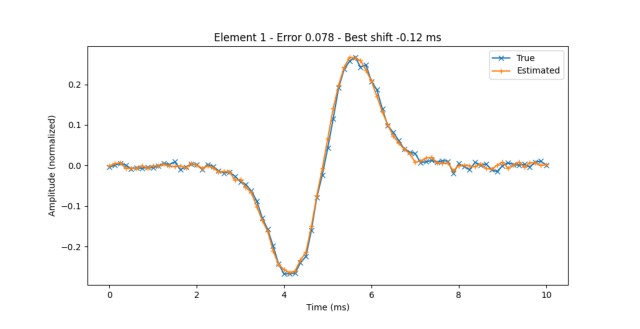

True positive on test set:


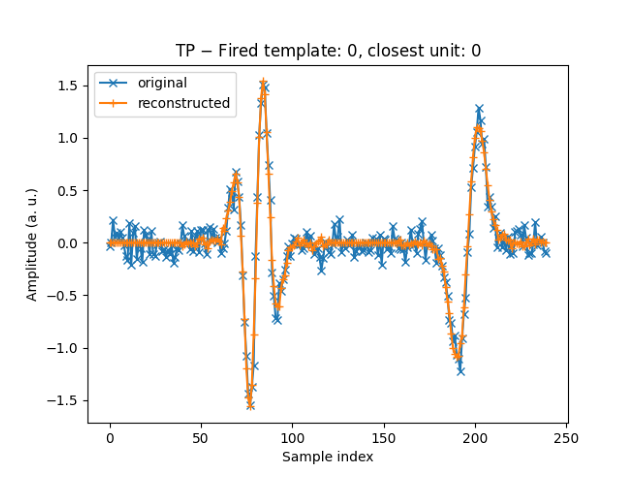

False positive on test set:
No false positive for test run.
Confusion matrix test:


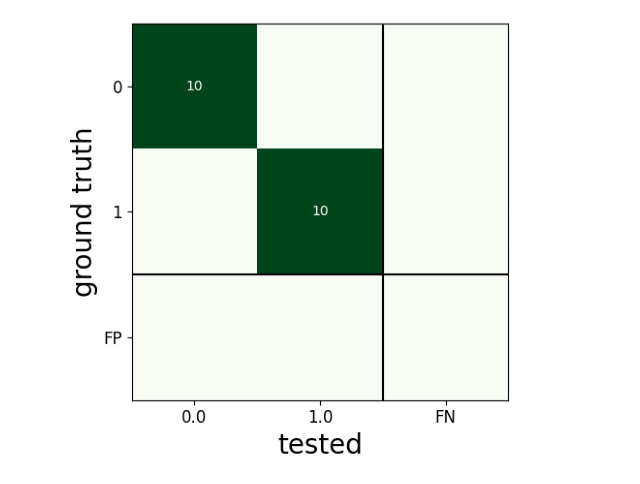

Time:


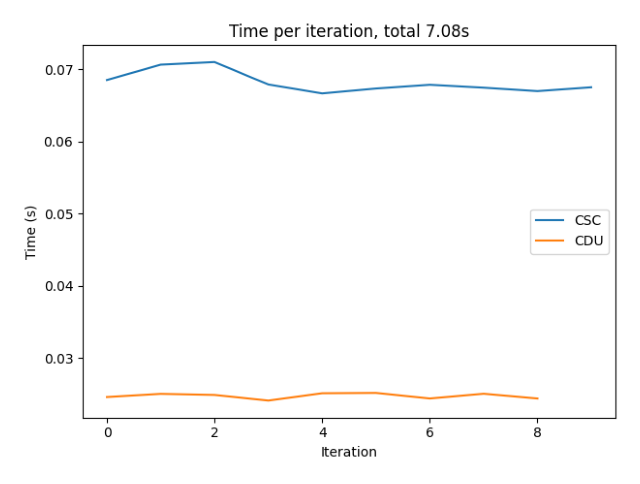

In [55]:
path = f"outputs/synth_experiments/experiment_{experiment}/single/interp_2_0/seed_{experiment+10}"
helper.show_plots(path)

In [56]:
# Run on multiple seeds
run(f"ssrun --multirun dataset=synth_dataset_exp{experiment} model=synth_model_exp{experiment} experiment={experiment} dataset.gen.seed=range(1,6) model.cdl.interpolate=0,10 output.verbose=0 output.plot=1")

[2024-01-09 19:39:24,763][HYDRA] Launching 10 jobs locally
[2024-01-09 19:39:24,763][HYDRA] 	#0 : dataset=synth_dataset_exp3 model=synth_model_exp3 experiment=3 dataset.gen.seed=1 model.cdl.interpolate=0 output.verbose=0 output.plot=1
extract waveforms shared_memory multi buffer: 100%|##########| 3/3 [00:00<00:00, 3007.39it/s]
Setting 'return_scaled' to False
detect peaks using by_channel: 100%|##########| 3/3 [00:00<00:00, 1499.39it/s]
C:\Users\PolletStars\Documents\Git\tsproj\cdlgr\model\cdl.py:403: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sub_spike_sorting["diff"] = diffs_norm
C:\Users\PolletStars\Documents\Git\tsproj\cdlgr\model\cdl.py:403: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try us

In [57]:
helper.report_multi_run_results(experiment)

Averaged accuracy:
interpolation: 0
unit 0: 1.000 +/- 0.000
unit 1: 1.000 +/- 0.000
Overall: 1.000 +/- 0.000

interpolation: 10
unit 0: 0.800 +/- 0.400
unit 1: 0.800 +/- 0.400
Overall: 0.800 +/- 0.400


--------------------------
Averaged precision:
interpolation: 0
unit 0: 1.000 +/- 0.000
unit 1: 1.000 +/- 0.000
Overall: 1.000 +/- 0.000

interpolation: 10
unit 0: 0.800 +/- 0.400
unit 1: 0.800 +/- 0.400
Overall: 0.800 +/- 0.400


--------------------------
Averaged recall:
interpolation: 0
unit 0: 1.000 +/- 0.000
unit 1: 1.000 +/- 0.000
Overall: 1.000 +/- 0.000

interpolation: 10
unit 0: 0.800 +/- 0.400
unit 1: 0.800 +/- 0.400
Overall: 0.800 +/- 0.400


--------------------------
Averaged error and time offset by interpolation and unit:
interpolation: 0
unit 0:
	error: 0.150 +/- 0.050
	offset: 0.075 ms +/- 0.061 ms
unit 1:
	error: 0.079 +/- 0.024
	offset: 0.050 ms +/- 0.100 ms
Overall:
	error: 0.11467050365818199 +/- 0.05288438651387261
	offset: 0.0625  ms +/- 0.08385254915624211 ms

i

**Observations**: Here again, we get good results. This experiment and the previous ones indicate that the algorithm is sensitive to initialization, as intializing with random noise gives bad results, and therefore getting a first coarse estimation of the templates helps a lot; moreover, this initialization does not have to be precise as shown here. Also, this time grid refinement diminishes the final reconstruction error. Lastly, note that the algorithm tends to learn the opposite of the true template; this is not problematic as the reconstruction can be done by taking an negative code, so this was not penalized in the computation of the error.

#### Experiment 4

Dictionary is initialized with real templates, horizontally offset by +2 ms.

In [58]:
experiment = 4

In [59]:
# Single run with interpolation
run(f"ssrun dataset=synth_dataset_exp{experiment} model=synth_model_exp{experiment} experiment={experiment}")


experiment: 4
output:
  verbose: 2
  plot: 2
  preprocess:
    plot_traces: false
    plot_waveforms: false
    plot_snrs: false
  fp_threshold_ms: 15
dataset:
  type: synth
  name: synthetic
  recording: synthetic
  uri: null
  first_unit_index: null
  none_unit: null
  tstart_s: null
  tstop_s: null
  duration_s: null
  tstart_test_s: null
  tstop_test_s: null
  channel: 0
  detect_threshold: 5
  preprocess: false
  preprocess_params:
    freq_min: null
    freq_max: null
  window:
    split: true
    window_size_s: 0.015
  sources:
    num: 2
    length_ms: 10.125
  gen:
    seed: 14
    noise: 0.1
    amps:
    - 1
    - 2
    numOfEvents: 10
    T: 3
  fs: 8000
model:
  dictionary:
    num_elements: 2
    element_length_ms: 10.125
    init_templates: real_offset
    real_random_noise: 0.2
    real_offset_ms: 2
  cdl:
    num_iterations: 10
    interpolate: 10
    sparsity_tol: 1
    sparsity_tol_test: 25
    rel_amp_split_test: 0.6
    error_tol: 0.01
    interpolator_type: sinc


Initial dictionary:


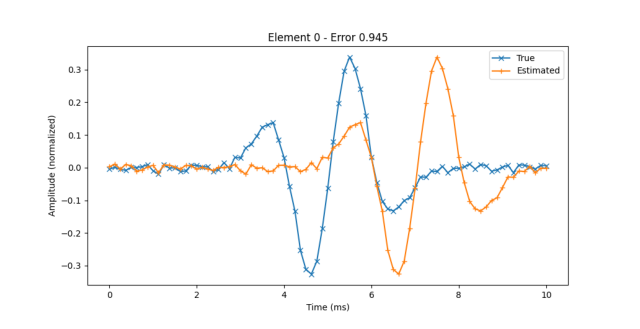

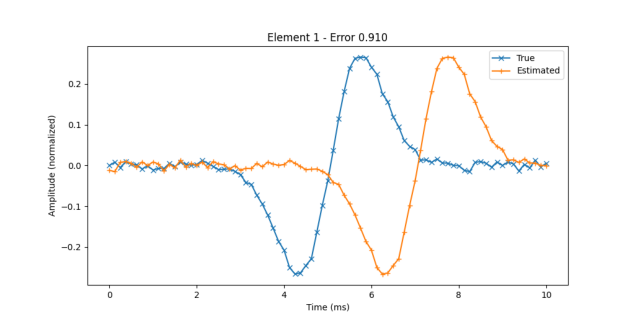

Final dictionary (shifted and interpolated truth):


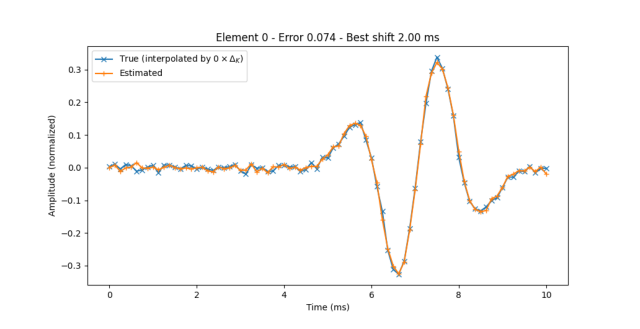

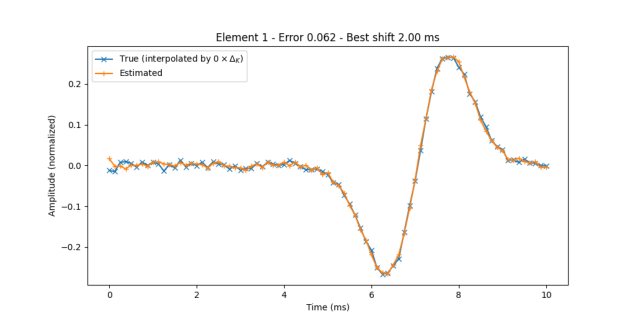

True positive on test set:


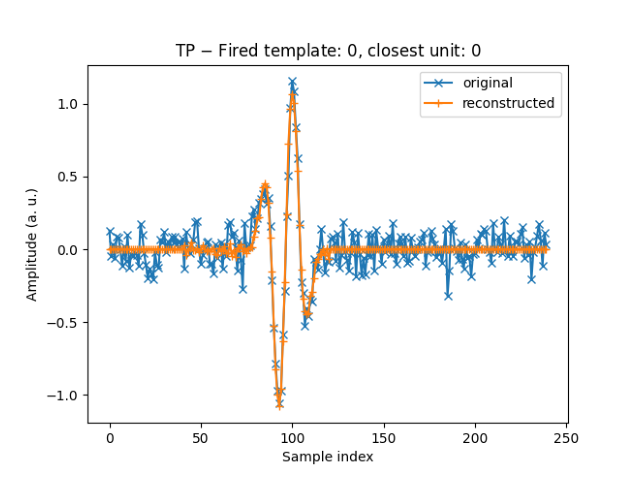

False positive on test set:


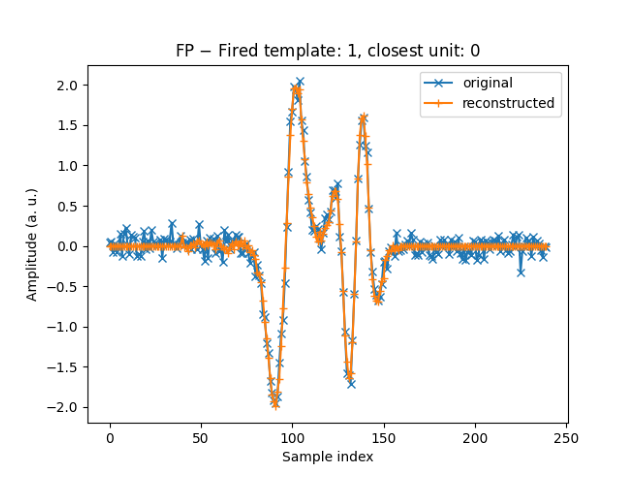

Confusion matrix test:


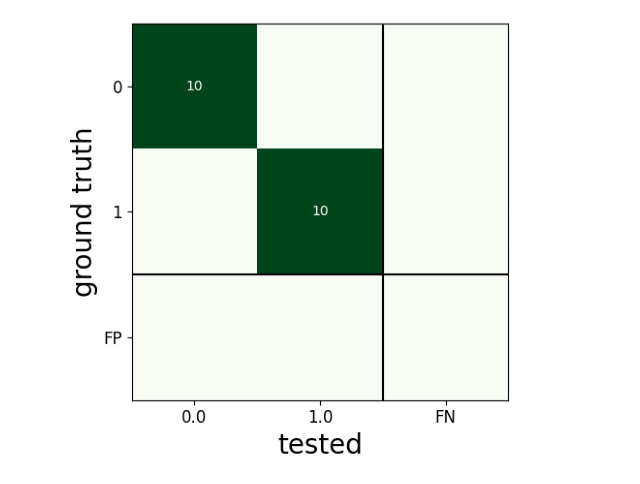

Time:


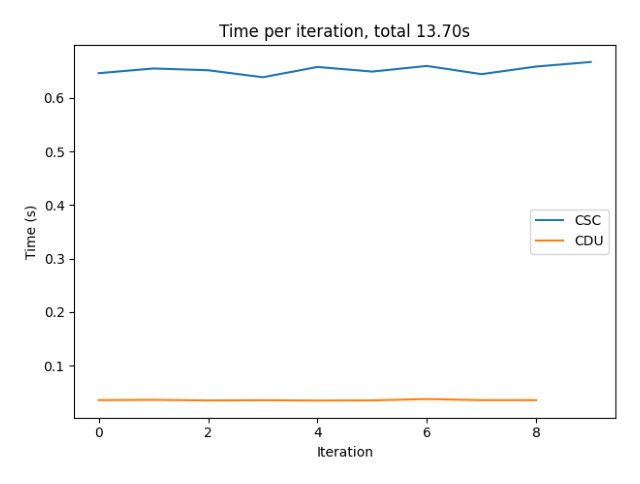

In [60]:
path = f"outputs/synth_experiments/experiment_{experiment}/single/interp_2_10/seed_{experiment+10}"
helper.show_plots(path)

In [61]:
# Single run without interpolation
run(f"ssrun dataset=synth_dataset_exp{experiment} model=synth_model_exp{experiment} experiment={experiment} model.cdl.interpolate=0")


experiment: 4
output:
  verbose: 2
  plot: 2
  preprocess:
    plot_traces: false
    plot_waveforms: false
    plot_snrs: false
  fp_threshold_ms: 15
dataset:
  type: synth
  name: synthetic
  recording: synthetic
  uri: null
  first_unit_index: null
  none_unit: null
  tstart_s: null
  tstop_s: null
  duration_s: null
  tstart_test_s: null
  tstop_test_s: null
  channel: 0
  detect_threshold: 5
  preprocess: false
  preprocess_params:
    freq_min: null
    freq_max: null
  window:
    split: true
    window_size_s: 0.015
  sources:
    num: 2
    length_ms: 10.125
  gen:
    seed: 14
    noise: 0.1
    amps:
    - 1
    - 2
    numOfEvents: 10
    T: 3
  fs: 8000
model:
  dictionary:
    num_elements: 2
    element_length_ms: 10.125
    init_templates: real_offset
    real_random_noise: 0.2
    real_offset_ms: 2
  cdl:
    num_iterations: 10
    interpolate: 0
    sparsity_tol: 1
    sparsity_tol_test: 25
    rel_amp_split_test: 0.6
    error_tol: 0.01
    interpolator_type: sinc
 

Initial dictionary:


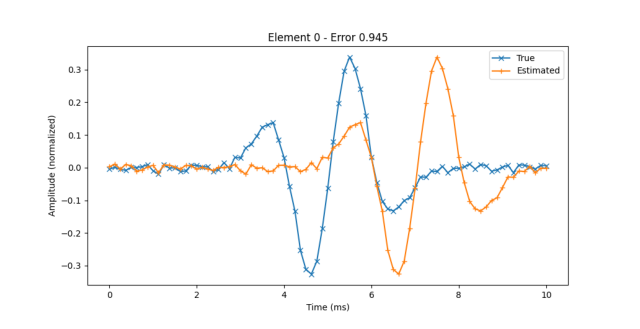

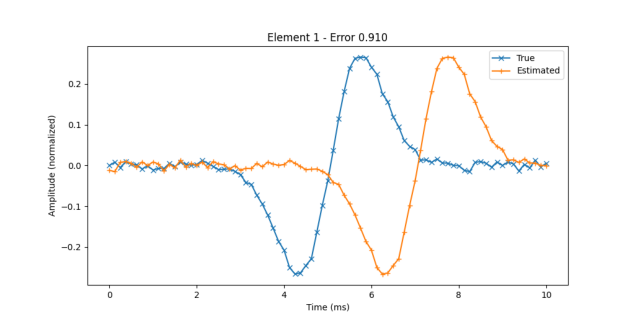

Final dictionary (shifted and interpolated truth):


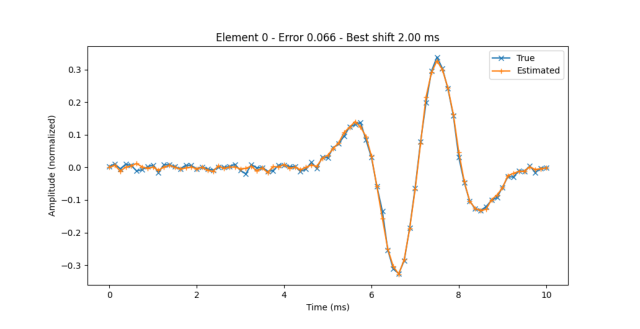

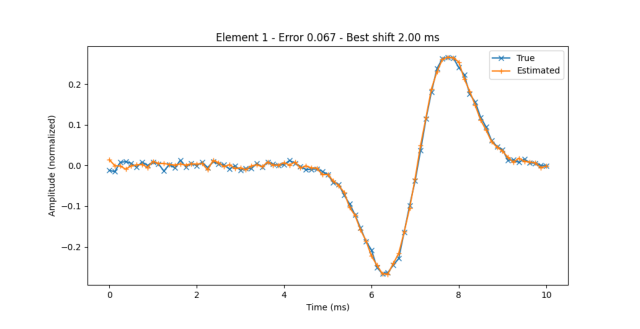

True positive on test set:


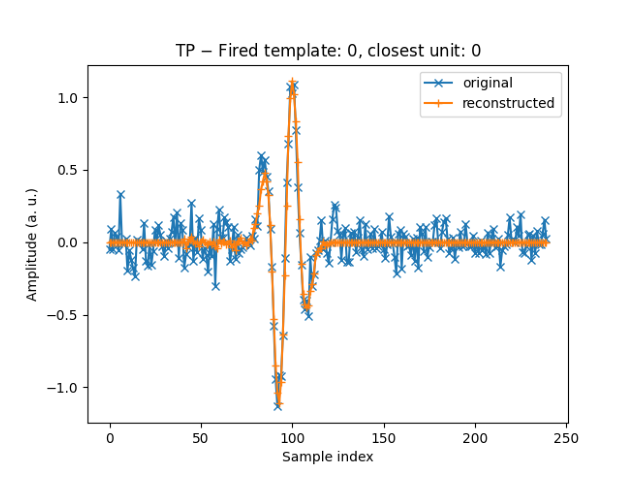

False positive on test set:


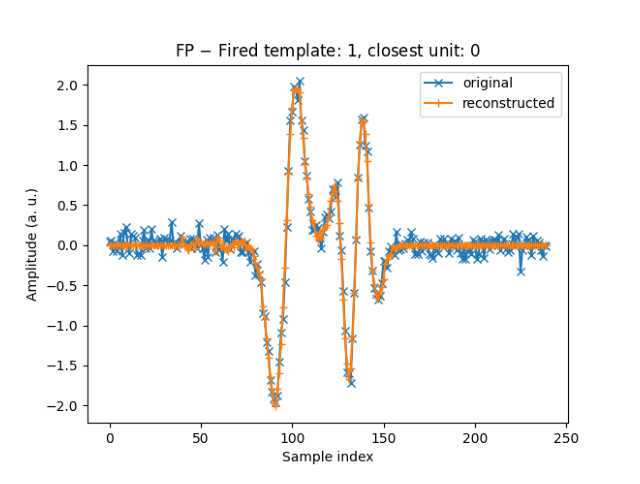

Confusion matrix test:


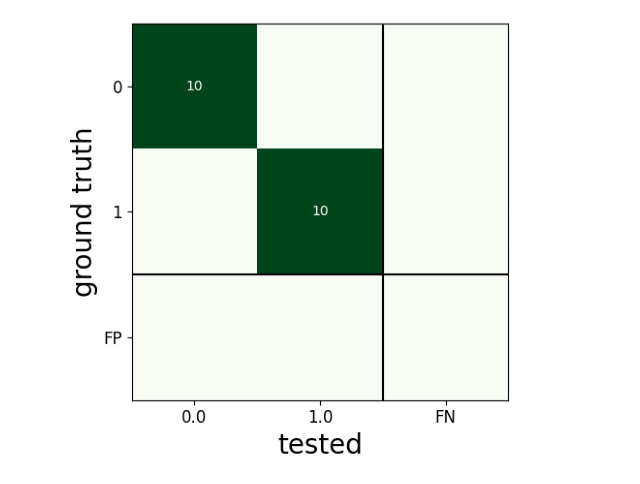

Time:


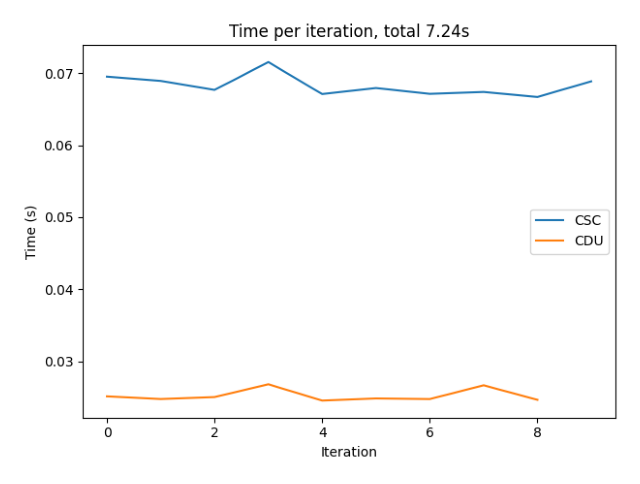

In [62]:
path = f"outputs/synth_experiments/experiment_{experiment}/single/interp_2_0/seed_{experiment+10}"
helper.show_plots(path)

In [63]:
# Run on multiple seeds
run(f"ssrun --multirun dataset=synth_dataset_exp{experiment} model=synth_model_exp{experiment} experiment={experiment} dataset.gen.seed=range(1,6) model.cdl.interpolate=0,10 output.verbose=0 output.plot=1")

[2024-01-09 19:42:07,108][HYDRA] Launching 10 jobs locally
[2024-01-09 19:42:07,109][HYDRA] 	#0 : dataset=synth_dataset_exp4 model=synth_model_exp4 experiment=4 dataset.gen.seed=1 model.cdl.interpolate=0 output.verbose=0 output.plot=1
extract waveforms shared_memory multi buffer: 100%|##########| 3/3 [00:00<00:00, 3013.15it/s]
Setting 'return_scaled' to False
detect peaks using by_channel: 100%|##########| 3/3 [00:00<00:00, 1500.29it/s]
C:\Users\PolletStars\Documents\Git\tsproj\cdlgr\model\dictionary.py:140: RuntimeWarning: invalid value encountered in sqrt
  dist = np.sqrt(1-np.power(np.dot(np.roll(interpolated_gt,o),estimated_dict),2))
C:\Users\PolletStars\Documents\Git\tsproj\cdlgr\model\cdl.py:403: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [64]:
helper.report_multi_run_results(experiment)

Averaged accuracy:
interpolation: 0
unit 0: 1.000 +/- 0.000
unit 1: 1.000 +/- 0.000
Overall: 1.000 +/- 0.000

interpolation: 10
unit 0: 1.000 +/- 0.000
unit 1: 1.000 +/- 0.000
Overall: 1.000 +/- 0.000


--------------------------
Averaged precision:
interpolation: 0
unit 0: 1.000 +/- 0.000
unit 1: 1.000 +/- 0.000
Overall: 1.000 +/- 0.000

interpolation: 10
unit 0: 1.000 +/- 0.000
unit 1: 1.000 +/- 0.000
Overall: 1.000 +/- 0.000


--------------------------
Averaged recall:
interpolation: 0
unit 0: 1.000 +/- 0.000
unit 1: 1.000 +/- 0.000
Overall: 1.000 +/- 0.000

interpolation: 10
unit 0: 1.000 +/- 0.000
unit 1: 1.000 +/- 0.000
Overall: 1.000 +/- 0.000


--------------------------
Averaged error and time offset by interpolation and unit:
interpolation: 0
unit 0:
	error: 0.081 +/- 0.016
	offset: 2.000 ms +/- 0.000 ms
unit 1:
	error: 0.064 +/- 0.013
	offset: 2.000 ms +/- 0.000 ms
Overall:
	error: 0.07218912357541224 +/- 0.01704711261011975
	offset: 2.0  ms +/- 0.0 ms

interpolation: 10
un

**Observations**: The algorithm preserves the shift in its learnt dictionary, which does not hinder reconstruction as the code can be adapted to solve this issue; but this makes interpreting the event detection more difficult in a broader context of application.

#### Experiment 5

The signal is generated using 5 templates

In [65]:
experiment = 5

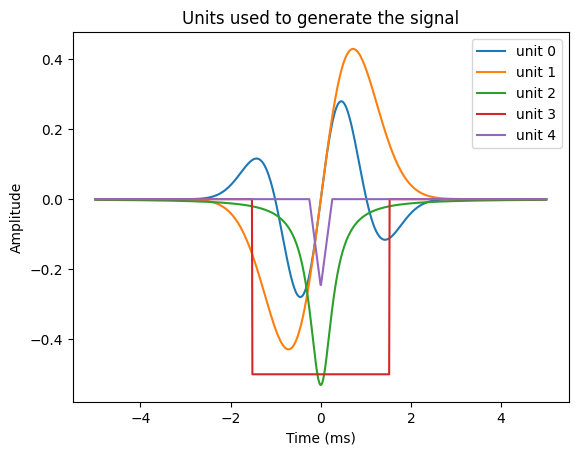

In [66]:
filter_length = 10.125
factor = 10/filter_length
dictionary = {}
dictionary[0] = lambda x: (factor*x)*np.exp(-(factor*x)**2)*np.cos(2*np.pi*(factor*x)/4)
dictionary[1] = lambda x: (factor*x)*np.exp(-(factor*x)**2)
gamma = 0.3
dictionary[2] = lambda x: -0.5/np.pi * gamma / ((factor*x)**2 + gamma**2)  # Cauchy distribution-shaped
dictionary[3] = lambda x: -0.5*(np.abs((factor*x)) <= 1.5)
dictionary[4] = lambda x: -0.5*np.where(np.abs((factor*x)) <= 0.25, 0.5 - 2 * np.abs((factor*x)), 0)


times = np.linspace(-5, 5, 1000)
for i in range(5):
    plt.plot(times, dictionary[i](times), label=f"unit {i}")
plt.xlabel("Time (ms)")
plt.ylabel("Amplitude")
plt.legend()
plt.title("Units used to generate the signal")
plt.show()

In [67]:
# Single run with interpolation
run(f"ssrun dataset=synth_dataset_exp{experiment} model=synth_model_exp{experiment} experiment={experiment}")


experiment: 5
output:
  verbose: 2
  plot: 2
  preprocess:
    plot_traces: false
    plot_waveforms: false
    plot_snrs: false
  fp_threshold_ms: 15
dataset:
  type: synth
  name: synthetic
  recording: synthetic
  uri: null
  first_unit_index: null
  none_unit: null
  tstart_s: null
  tstop_s: null
  duration_s: null
  tstart_test_s: null
  tstop_test_s: null
  channel: 0
  detect_threshold: 5
  preprocess: false
  preprocess_params:
    freq_min: null
    freq_max: null
  window:
    split: true
    window_size_s: 0.015
  sources:
    num: 5
    length_ms: 10.125
  gen:
    seed: 15
    noise: 0.1
    amps:
    - 1
    - 2
    numOfEvents: 10
    T: 3
  fs: 8000
model:
  dictionary:
    num_elements: 5
    element_length_ms: 10.125
    init_templates: real_noisy
    real_random_noise: 0.2
    real_offset_ms: 0.5
  cdl:
    num_iterations: 10
    interpolate: 10
    sparsity_tol: 1
    sparsity_tol_test: 25
    rel_amp_split_test: 0.6
    error_tol: 0.01
    interpolator_type: sinc

Initial dictionary:


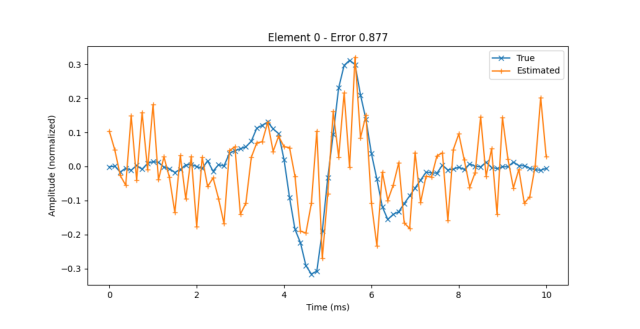

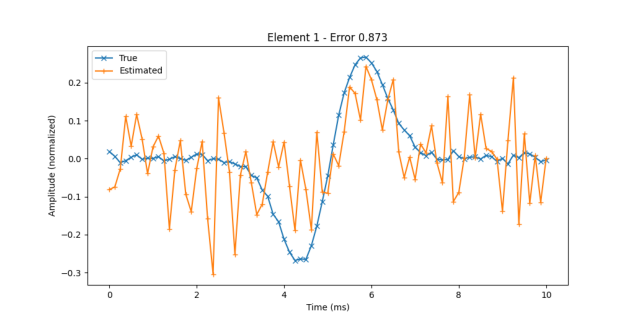

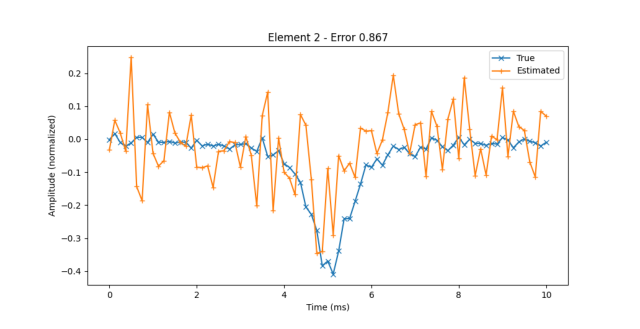

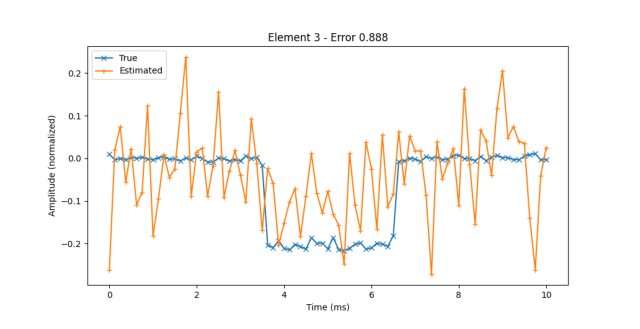

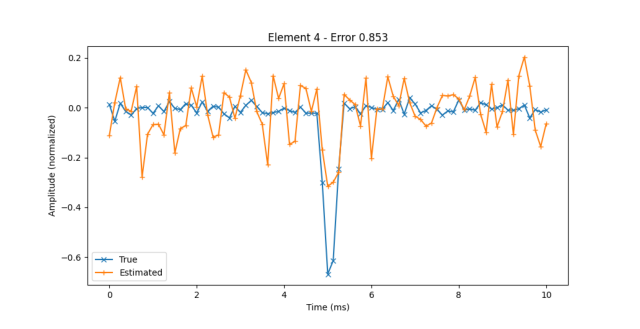

Final dictionary (shifted and interpolated truth):


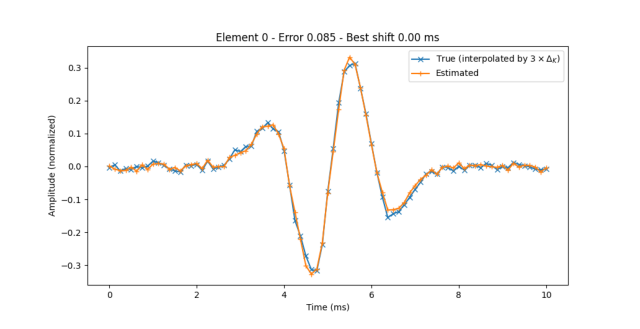

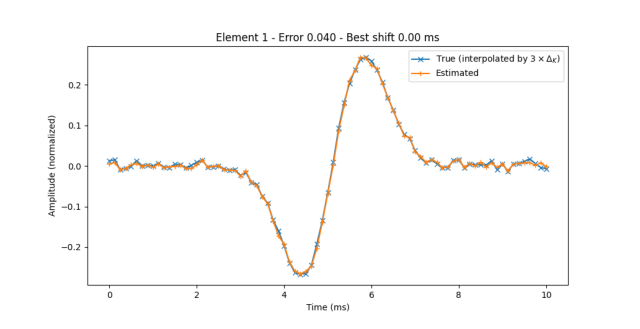

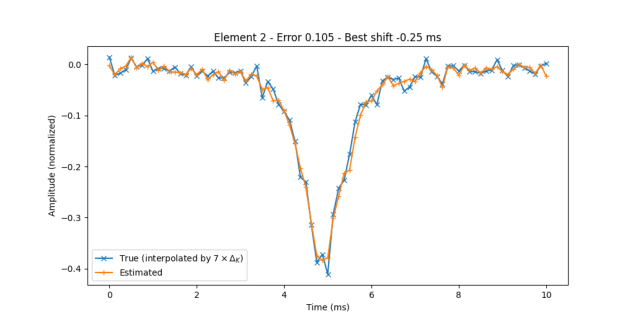

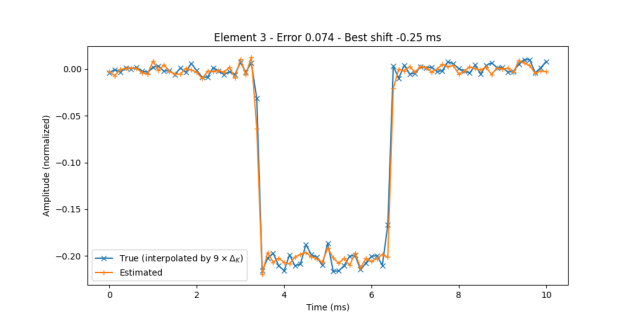

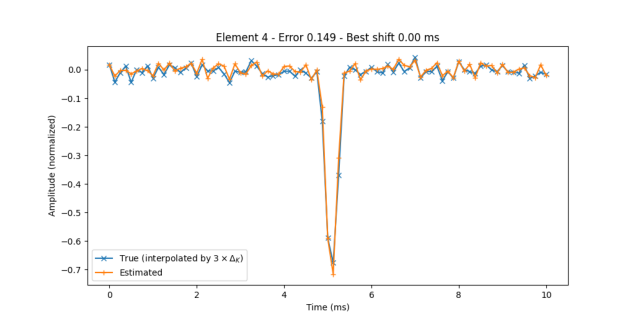

True positive on test set:


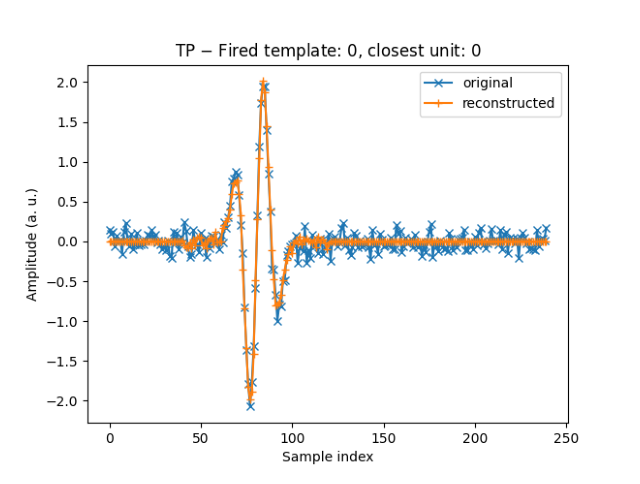

False positive on test set:


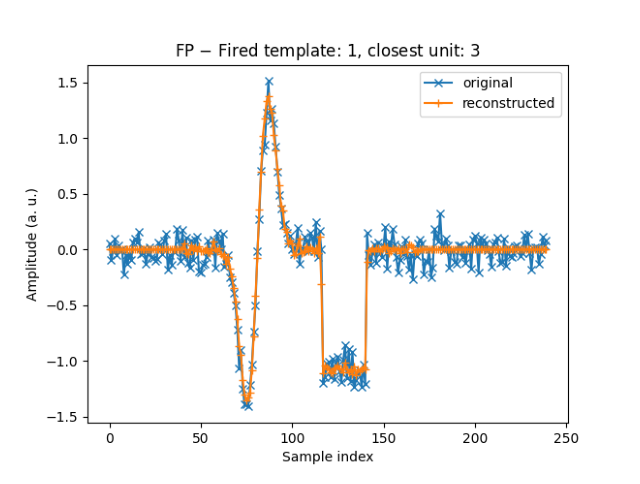

Confusion matrix test:


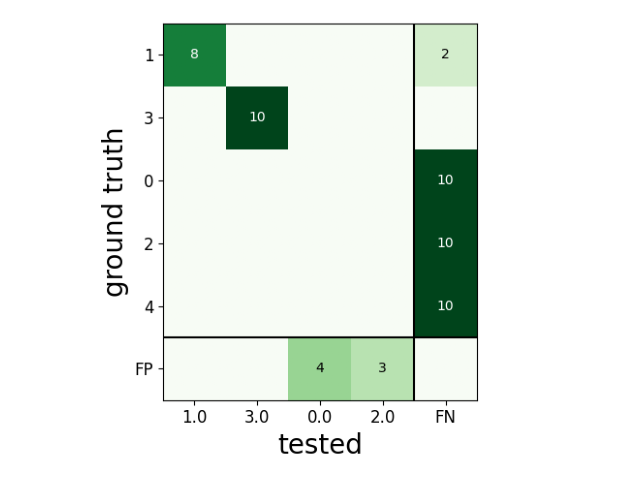

Time:


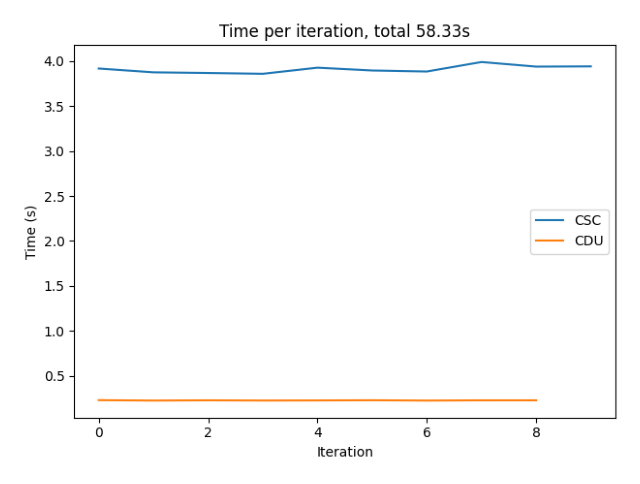

In [68]:
path = f"outputs/synth_experiments/experiment_{experiment}/single/interp_5_10/seed_{experiment+10}/"
helper.show_plots(path, num_elements=5)

In [69]:
# Single run without interpolation
run(f"ssrun dataset=synth_dataset_exp{experiment} model=synth_model_exp{experiment} experiment={experiment} model.cdl.interpolate=0")


experiment: 5
output:
  verbose: 2
  plot: 2
  preprocess:
    plot_traces: false
    plot_waveforms: false
    plot_snrs: false
  fp_threshold_ms: 15
dataset:
  type: synth
  name: synthetic
  recording: synthetic
  uri: null
  first_unit_index: null
  none_unit: null
  tstart_s: null
  tstop_s: null
  duration_s: null
  tstart_test_s: null
  tstop_test_s: null
  channel: 0
  detect_threshold: 5
  preprocess: false
  preprocess_params:
    freq_min: null
    freq_max: null
  window:
    split: true
    window_size_s: 0.015
  sources:
    num: 5
    length_ms: 10.125
  gen:
    seed: 15
    noise: 0.1
    amps:
    - 1
    - 2
    numOfEvents: 10
    T: 3
  fs: 8000
model:
  dictionary:
    num_elements: 5
    element_length_ms: 10.125
    init_templates: real_noisy
    real_random_noise: 0.2
    real_offset_ms: 0.5
  cdl:
    num_iterations: 10
    interpolate: 0
    sparsity_tol: 1
    sparsity_tol_test: 25
    rel_amp_split_test: 0.6
    error_tol: 0.01
    interpolator_type: sinc


Initial dictionary:


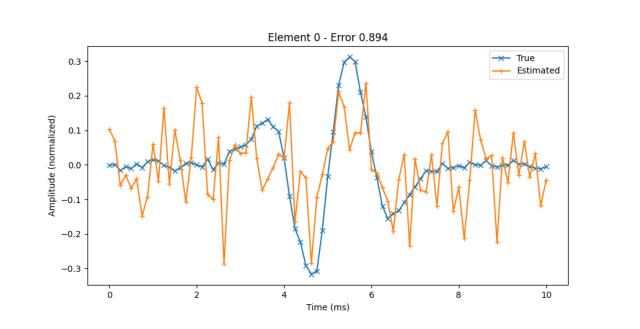

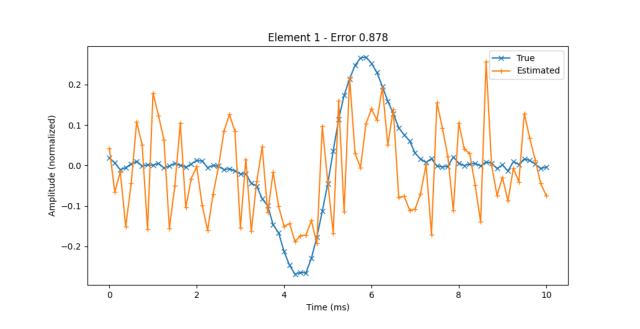

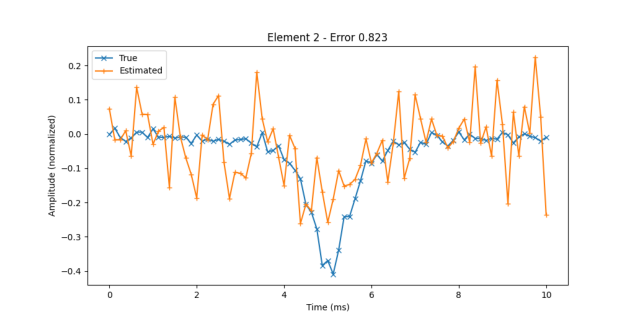

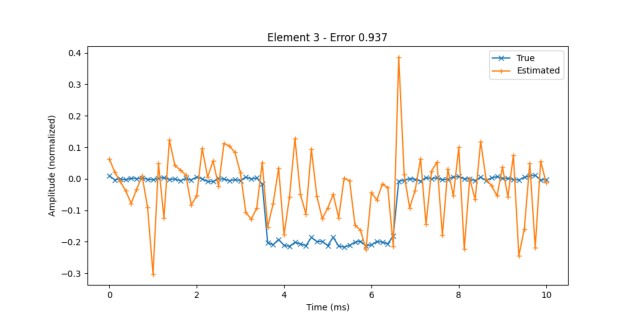

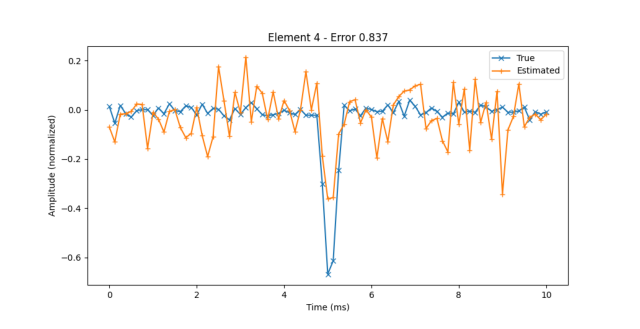

Final dictionary (shifted and interpolated truth):


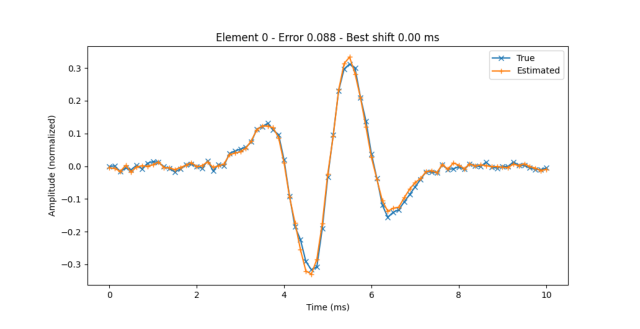

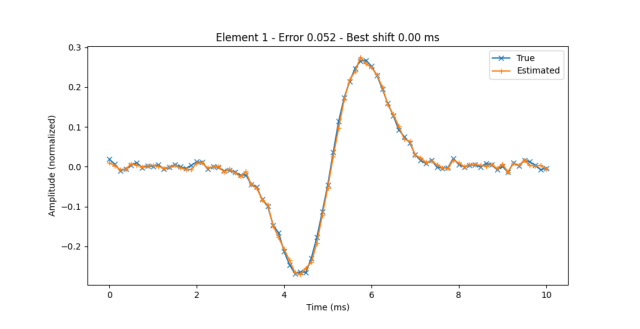

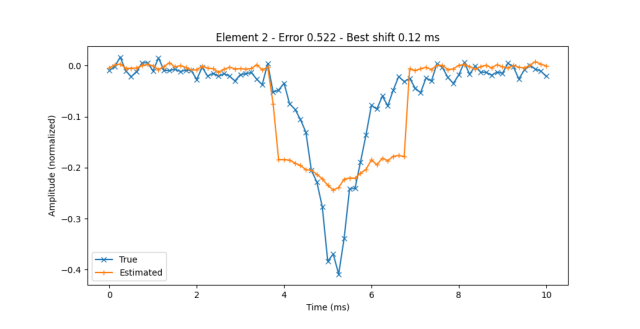

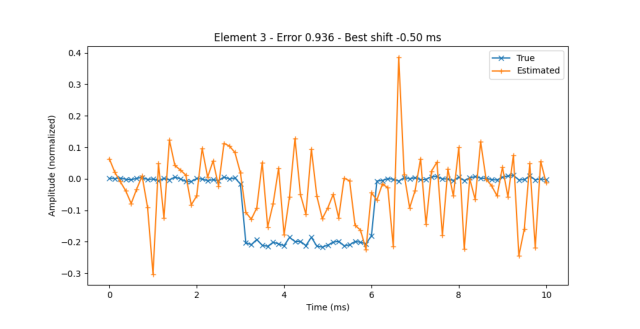

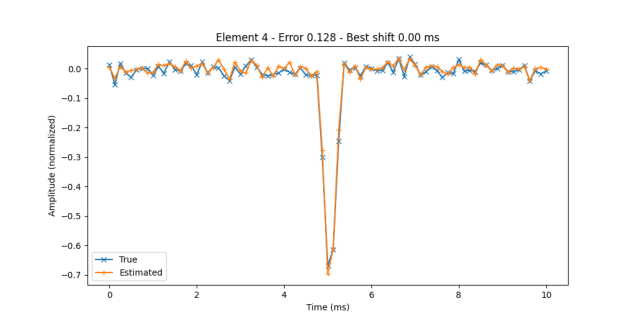

True positive on test set:


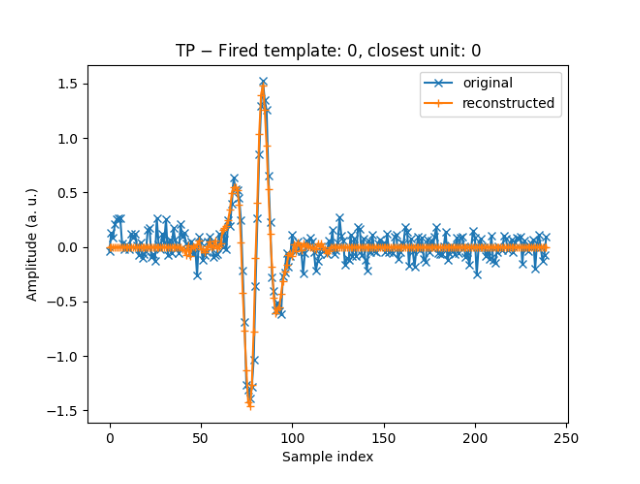

False positive on test set:


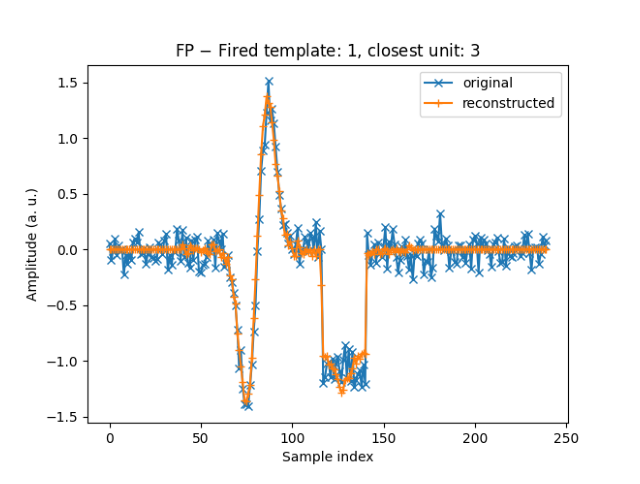

Confusion matrix test:


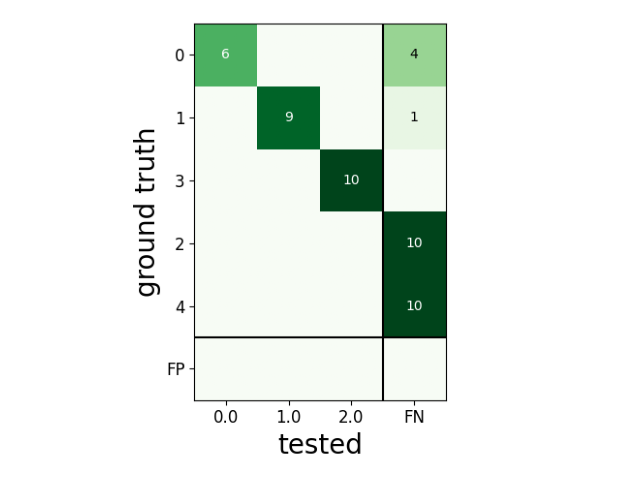

Time:


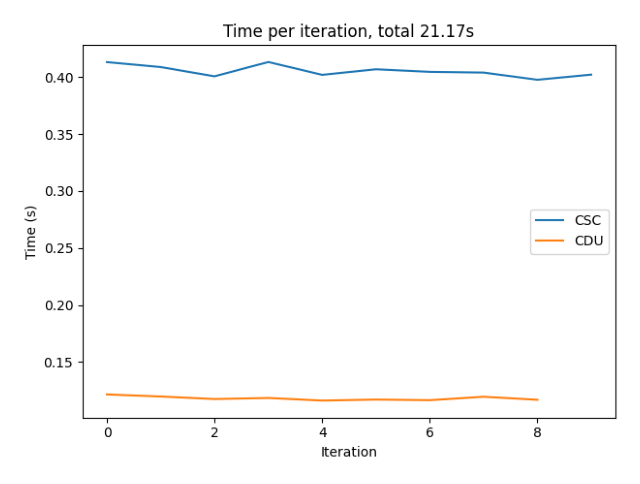

In [70]:
path = f"outputs/synth_experiments/experiment_{experiment}/single/interp_5_0/seed_{experiment+10}/"
helper.show_plots(path, num_elements=5)

In [71]:
# Run on multiple seeds
run(f"ssrun --multirun dataset=synth_dataset_exp{experiment} model=synth_model_exp{experiment} experiment={experiment} dataset.gen.seed=range(1,6) model.cdl.interpolate=0,10 output.verbose=0 output.plot=1")

[2024-01-09 19:46:02,213][HYDRA] Launching 10 jobs locally
[2024-01-09 19:46:02,213][HYDRA] 	#0 : dataset=synth_dataset_exp5 model=synth_model_exp5 experiment=5 dataset.gen.seed=1 model.cdl.interpolate=0 output.verbose=0 output.plot=1
extract waveforms shared_memory multi buffer: 100%|##########| 3/3 [00:00<00:00, 3000.22it/s]
Setting 'return_scaled' to False
detect peaks using by_channel: 100%|##########| 3/3 [00:00<00:00, 1500.82it/s]
C:\Users\PolletStars\Documents\Git\tsproj\cdlgr\outputs\plot.py:141: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(10,5))
C:\Users\PolletStars\Documents\Git\tsproj\cdlgr\model\cdl.py:403: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a D

In [72]:
helper.report_multi_run_results(experiment, num_elements=5)

Averaged accuracy:
interpolation: 0
unit 0: 0.540 +/- 0.287
unit 1: 0.640 +/- 0.326
unit 2: 0.000 +/- 0.000
unit 3: 0.933 +/- 0.082
unit 4: 0.000 +/- 0.000
Overall: 0.423 +/- 0.418

interpolation: 10
unit 0: 0.540 +/- 0.287
unit 1: 0.460 +/- 0.377
unit 2: 0.000 +/- 0.000
unit 3: 0.967 +/- 0.067
unit 4: 0.000 +/- 0.000
Overall: 0.393 +/- 0.423


--------------------------
Averaged precision:
interpolation: 0
unit 0: 0.800 +/- 0.400
unit 1: 0.800 +/- 0.400
unit 2: 0.000 +/- 0.000
unit 3: 0.933 +/- 0.082
unit 4: 0.000 +/- 0.000
Overall: 0.507 +/- 0.489

interpolation: 10
unit 0: 0.800 +/- 0.400
unit 1: 0.600 +/- 0.490
unit 2: 0.000 +/- 0.000
unit 3: 0.967 +/- 0.067
unit 4: 0.000 +/- 0.000
Overall: 0.473 +/- 0.494


--------------------------
Averaged recall:
interpolation: 0
unit 0: 0.540 +/- 0.287
unit 1: 0.640 +/- 0.326
unit 2: 0.000 +/- 0.000
unit 3: 1.000 +/- 0.000
unit 4: 0.000 +/- 0.000
Overall: 0.436 +/- 0.433

interpolation: 10
unit 0: 0.540 +/- 0.287
unit 1: 0.460 +/- 0.377
unit 

**Observations**: Both algorithms struggle with a greater number of sources, especially due to units 2 and 4 which are very similar, and also very simple (and thus easily confused with random noise). Furthermore, it seems that the algorithm without interpolation better fits the real dictionary. Taking a closer look at some of the reconstructions for this multiple-run, we observe that the algorithm without interpolation actually better fits background random noise, which has a strong impact as some of the units are very narrowed around the center of the unit time-frame.

#### Experiment 6
Standard deviation of the background noise is increased to 0.3 (default was 0.1).

In [73]:
experiment = 6

In [74]:
# Single run with interpolation
run(f"ssrun dataset=synth_dataset_exp{experiment} model=synth_model_exp{experiment} experiment={experiment}")


experiment: 6
output:
  verbose: 2
  plot: 2
  preprocess:
    plot_traces: false
    plot_waveforms: false
    plot_snrs: false
  fp_threshold_ms: 15
dataset:
  type: synth
  name: synthetic
  recording: synthetic
  uri: null
  first_unit_index: null
  none_unit: null
  tstart_s: null
  tstop_s: null
  duration_s: null
  tstart_test_s: null
  tstop_test_s: null
  channel: 0
  detect_threshold: 5
  preprocess: false
  preprocess_params:
    freq_min: null
    freq_max: null
  window:
    split: true
    window_size_s: 0.015
  sources:
    num: 2
    length_ms: 10.125
  gen:
    seed: 16
    noise: 0.3
    amps:
    - 1
    - 2
    numOfEvents: 10
    T: 3
  fs: 8000
model:
  dictionary:
    num_elements: 2
    element_length_ms: 10.125
    init_templates: real_noisy
    real_random_noise: 0.2
    real_offset_ms: 0.5
  cdl:
    num_iterations: 10
    interpolate: 10
    sparsity_tol: 1
    sparsity_tol_test: 25
    rel_amp_split_test: 0.6
    error_tol: 0.01
    interpolator_type: sinc

Initial dictionary:


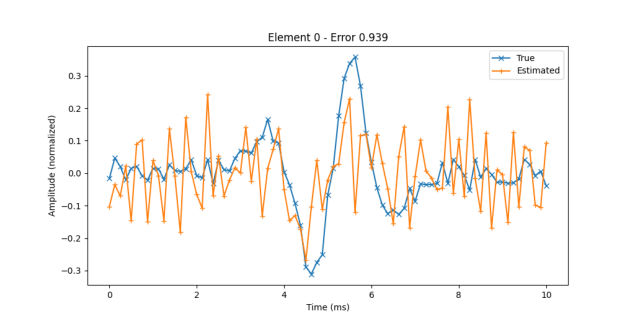

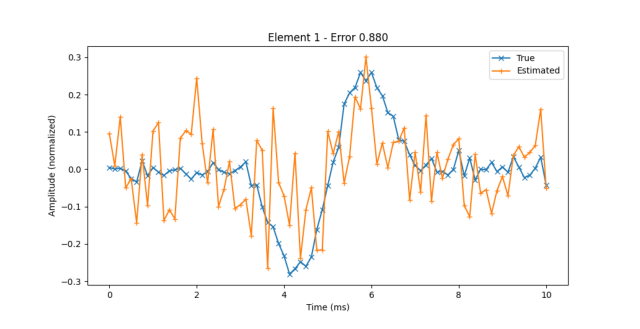

Final dictionary (shifted and interpolated truth):


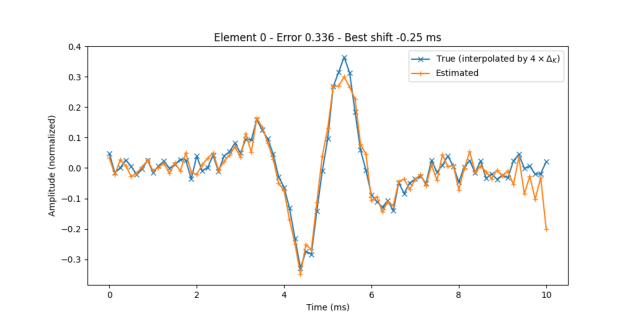

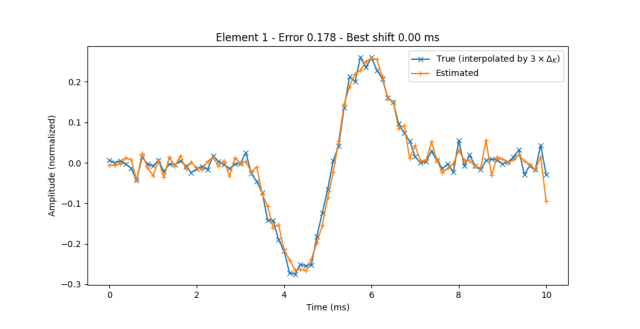

True positive on test set:


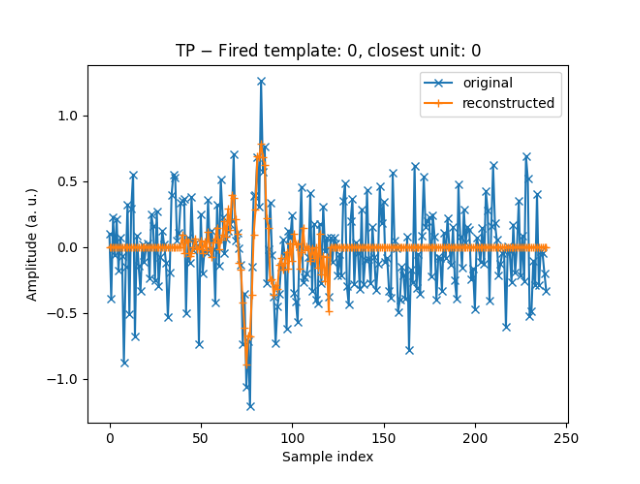

False positive on test set:
No false positive for test run.
Confusion matrix test:


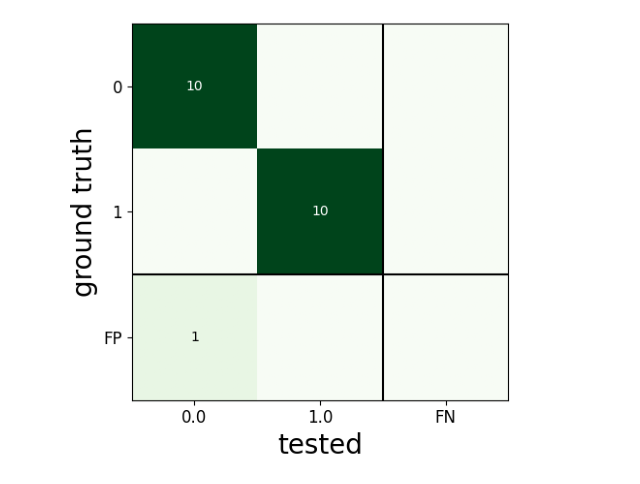

Time:


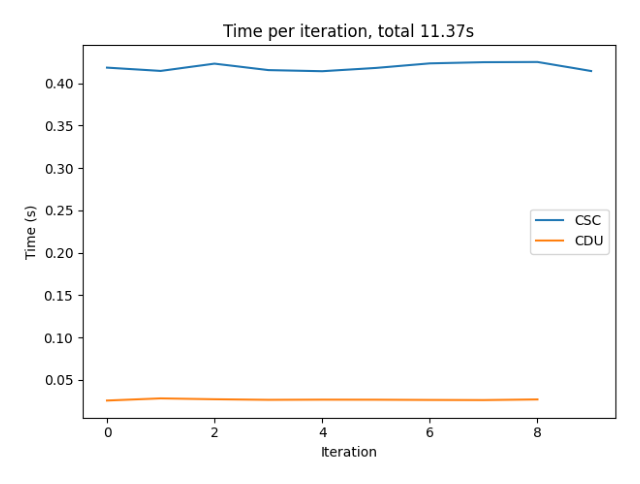

In [75]:
path = f"outputs/synth_experiments/experiment_{experiment}/single/interp_2_10/seed_{experiment+10}"
helper.show_plots(path)

In [76]:
# Single run without interpolation
run(f"ssrun dataset=synth_dataset_exp{experiment} model=synth_model_exp{experiment} experiment={experiment} model.cdl.interpolate=0")


experiment: 6
output:
  verbose: 2
  plot: 2
  preprocess:
    plot_traces: false
    plot_waveforms: false
    plot_snrs: false
  fp_threshold_ms: 15
dataset:
  type: synth
  name: synthetic
  recording: synthetic
  uri: null
  first_unit_index: null
  none_unit: null
  tstart_s: null
  tstop_s: null
  duration_s: null
  tstart_test_s: null
  tstop_test_s: null
  channel: 0
  detect_threshold: 5
  preprocess: false
  preprocess_params:
    freq_min: null
    freq_max: null
  window:
    split: true
    window_size_s: 0.015
  sources:
    num: 2
    length_ms: 10.125
  gen:
    seed: 16
    noise: 0.3
    amps:
    - 1
    - 2
    numOfEvents: 10
    T: 3
  fs: 8000
model:
  dictionary:
    num_elements: 2
    element_length_ms: 10.125
    init_templates: real_noisy
    real_random_noise: 0.2
    real_offset_ms: 0.5
  cdl:
    num_iterations: 10
    interpolate: 0
    sparsity_tol: 1
    sparsity_tol_test: 25
    rel_amp_split_test: 0.6
    error_tol: 0.01
    interpolator_type: sinc


Initial dictionary:


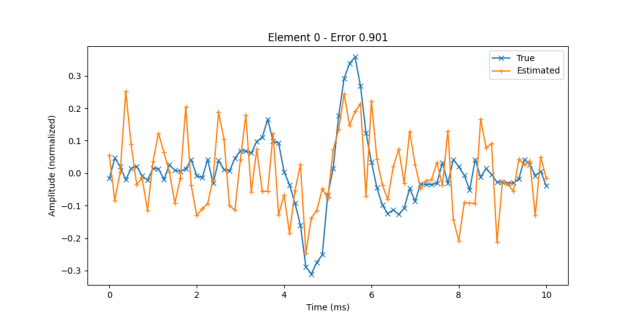

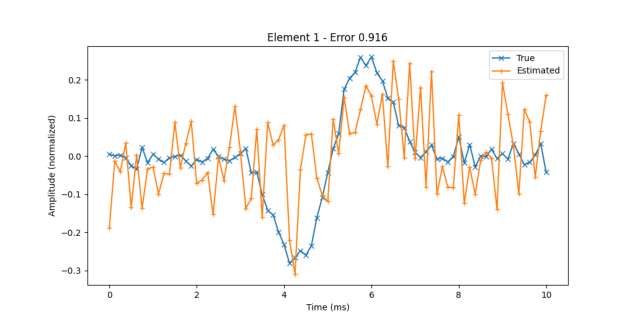

Final dictionary (shifted and interpolated truth):


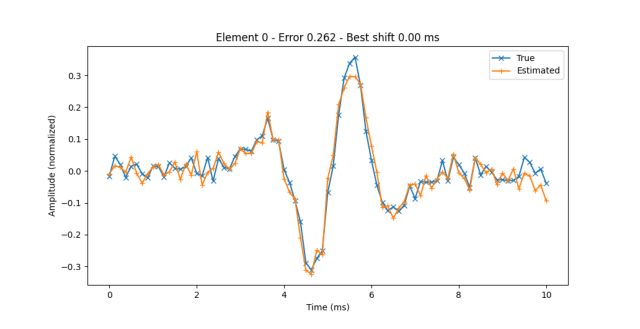

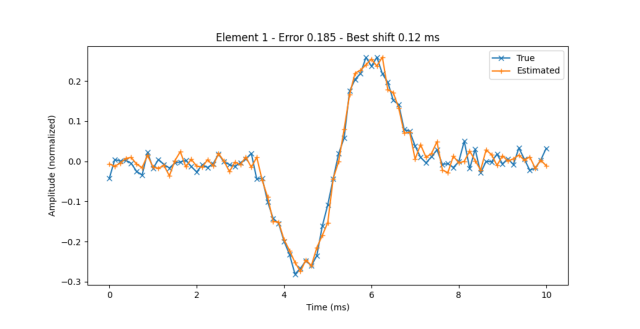

True positive on test set:


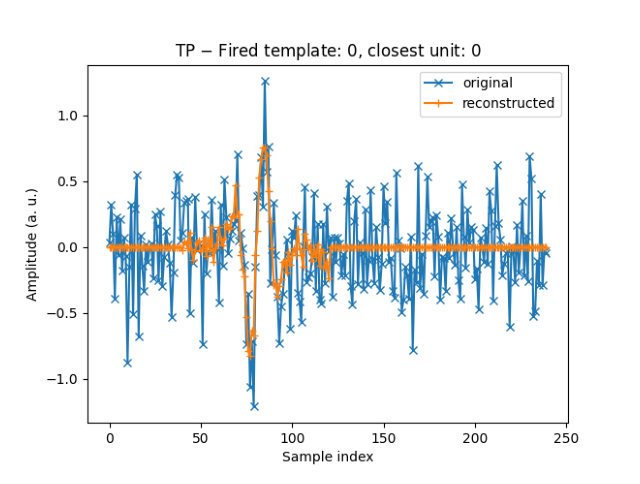

False positive on test set:


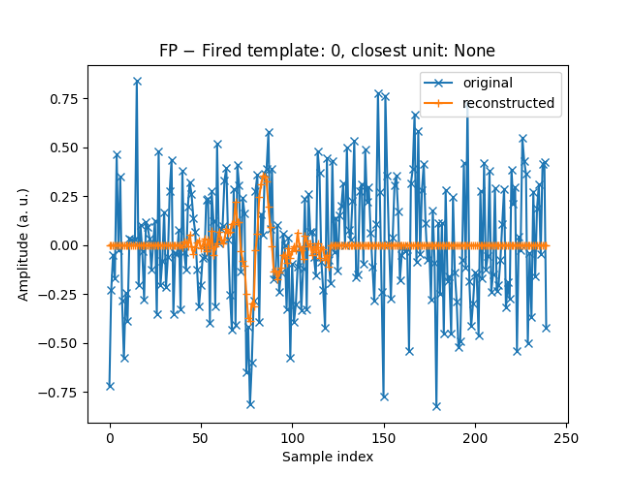

Confusion matrix test:


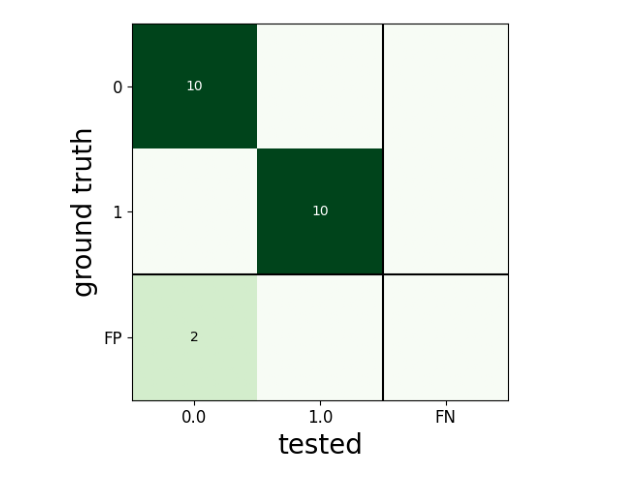

Time:


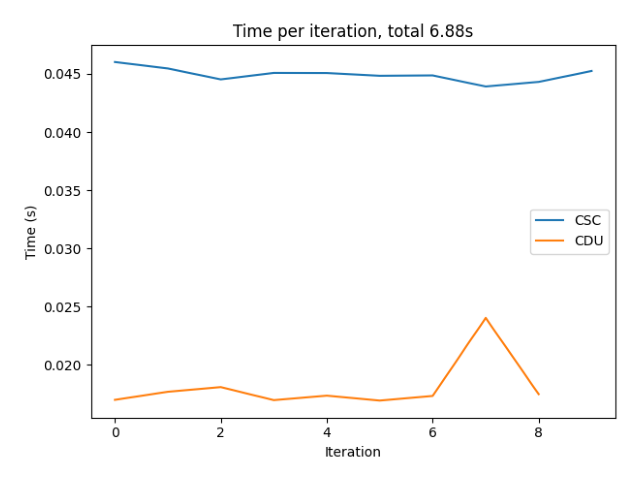

In [77]:
path = f"outputs/synth_experiments/experiment_{experiment}/single/interp_2_0/seed_{experiment+10}"
helper.show_plots(path)

In [78]:
# Run on multiple seeds
run(f"ssrun --multirun dataset=synth_dataset_exp{experiment} model=synth_model_exp{experiment} experiment={experiment} dataset.gen.seed=range(1,6) model.cdl.interpolate=0,10 output.verbose=0 output.plot=1")

[2024-01-09 19:53:08,809][HYDRA] Launching 10 jobs locally
[2024-01-09 19:53:08,809][HYDRA] 	#0 : dataset=synth_dataset_exp6 model=synth_model_exp6 experiment=6 dataset.gen.seed=1 model.cdl.interpolate=0 output.verbose=0 output.plot=1
extract waveforms shared_memory multi buffer: 100%|##########| 3/3 [00:00<?, ?it/s]
Setting 'return_scaled' to False
detect peaks using by_channel: 100%|##########| 3/3 [00:00<00:00, 1500.65it/s]
C:\Users\PolletStars\Documents\Git\tsproj\cdlgr\model\cdl.py:403: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sub_spike_sorting["diff"] = diffs_norm
C:\Users\PolletStars\Documents\Git\tsproj\cdlgr\model\cdl.py:403: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

In [79]:
helper.report_multi_run_results(experiment)

Averaged accuracy:
interpolation: 0
unit 0: 0.491 +/- 0.406
unit 1: 1.000 +/- 0.000
Overall: 0.746 +/- 0.384

interpolation: 10
unit 0: 0.917 +/- 0.105
unit 1: 1.000 +/- 0.000
Overall: 0.958 +/- 0.085


--------------------------
Averaged precision:
interpolation: 0
unit 0: 0.491 +/- 0.406
unit 1: 1.000 +/- 0.000
Overall: 0.746 +/- 0.384

interpolation: 10
unit 0: 0.930 +/- 0.085
unit 1: 1.000 +/- 0.000
Overall: 0.965 +/- 0.070


--------------------------
Averaged recall:
interpolation: 0
unit 0: 0.600 +/- 0.490
unit 1: 1.000 +/- 0.000
Overall: 0.800 +/- 0.400

interpolation: 10
unit 0: 0.980 +/- 0.040
unit 1: 1.000 +/- 0.000
Overall: 0.990 +/- 0.030


--------------------------
Averaged error and time offset by interpolation and unit:
interpolation: 0
unit 0:
	error: 0.245 +/- 0.055
	offset: 0.375 ms +/- 0.411 ms
unit 1:
	error: 0.189 +/- 0.044
	offset: -0.050 ms +/- 0.100 ms
Overall:
	error: 0.21692389922365343 +/- 0.05709726465600178
	offset: 0.1625  ms +/- 0.3667850187780302 ms

i

**Observations**: Greater background noise increases the number of false positives. It seems that the interpolated version is more resilient to noise than the original COMP, as the drop in accuracy is smaller for COMP-INTERP.

#### Experiment 7
The sampling frequency is decreased from $8kHz$ to $4kHz$.

In [39]:
experiment = 7

In [40]:
# Single run with interpolation
run(f"ssrun dataset=synth_dataset_exp{experiment} model=synth_model_exp{experiment} experiment={experiment}")


experiment: 7
output:
  verbose: 2
  plot: 2
  preprocess:
    plot_traces: false
    plot_waveforms: false
    plot_snrs: false
  fp_threshold_ms: 15
dataset:
  type: synth
  name: synthetic
  recording: synthetic
  uri: null
  first_unit_index: null
  none_unit: null
  tstart_s: null
  tstop_s: null
  duration_s: null
  tstart_test_s: null
  tstop_test_s: null
  channel: 0
  detect_threshold: 5
  preprocess: false
  preprocess_params:
    freq_min: null
    freq_max: null
  window:
    split: true
    window_size_s: 0.015
  sources:
    num: 2
    length_ms: 10.25
  gen:
    seed: 17
    noise: 0.1
    amps:
    - 1
    - 2
    numOfEvents: 10
    T: 3
  fs: 4000
model:
  dictionary:
    num_elements: 2
    element_length_ms: 10.25
    init_templates: real_noisy
    real_random_noise: 0.2
    real_offset_ms: 0.5
  cdl:
    num_iterations: 10
    interpolate: 10
    sparsity_tol: 1
    sparsity_tol_test: 25
    rel_amp_split_test: 0.6
    error_tol: 0.01
    interpolator_type: sinc
 

Initial dictionary:


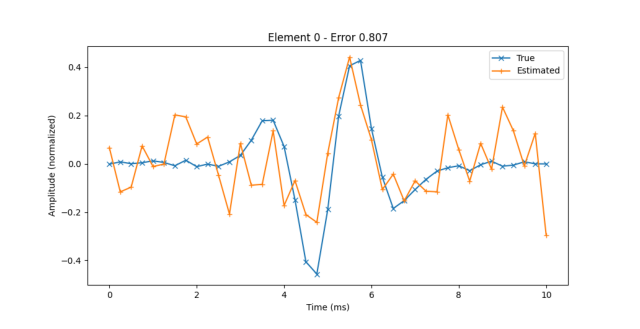

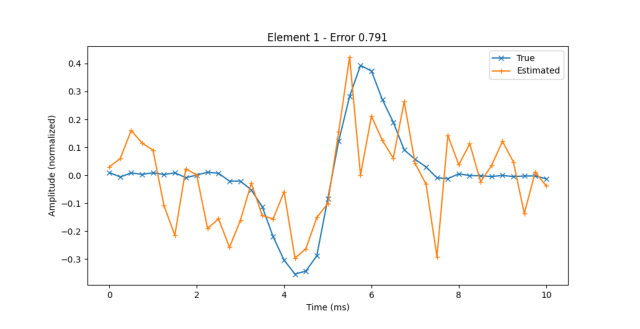

Final dictionary (shifted and interpolated truth):


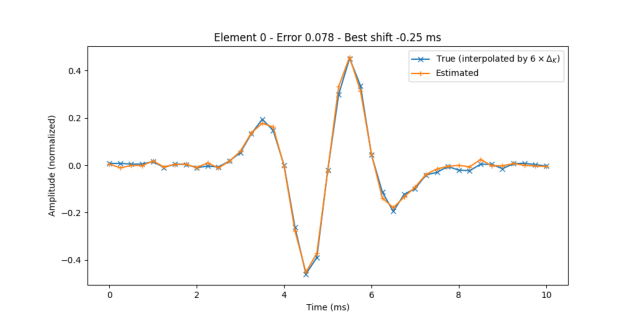

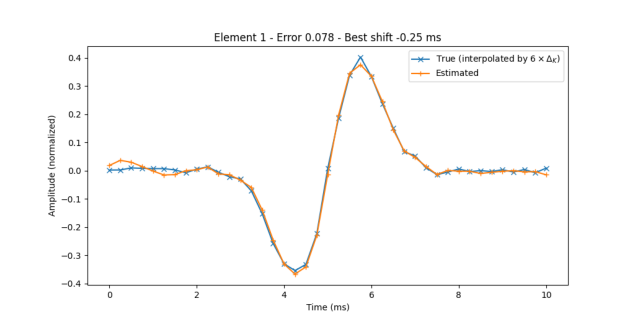

True positive on test set:


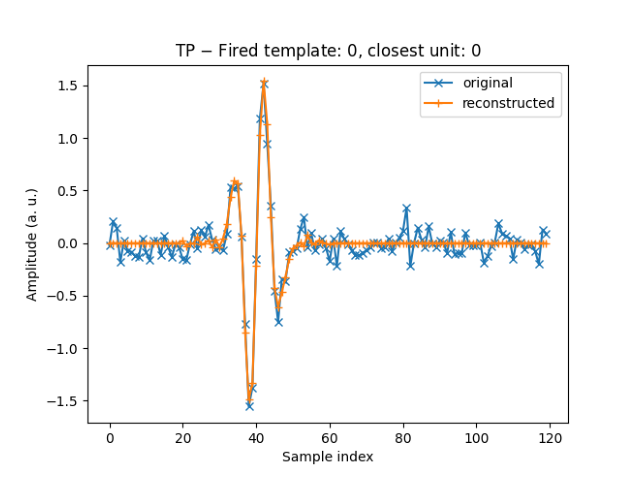

False positive on test set:


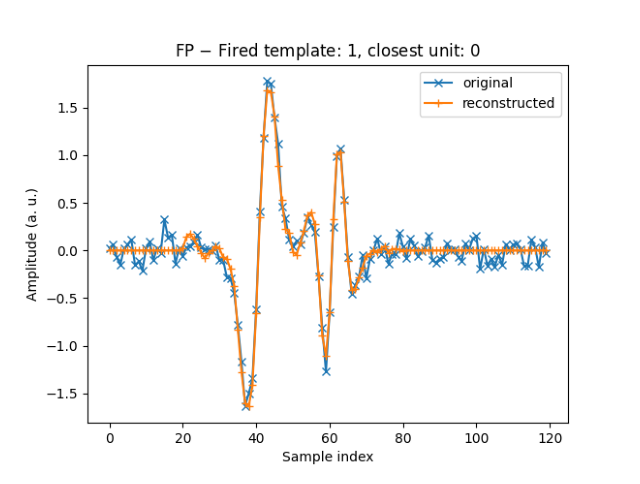

Confusion matrix test:


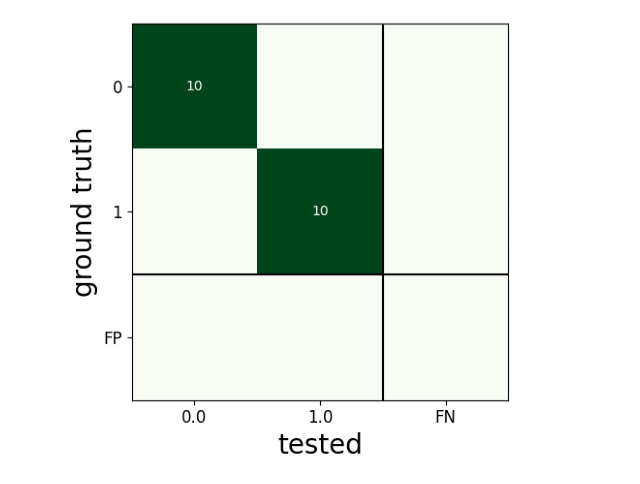

Time:


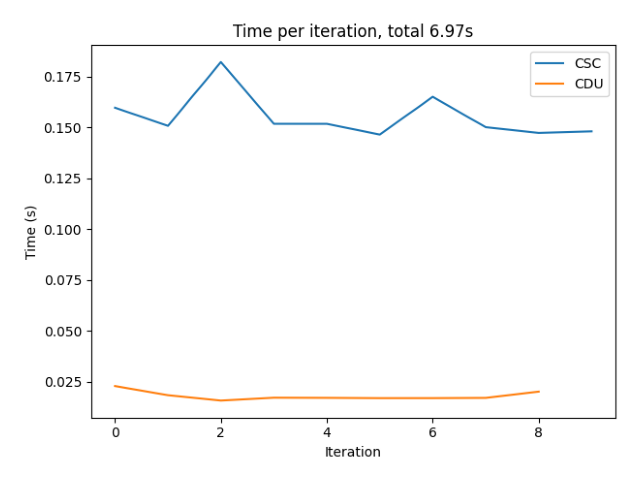

In [41]:
path = f"outputs/synth_experiments/experiment_{experiment}/single/interp_2_10/seed_{experiment+10}"
helper.show_plots(path)

In [42]:
# Single run without interpolation
run(f"ssrun dataset=synth_dataset_exp{experiment} model=synth_model_exp{experiment} experiment={experiment} model.cdl.interpolate=0")


experiment: 7
output:
  verbose: 2
  plot: 2
  preprocess:
    plot_traces: false
    plot_waveforms: false
    plot_snrs: false
  fp_threshold_ms: 15
dataset:
  type: synth
  name: synthetic
  recording: synthetic
  uri: null
  first_unit_index: null
  none_unit: null
  tstart_s: null
  tstop_s: null
  duration_s: null
  tstart_test_s: null
  tstop_test_s: null
  channel: 0
  detect_threshold: 5
  preprocess: false
  preprocess_params:
    freq_min: null
    freq_max: null
  window:
    split: true
    window_size_s: 0.015
  sources:
    num: 2
    length_ms: 10.25
  gen:
    seed: 17
    noise: 0.1
    amps:
    - 1
    - 2
    numOfEvents: 10
    T: 3
  fs: 4000
model:
  dictionary:
    num_elements: 2
    element_length_ms: 10.25
    init_templates: real_noisy
    real_random_noise: 0.2
    real_offset_ms: 0.5
  cdl:
    num_iterations: 10
    interpolate: 0
    sparsity_tol: 1
    sparsity_tol_test: 25
    rel_amp_split_test: 0.6
    error_tol: 0.01
    interpolator_type: sinc
  

Initial dictionary:


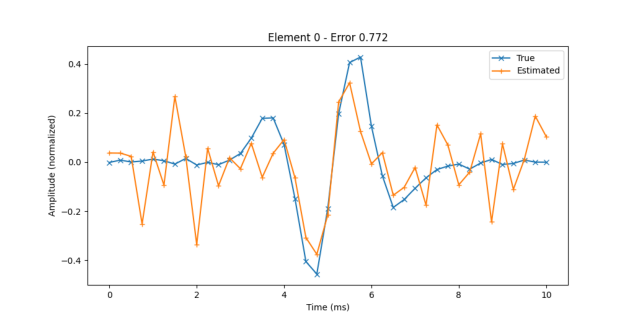

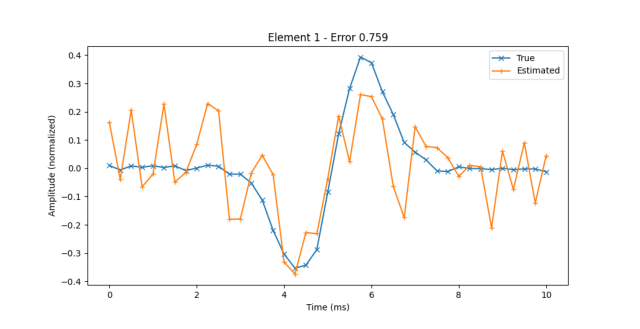

Final dictionary (shifted and interpolated truth):


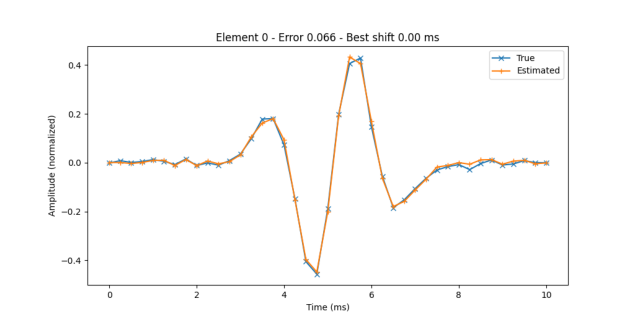

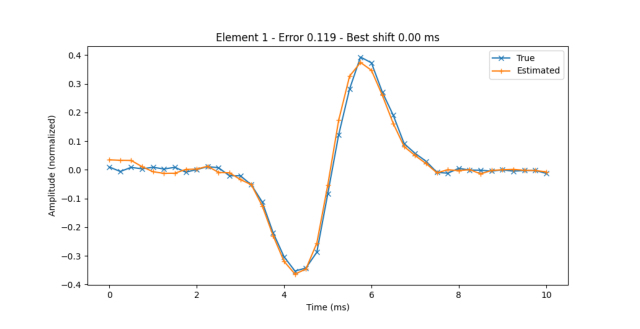

True positive on test set:


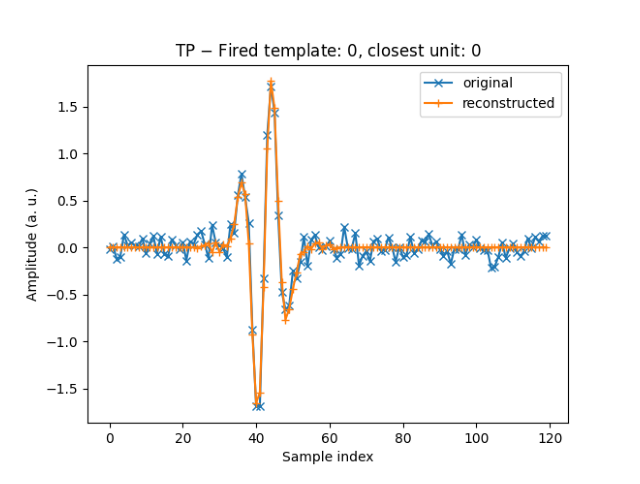

False positive on test set:


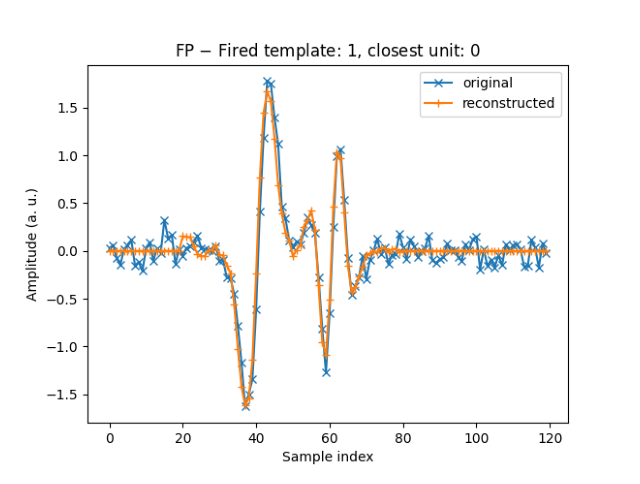

Confusion matrix test:


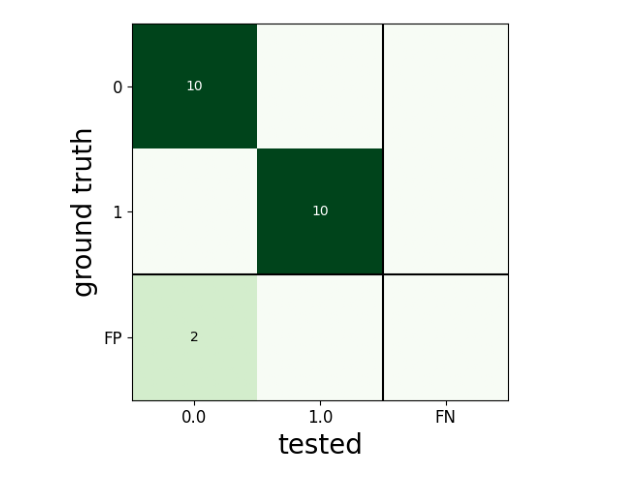

Time:


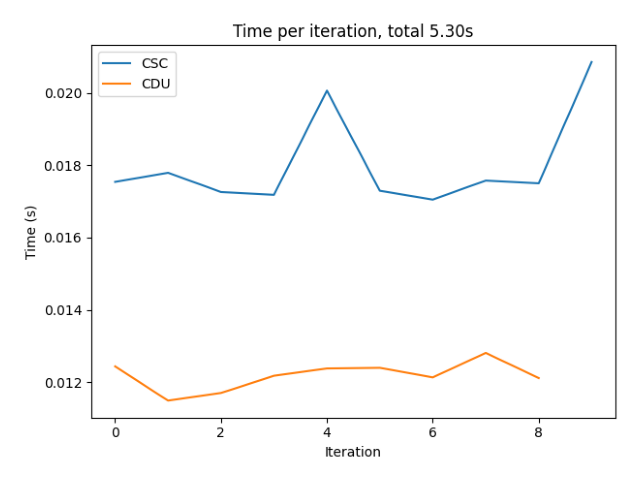

In [43]:
path = f"outputs/synth_experiments/experiment_{experiment}/single/interp_2_0/seed_{experiment+10}"
helper.show_plots(path)

In [44]:
# Run on multiple seeds
run(f"ssrun --multirun dataset=synth_dataset_exp{experiment} model=synth_model_exp{experiment} experiment={experiment} dataset.gen.seed=range(1,6) model.cdl.interpolate=0,10 output.verbose=0 output.plot=1")

[2024-01-09 21:16:53,597][HYDRA] Launching 10 jobs locally
[2024-01-09 21:16:53,597][HYDRA] 	#0 : dataset=synth_dataset_exp7 model=synth_model_exp7 experiment=7 dataset.gen.seed=1 model.cdl.interpolate=0 output.verbose=0 output.plot=1
extract waveforms shared_memory multi buffer: 100%|##########| 3/3 [00:00<?, ?it/s]
Setting 'return_scaled' to False
detect peaks using by_channel: 100%|##########| 3/3 [00:00<00:00, 1527.61it/s]
D:\Etudes\Ponts et chaussees\MVA\Cours\AST\tsproj\cdlgr\model\cdl.py:440: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sub_spike_sorting["diff"] = diffs_norm
D:\Etudes\Ponts et chaussees\MVA\Cours\AST\tsproj\cdlgr\model\cdl.py:440: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.


In [45]:
helper.report_multi_run_results(experiment)

Averaged accuracy:
interpolation: 0
unit 0: 0.810 +/- 0.063
unit 1: 1.000 +/- 0.000
Overall: 0.905 +/- 0.105

interpolation: 10
unit 0: 1.000 +/- 0.000
unit 1: 1.000 +/- 0.000
Overall: 1.000 +/- 0.000


--------------------------
Averaged precision:
interpolation: 0
unit 0: 0.830 +/- 0.096
unit 1: 1.000 +/- 0.000
Overall: 0.915 +/- 0.109

interpolation: 10
unit 0: 1.000 +/- 0.000
unit 1: 1.000 +/- 0.000
Overall: 1.000 +/- 0.000


--------------------------
Averaged recall:
interpolation: 0
unit 0: 0.980 +/- 0.040
unit 1: 1.000 +/- 0.000
Overall: 0.990 +/- 0.030

interpolation: 10
unit 0: 1.000 +/- 0.000
unit 1: 1.000 +/- 0.000
Overall: 1.000 +/- 0.000


--------------------------
Averaged error and time offset by interpolation and unit:
interpolation: 0
unit 0:
	error: 0.149 +/- 0.100
	offset: -0.050 ms +/- 0.100 ms
unit 1:
	error: 0.109 +/- 0.047
	offset: 0.100 ms +/- 0.122 ms
Overall:
	error: 0.12884907018271832 +/- 0.08057685489424318
	offset: 0.025  ms +/- 0.1346291201783626 ms

in

**Observations**: When the sampling frequency is decreased, the effect of the sampling becomes stronger. As a cosnequence, the gap between COMP and COMP-INTERP becomes noticeable: COMP-INTERP almost always get a perfect accuracy, contrary to COMP which gets false positives for unit 0. The reconstruction error is also much lower for COMP-INTERP.

#### Experiment 8
The cubic interpolator is used (default was sinc).

In [68]:
experiment = 8

In [69]:
# Single run with interpolation
run(f"ssrun dataset=synth_dataset_exp{experiment} model=synth_model_exp{experiment} experiment={experiment}")


experiment: 8
output:
  verbose: 2
  plot: 2
  preprocess:
    plot_traces: false
    plot_waveforms: false
    plot_snrs: false
  fp_threshold_ms: 15
dataset:
  type: synth
  name: synthetic
  recording: synthetic
  uri: null
  first_unit_index: null
  none_unit: null
  tstart_s: null
  tstop_s: null
  duration_s: null
  tstart_test_s: null
  tstop_test_s: null
  channel: 0
  detect_threshold: 5
  preprocess: false
  preprocess_params:
    freq_min: null
    freq_max: null
  window:
    split: true
    window_size_s: 0.015
  sources:
    num: 2
    length_ms: 10.125
  gen:
    seed: 18
    noise: 0.1
    amps:
    - 1
    - 2
    numOfEvents: 10
    T: 3
  fs: 8000
model:
  dictionary:
    num_elements: 2
    element_length_ms: 10.125
    init_templates: real_noisy
    real_random_noise: 0.2
    real_offset_ms: 0.5
  cdl:
    num_iterations: 10
    interpolate: 10
    sparsity_tol: 1
    sparsity_tol_test: 25
    rel_amp_split_test: 0.6
    error_tol: 0.01
    interpolator_type: cubi

Initial dictionary:


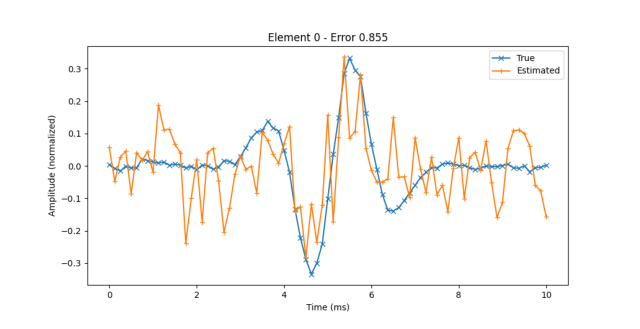

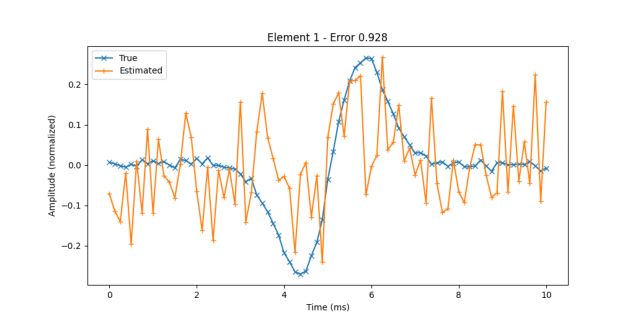

Final dictionary (shifted and interpolated truth):


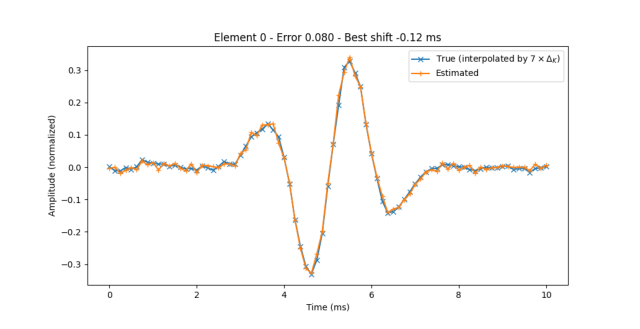

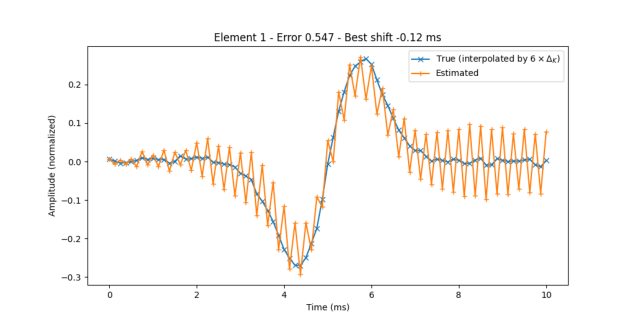

True positive on test set:


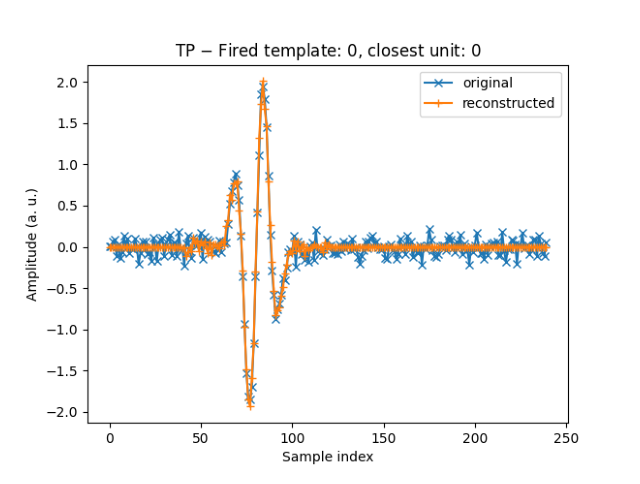

False positive on test set:
No false positive for test run.
Confusion matrix test:


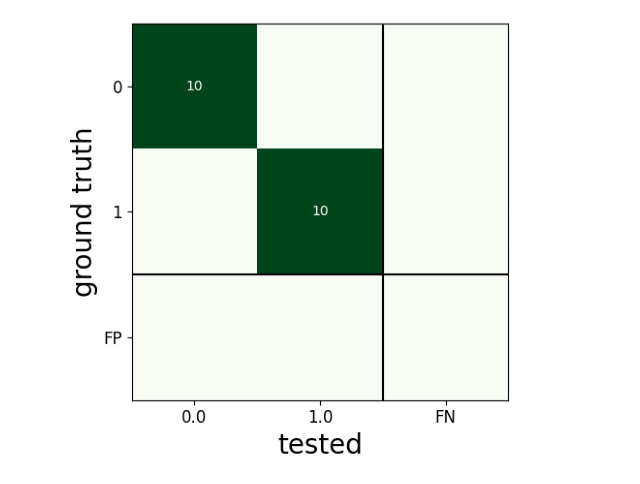

Time:


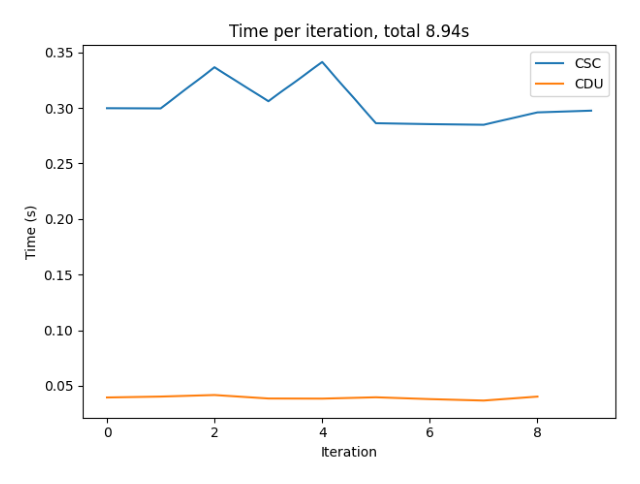

In [70]:
path = f"outputs/synth_experiments/experiment_{experiment}/single/interp_2_10/seed_{experiment+10}"
helper.show_plots(path)

In [71]:
# Single run without interpolation
run(f"ssrun dataset=synth_dataset_exp{experiment} model=synth_model_exp{experiment} experiment={experiment} model.cdl.interpolate=0")


experiment: 8
output:
  verbose: 2
  plot: 2
  preprocess:
    plot_traces: false
    plot_waveforms: false
    plot_snrs: false
  fp_threshold_ms: 15
dataset:
  type: synth
  name: synthetic
  recording: synthetic
  uri: null
  first_unit_index: null
  none_unit: null
  tstart_s: null
  tstop_s: null
  duration_s: null
  tstart_test_s: null
  tstop_test_s: null
  channel: 0
  detect_threshold: 5
  preprocess: false
  preprocess_params:
    freq_min: null
    freq_max: null
  window:
    split: true
    window_size_s: 0.015
  sources:
    num: 2
    length_ms: 10.125
  gen:
    seed: 18
    noise: 0.1
    amps:
    - 1
    - 2
    numOfEvents: 10
    T: 3
  fs: 8000
model:
  dictionary:
    num_elements: 2
    element_length_ms: 10.125
    init_templates: real_noisy
    real_random_noise: 0.2
    real_offset_ms: 0.5
  cdl:
    num_iterations: 10
    interpolate: 0
    sparsity_tol: 1
    sparsity_tol_test: 25
    rel_amp_split_test: 0.6
    error_tol: 0.01
    interpolator_type: cubic

Initial dictionary:


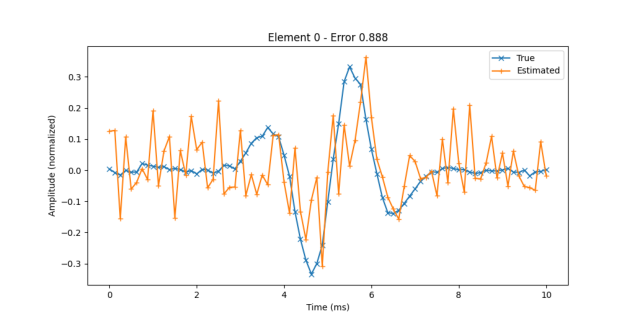

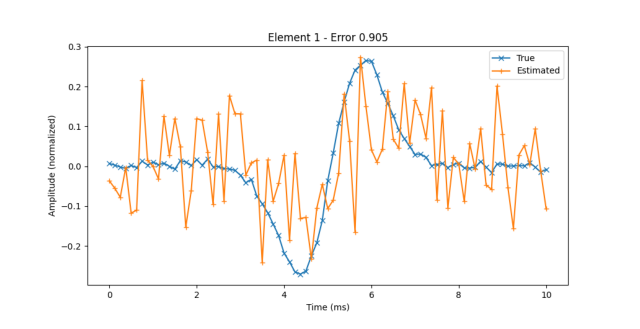

Final dictionary (shifted and interpolated truth):


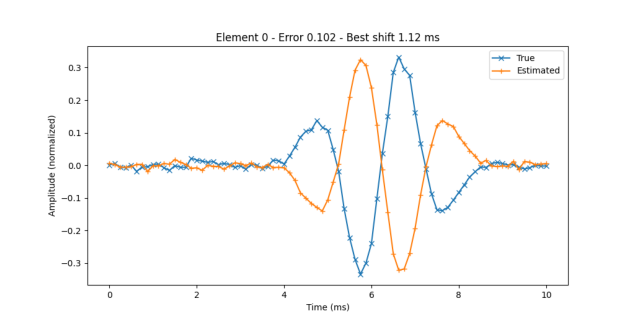

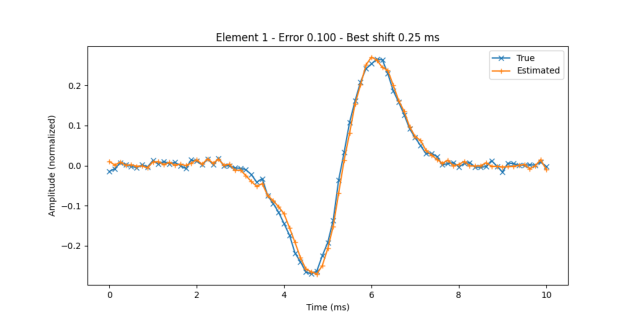

True positive on test set:


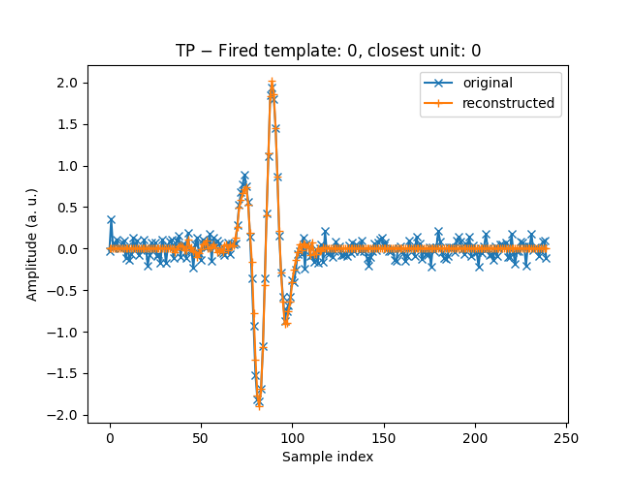

False positive on test set:
No false positive for test run.
Confusion matrix test:


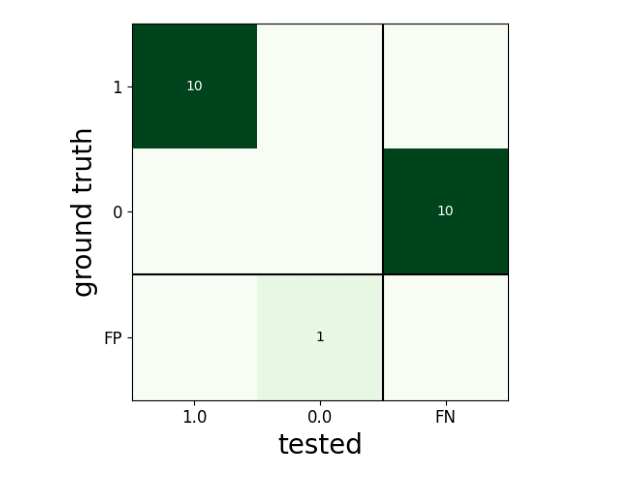

Time:


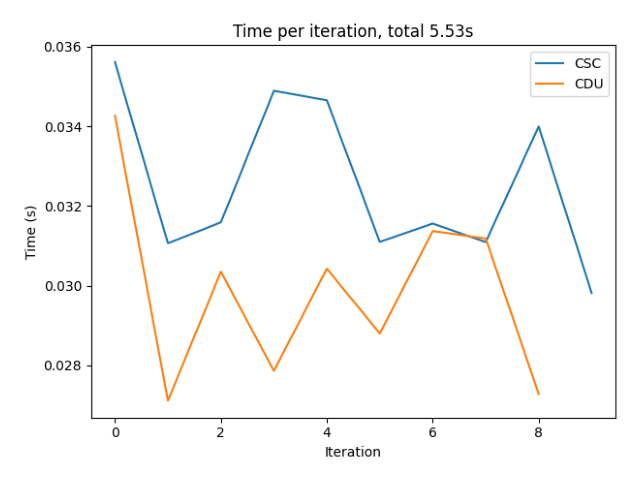

In [72]:
path = f"outputs/synth_experiments/experiment_{experiment}/single/interp_2_0/seed_{experiment+10}"
helper.show_plots(path)

In [73]:
# Run on multiple seeds
run(f"ssrun --multirun dataset=synth_dataset_exp{experiment} model=synth_model_exp{experiment} experiment={experiment} dataset.gen.seed=range(1,6) model.cdl.interpolate=0,10 output.verbose=0 output.plot=1")

[2024-01-09 21:22:09,344][HYDRA] Launching 10 jobs locally
[2024-01-09 21:22:09,344][HYDRA] 	#0 : dataset=synth_dataset_exp8 model=synth_model_exp8 experiment=8 dataset.gen.seed=1 model.cdl.interpolate=0 output.verbose=0 output.plot=1
extract waveforms shared_memory multi buffer: 100%|##########| 3/3 [00:00<?, ?it/s]
Setting 'return_scaled' to False
detect peaks using by_channel: 100%|##########| 3/3 [00:00<00:00, 3007.39it/s]
D:\Etudes\Ponts et chaussees\MVA\Cours\AST\tsproj\cdlgr\model\cdl.py:440: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sub_spike_sorting["diff"] = diffs_norm
D:\Etudes\Ponts et chaussees\MVA\Cours\AST\tsproj\cdlgr\model\cdl.py:440: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.


In [74]:
helper.report_multi_run_results(experiment)

Averaged accuracy:
interpolation: 0
unit 0: 0.800 +/- 0.400
unit 1: 1.000 +/- 0.000
Overall: 0.900 +/- 0.300

interpolation: 10
unit 0: 0.900 +/- 0.200
unit 1: 0.800 +/- 0.400
Overall: 0.850 +/- 0.320


--------------------------
Averaged precision:
interpolation: 0
unit 0: 0.800 +/- 0.400
unit 1: 1.000 +/- 0.000
Overall: 0.900 +/- 0.300

interpolation: 10
unit 0: 0.900 +/- 0.200
unit 1: 0.800 +/- 0.400
Overall: 0.850 +/- 0.320


--------------------------
Averaged recall:
interpolation: 0
unit 0: 0.800 +/- 0.400
unit 1: 1.000 +/- 0.000
Overall: 0.900 +/- 0.300

interpolation: 10
unit 0: 1.000 +/- 0.000
unit 1: 0.800 +/- 0.400
Overall: 0.900 +/- 0.300


--------------------------
Averaged error and time offset by interpolation and unit:
interpolation: 0
unit 0:
	error: 0.126 +/- 0.058
	offset: -0.250 ms +/- 0.506 ms
unit 1:
	error: 0.090 +/- 0.022
	offset: 0.075 ms +/- 0.150 ms
Overall:
	error: 0.10755817375147672 +/- 0.04766452288607954
	offset: -0.0875  ms +/- 0.4071624368725583 ms



**Observations**: Unlike the sinc interpolator, the cubic interpolator tends to produce fast oscillations that deteriorate the quality of the reconstructin of the units.

### Real dataset

Here we focus on the real dataset [paired_mea64_yger](https://spikeforest.flatironinstitute.org/studyresults/paired_mea64c) from *spikeforest*. We selected the channel 18 of the recording *20170622_patch2*, with an SNR of 25 dB. There is one groundtruth unit, but in the recording we have spikes from other neurons as well.

Preprocessing is really important to get good results with CDL. Therefore, we start with good settings, and we compare the COMP and COMP-INTERP performance, with a dictionary of two templates.

We use a threshold of 5 for peak detection, and we use 2 sources because we manually identified two main clusters, including the groundtruth unit. The code uses K-Means for clustering to initialize templates.

Then, we vary the number of templates in the dictionary, and we see if COMP-INTERP performance stands out with less optimized settings.

#### Experiment 1: comparing COMP vs COMP-INTERP with a dictionary of 2 templates 

This cell takes about 1 minute to execute.

In [75]:
run("ssrun dataset=real_dataset model=real_dataset_model ++model.cdl.interpolate=0")


experiment: sandbox
output:
  verbose: 2
  plot: 2
  preprocess:
    plot_traces: false
    plot_waveforms: false
    plot_snrs: false
  fp_threshold_ms: 15
dataset:
  type: spikeforest
  name: paired_mea64c
  recording: 20170622_patch2
  uri: sha1://1d343ed7e876ffd73bd8e0daf3b8a2c4265b783c?spikeforest-recordings.json
  tstart_s: 0
  tstop_s: 100
  first_unit_index: 1
  none_unit: 1
  tstart_test_s: 250
  tstop_test_s: 255
  channel: 18
  detect_threshold: 5
  preprocess: true
  preprocess_params:
    freq_min: 300
    freq_max: 6000
  window:
    split: true
    window_size_s: 0.0044
  gen:
    seed: null
model:
  dictionary:
    num_elements: 2
    element_length_ms: 2.15
    init_templates: cluster
  cdl:
    num_iterations: 20
    interpolate: 0
    sparsity_tol: 1
    sparsity_tol_test: 60
    rel_amp_split_test: 0.4
    error_tol: 0.01
    interpolator_type: sinc
    permute_templates: false

Working directory : d:\Etudes\Ponts et chaussees\MVA\Cours\AST\tsproj\outputs\spikefore

This cell can take up to 5 minutes to execute. It can be run from a terminal in the same directory as well, if you prefer, to get a display of the progress.

In [76]:
run("ssrun dataset=real_dataset model=real_dataset_model ++model.cdl.interpolate=10")


experiment: sandbox
output:
  verbose: 2
  plot: 2
  preprocess:
    plot_traces: false
    plot_waveforms: false
    plot_snrs: false
  fp_threshold_ms: 15
dataset:
  type: spikeforest
  name: paired_mea64c
  recording: 20170622_patch2
  uri: sha1://1d343ed7e876ffd73bd8e0daf3b8a2c4265b783c?spikeforest-recordings.json
  tstart_s: 0
  tstop_s: 100
  first_unit_index: 1
  none_unit: 1
  tstart_test_s: 250
  tstop_test_s: 255
  channel: 18
  detect_threshold: 5
  preprocess: true
  preprocess_params:
    freq_min: 300
    freq_max: 6000
  window:
    split: true
    window_size_s: 0.0044
  gen:
    seed: null
model:
  dictionary:
    num_elements: 2
    element_length_ms: 2.15
    init_templates: cluster
  cdl:
    num_iterations: 20
    interpolate: 10
    sparsity_tol: 1
    sparsity_tol_test: 60
    rel_amp_split_test: 0.4
    error_tol: 0.01
    interpolator_type: sinc
    permute_templates: false

Working directory : d:\Etudes\Ponts et chaussees\MVA\Cours\AST\tsproj\outputs\spikefor

In [77]:
helper.report_multi_run_results('sandbox', 2, [0, 10], [None], "spikeforest")

Averaged accuracy:
interpolation: 0
unit 0: 0.909 +/- 0.000
Overall: 0.909 +/- 0.000

interpolation: 10
unit 0: 0.909 +/- 0.000
Overall: 0.909 +/- 0.000


--------------------------
Averaged precision:
interpolation: 0
unit 0: 0.909 +/- 0.000
Overall: 0.909 +/- 0.000

interpolation: 10
unit 0: 0.909 +/- 0.000
Overall: 0.909 +/- 0.000


--------------------------
Averaged recall:
interpolation: 0
unit 0: 1.000 +/- 0.000
Overall: 1.000 +/- 0.000

interpolation: 10
unit 0: 1.000 +/- 0.000
Overall: 1.000 +/- 0.000


--------------------------
Averaged error and time offset by interpolation and unit:
interpolation: 0
unit 0:
	error: 0.014 +/- 0.000
	offset: 0.000 ms +/- 0.000 ms
Overall:
	error: 0.014079144335716066 +/- 0.0
	offset: 0.0  ms +/- 0.0 ms

interpolation: 10
unit 0:
	error: 0.019 +/- 0.000
	offset: 0.000 ms +/- 0.000 ms
Overall:
	error: 0.018854184674954578 +/- 0.0
	offset: 0.0  ms +/- 0.0 ms


--------------------------
Averaged runtime by interpolation:
interpolation: 0
	CSC m

Initial dictionary:


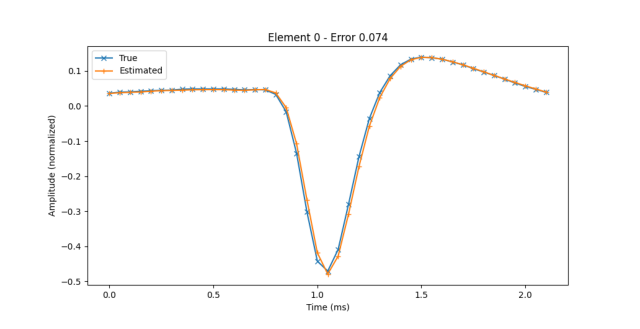

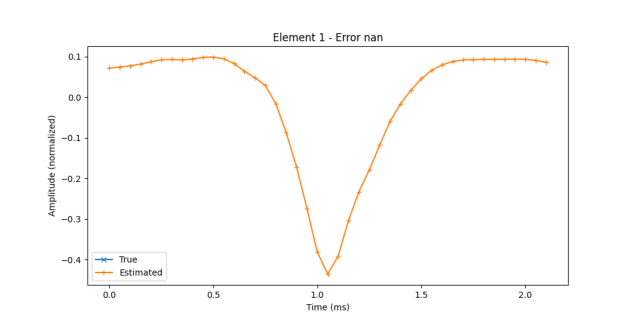

Final dictionary (shifted and interpolated truth):


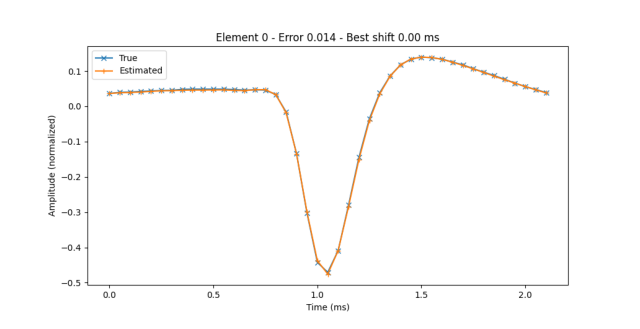

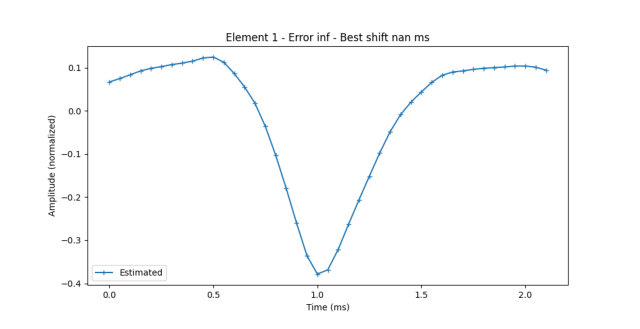

True positive on test set:


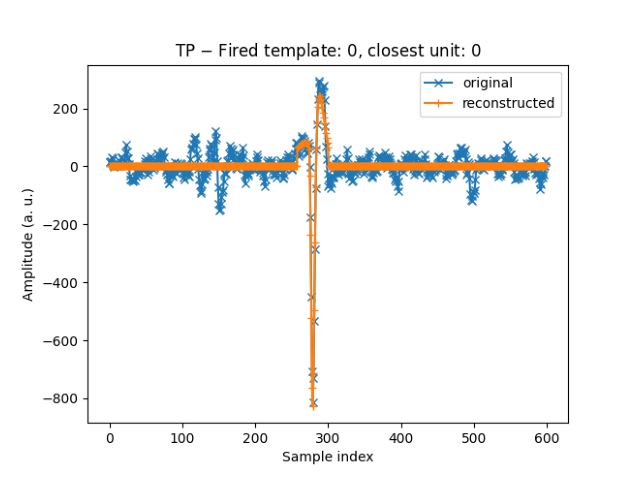

False positive on test set:


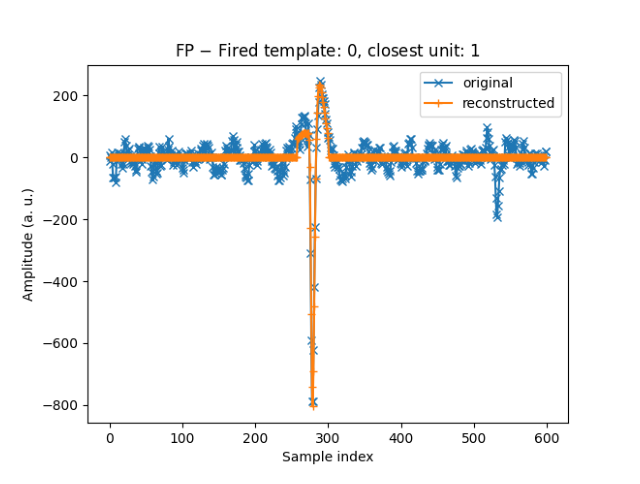

Confusion matrix train:


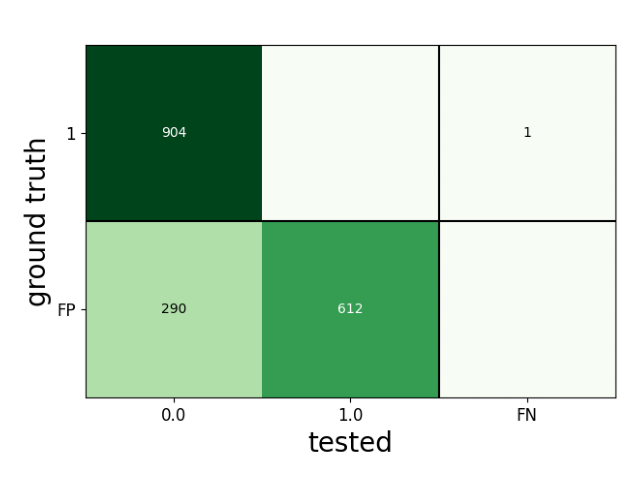

Confusion matrix test:


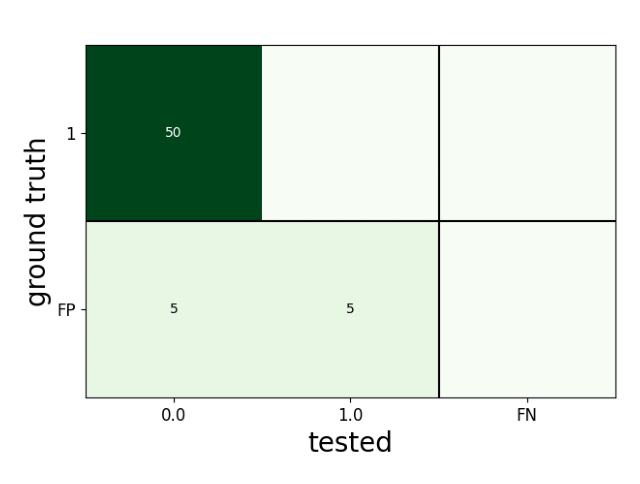

Time:


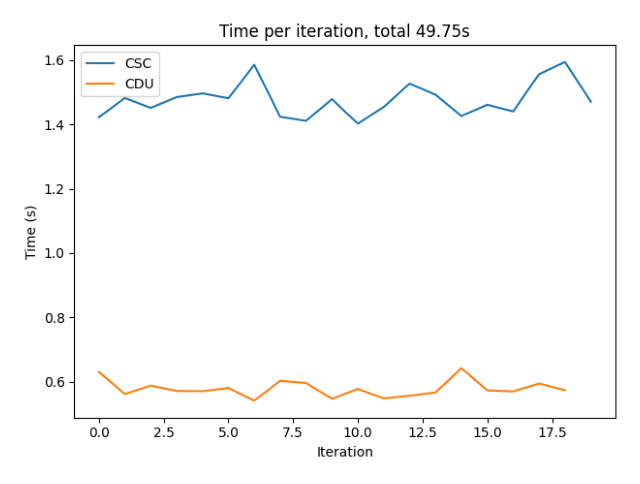

In [78]:
path = f"outputs/spikeforest_experiments/experiment_sandbox/single/interp_2_0/seed_None"
helper.show_plots(path, num_iterations=20, show_confusion_train=True)

Initial dictionary:


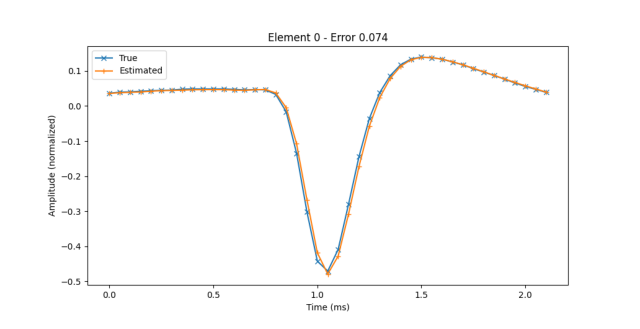

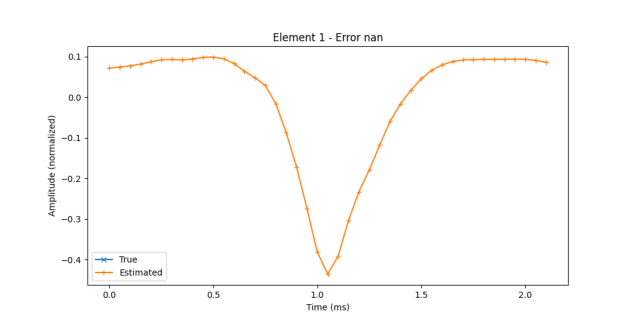

Final dictionary (shifted and interpolated truth):


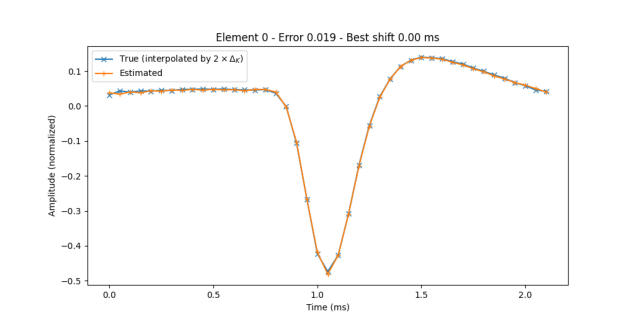

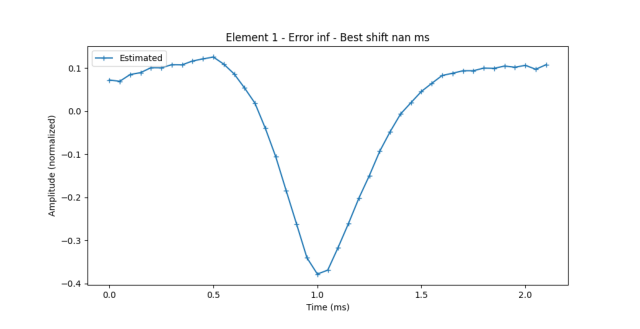

True positive on test set:


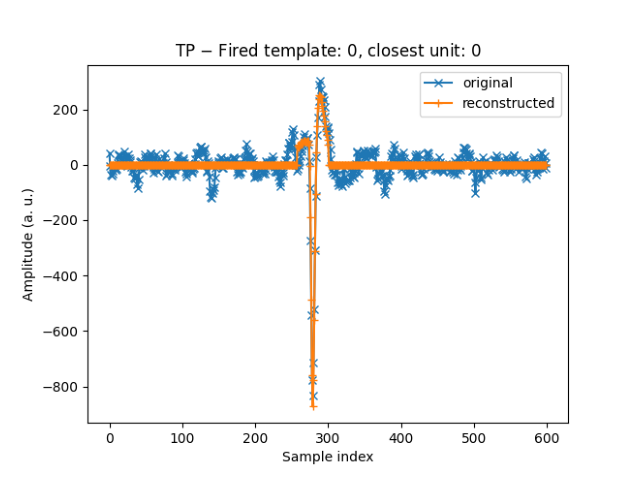

False positive on test set:


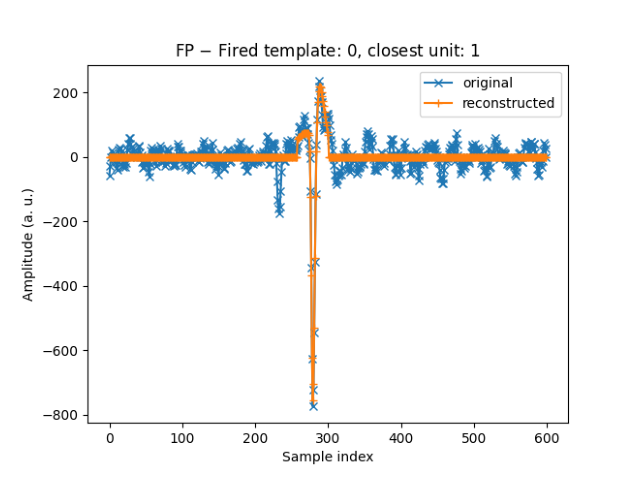

Confusion matrix train:


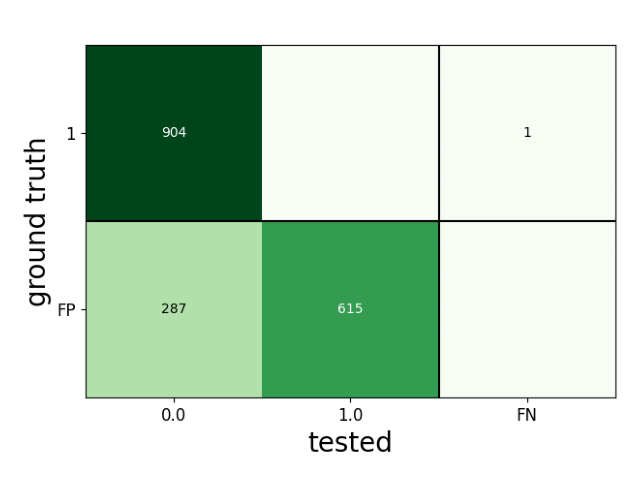

Confusion matrix test:


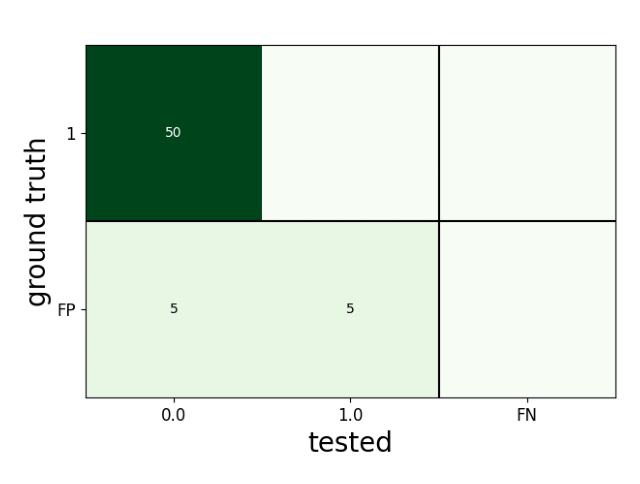

Time:


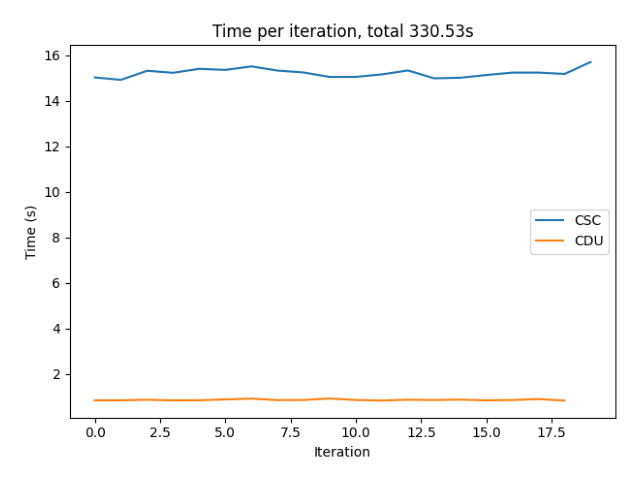

In [79]:
path = f"outputs/spikeforest_experiments/experiment_sandbox/single/interp_2_10/seed_None"
helper.show_plots(path, num_iterations=20, show_confusion_train=True)

**Observations**: COMP-INTERP and COMP have similar performance for spike sorting on this dataset.

#### Experiment 2: comparison with 3 sources

In this experiment, we check if, despite a bad clustering, COMP or COMP-INTERP can learn good units. 

In [80]:
run("ssrun dataset=real_dataset model=real_dataset_model ++model.cdl.interpolate=0 ++model.dictionary.num_elements=3")


experiment: sandbox
output:
  verbose: 2
  plot: 2
  preprocess:
    plot_traces: false
    plot_waveforms: false
    plot_snrs: false
  fp_threshold_ms: 15
dataset:
  type: spikeforest
  name: paired_mea64c
  recording: 20170622_patch2
  uri: sha1://1d343ed7e876ffd73bd8e0daf3b8a2c4265b783c?spikeforest-recordings.json
  tstart_s: 0
  tstop_s: 100
  first_unit_index: 1
  none_unit: 1
  tstart_test_s: 250
  tstop_test_s: 255
  channel: 18
  detect_threshold: 5
  preprocess: true
  preprocess_params:
    freq_min: 300
    freq_max: 6000
  window:
    split: true
    window_size_s: 0.0044
  gen:
    seed: null
model:
  dictionary:
    num_elements: 3
    element_length_ms: 2.15
    init_templates: cluster
  cdl:
    num_iterations: 20
    interpolate: 0
    sparsity_tol: 1
    sparsity_tol_test: 60
    rel_amp_split_test: 0.4
    error_tol: 0.01
    interpolator_type: sinc
    permute_templates: false

Working directory : d:\Etudes\Ponts et chaussees\MVA\Cours\AST\tsproj\outputs\spikefore

In [81]:
run("ssrun dataset=real_dataset model=real_dataset_model ++model.cdl.interpolate=10 ++model.dictionary.num_elements=3")


experiment: sandbox
output:
  verbose: 2
  plot: 2
  preprocess:
    plot_traces: false
    plot_waveforms: false
    plot_snrs: false
  fp_threshold_ms: 15
dataset:
  type: spikeforest
  name: paired_mea64c
  recording: 20170622_patch2
  uri: sha1://1d343ed7e876ffd73bd8e0daf3b8a2c4265b783c?spikeforest-recordings.json
  tstart_s: 0
  tstop_s: 100
  first_unit_index: 1
  none_unit: 1
  tstart_test_s: 250
  tstop_test_s: 255
  channel: 18
  detect_threshold: 5
  preprocess: true
  preprocess_params:
    freq_min: 300
    freq_max: 6000
  window:
    split: true
    window_size_s: 0.0044
  gen:
    seed: null
model:
  dictionary:
    num_elements: 3
    element_length_ms: 2.15
    init_templates: cluster
  cdl:
    num_iterations: 20
    interpolate: 10
    sparsity_tol: 1
    sparsity_tol_test: 60
    rel_amp_split_test: 0.4
    error_tol: 0.01
    interpolator_type: sinc
    permute_templates: false

Working directory : d:\Etudes\Ponts et chaussees\MVA\Cours\AST\tsproj\outputs\spikefor

In [82]:
helper.report_multi_run_results('sandbox', 3, [0, 10], [None], "spikeforest")

Averaged accuracy:
interpolation: 0
unit 0: 0.500 +/- 0.000
Overall: 0.500 +/- 0.000

interpolation: 10
unit 0: 0.000 +/- 0.000
Overall: 0.000 +/- 0.000


--------------------------
Averaged precision:
interpolation: 0
unit 0: 0.871 +/- 0.000
Overall: 0.871 +/- 0.000

interpolation: 10
unit 0: 0.000 +/- 0.000
Overall: 0.000 +/- 0.000


--------------------------
Averaged recall:
interpolation: 0
unit 0: 0.540 +/- 0.000
Overall: 0.540 +/- 0.000

interpolation: 10
unit 0: 0.000 +/- 0.000
Overall: 0.000 +/- 0.000


--------------------------
Averaged error and time offset by interpolation and unit:
interpolation: 0
unit 0:
	error: 0.021 +/- 0.000
	offset: 0.000 ms +/- 0.000 ms
Overall:
	error: 0.020990929308050632 +/- 0.0
	offset: 0.0  ms +/- 0.0 ms

interpolation: 10
unit 0:
	error: 0.058 +/- 0.000
	offset: 0.000 ms +/- 0.000 ms
Overall:
	error: 0.057919354100416175 +/- 0.0
	offset: 0.0  ms +/- 0.0 ms


--------------------------
Averaged runtime by interpolation:
interpolation: 0
	CSC m

Initial dictionary:


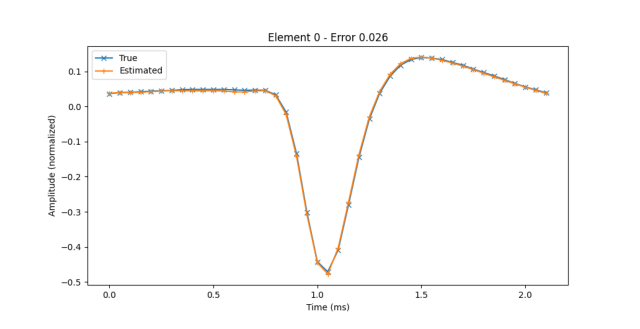

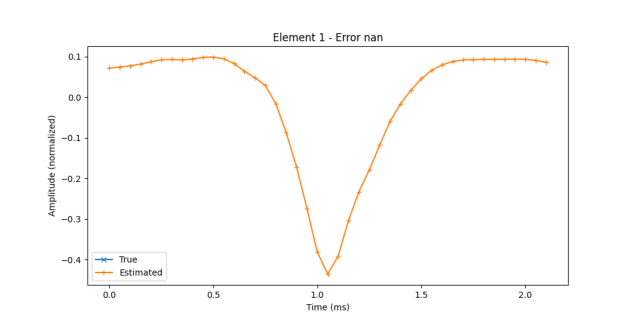

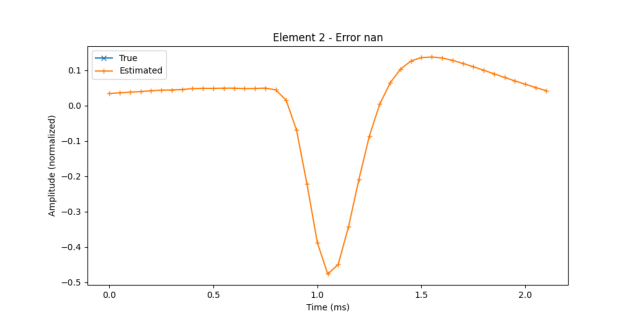

Final dictionary (shifted and interpolated truth):


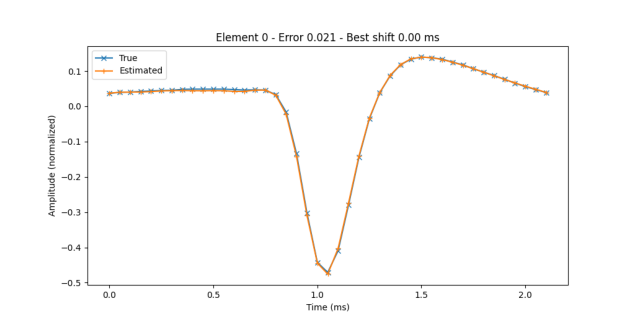

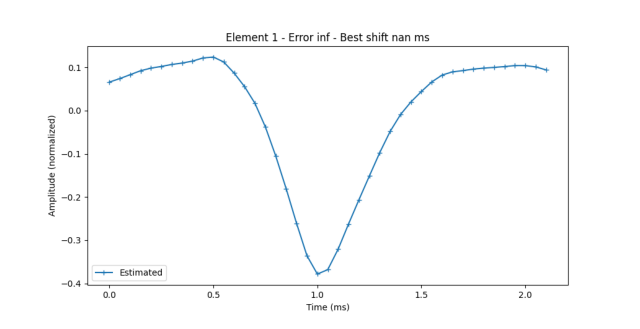

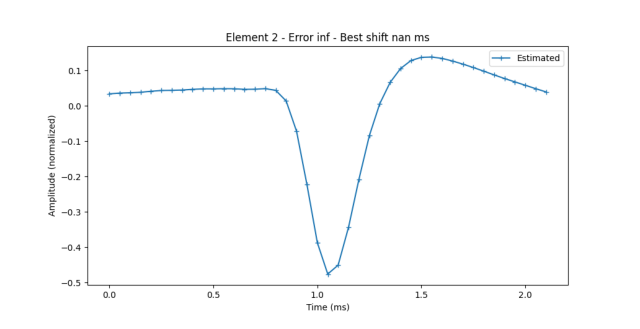

True positive on test set:


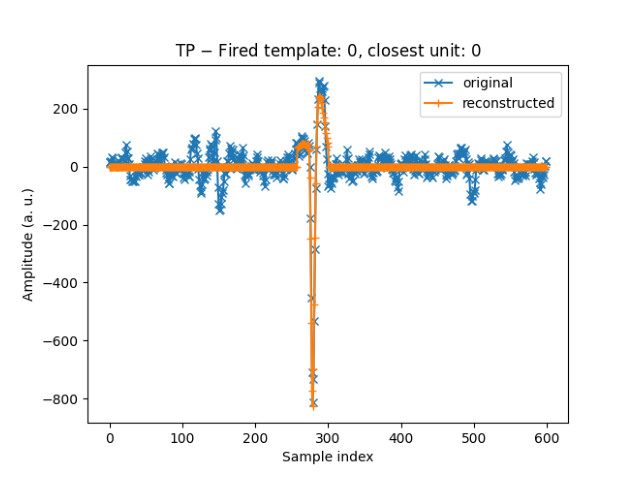

False positive on test set:


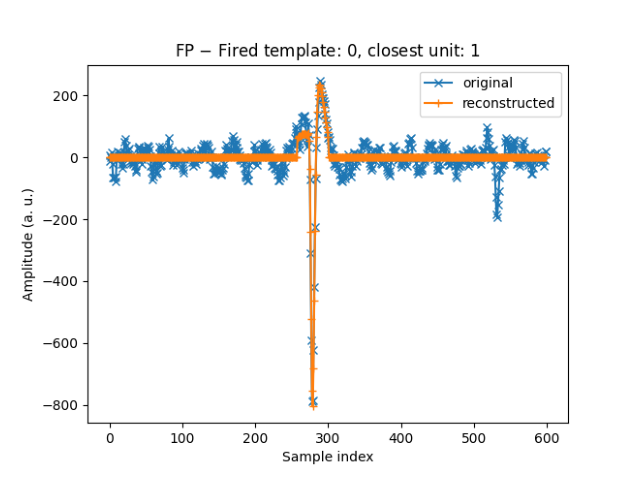

Confusion matrix train:


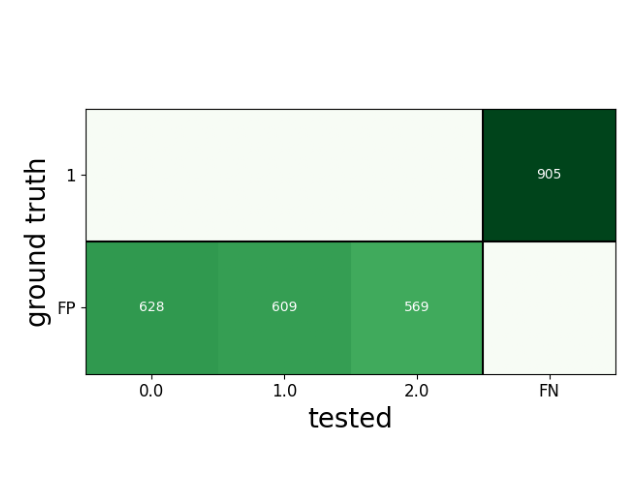

Confusion matrix test:


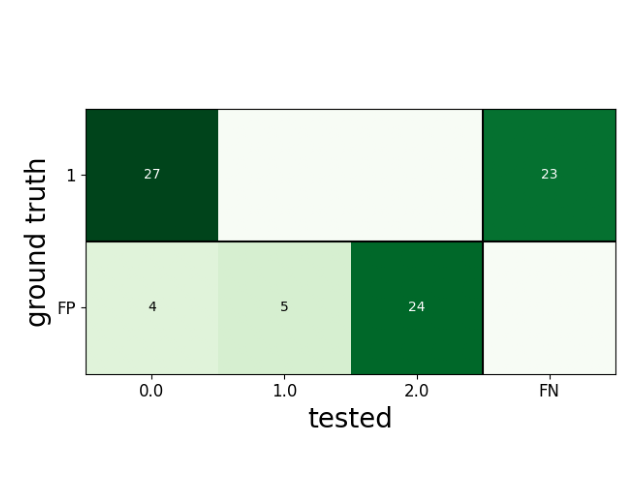

Time:


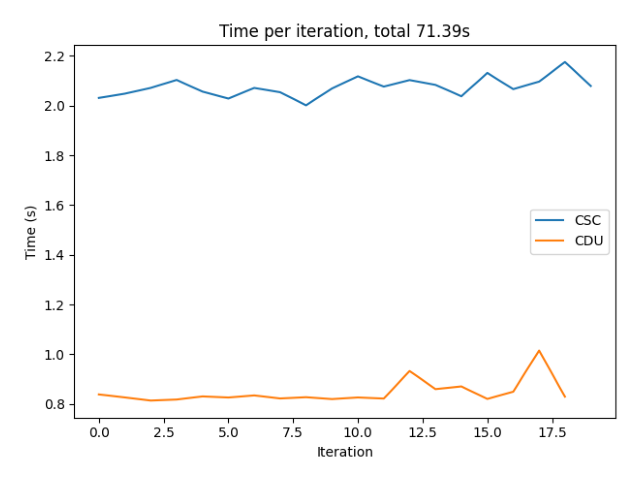

In [83]:
path = f"outputs/spikeforest_experiments/experiment_sandbox/single/interp_3_0/seed_None"
helper.show_plots(path, num_elements=3, num_iterations=20, show_confusion_train=True)

Initial dictionary:


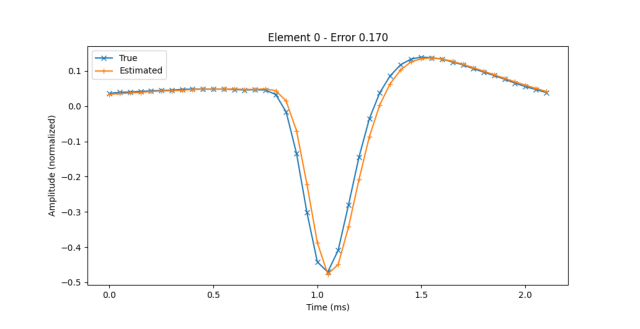

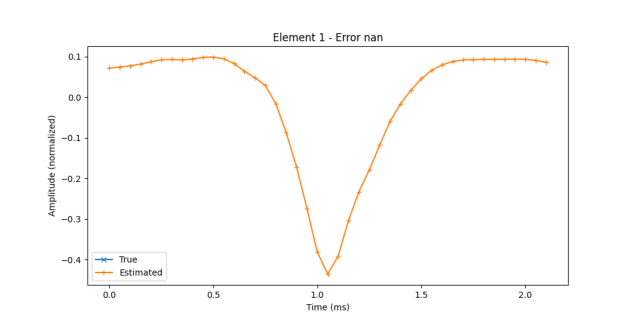

Final dictionary (shifted and interpolated truth):


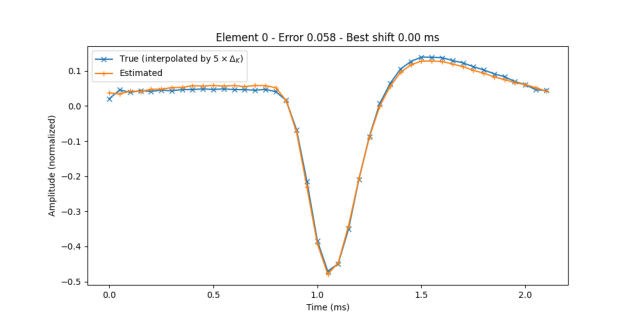

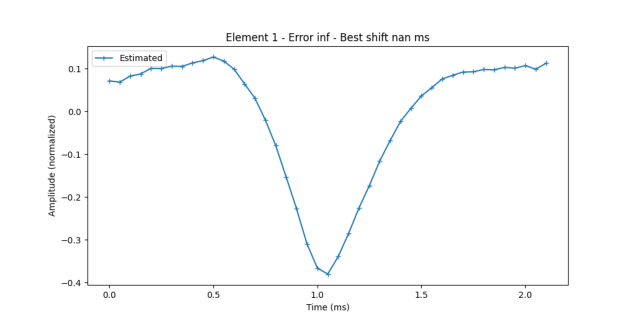

True positive on test set:


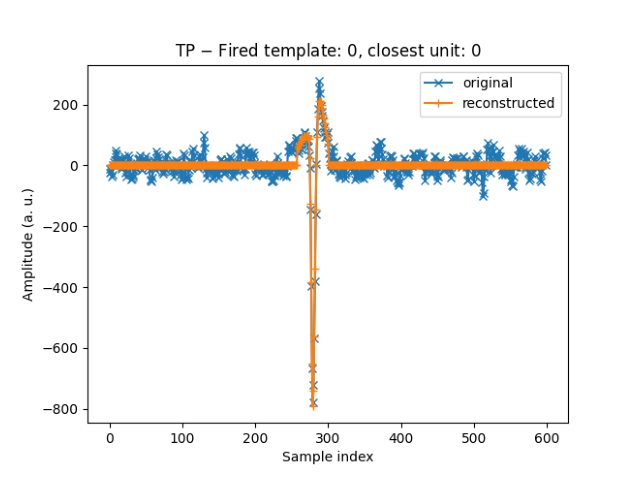

False positive on test set:


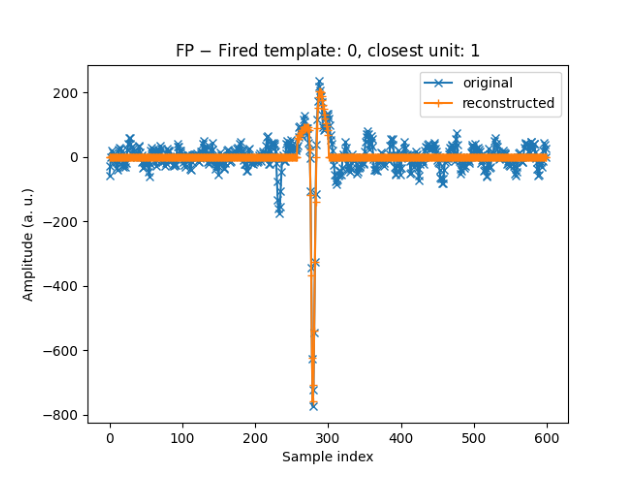

Confusion matrix train:


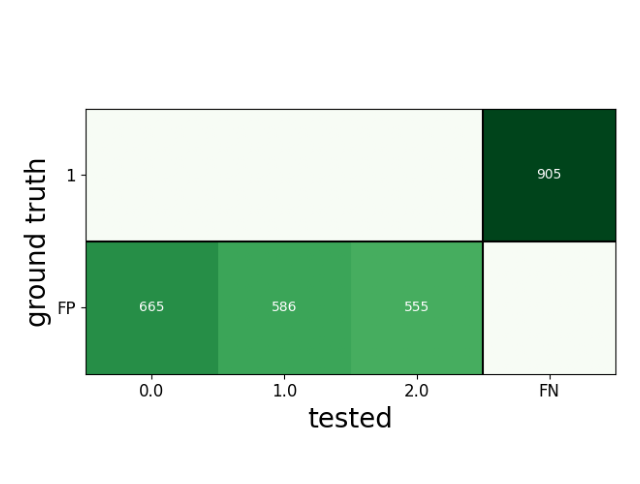

Confusion matrix test:


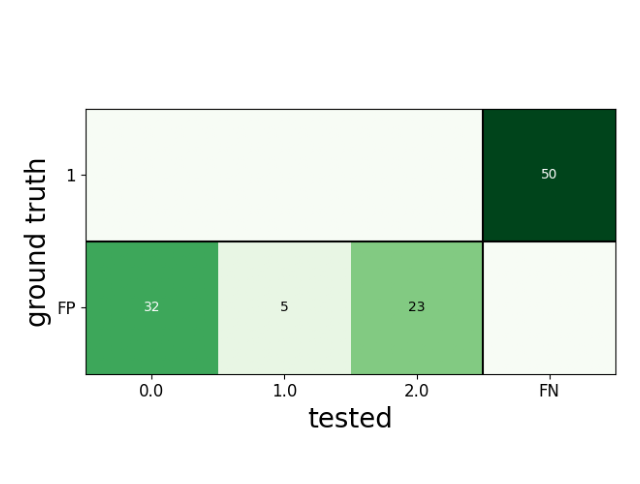

Time:


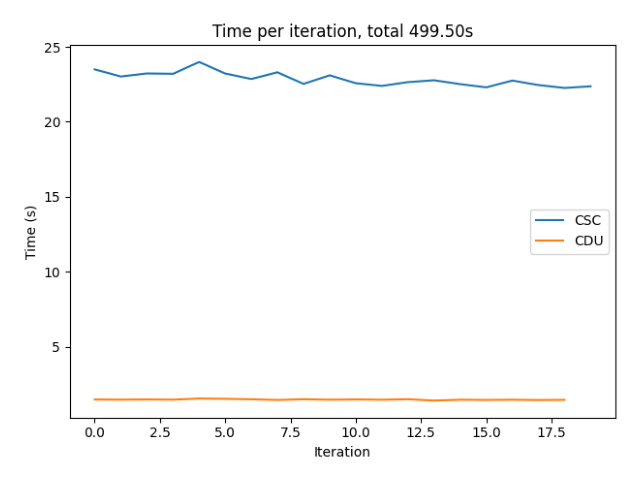

In [84]:
path = f"outputs/spikeforest_experiments/experiment_sandbox/single/interp_3_10/seed_None"
helper.show_plots(path, show_confusion_train=True)

**Observations**: Both algorithms perform badly, with COMP-INTERP being even worth. In any case, a postprocessing which merges units would be necessary.

#### Experiment 3: comparison with 1 source

As we expect, we will get many false positives.

In [85]:
!ssrun dataset=real_dataset model=real_dataset_model ++model.cdl.interpolate=0 ++model.dictionary.num_elements=1


experiment: sandbox
output:
  verbose: 2
  plot: 2
  preprocess:
    plot_traces: false
    plot_waveforms: false
    plot_snrs: false
  fp_threshold_ms: 15
dataset:
  type: spikeforest
  name: paired_mea64c
  recording: 20170622_patch2
  uri: sha1://1d343ed7e876ffd73bd8e0daf3b8a2c4265b783c?spikeforest-recordings.json
  tstart_s: 0
  tstop_s: 100
  first_unit_index: 1
  none_unit: 1
  tstart_test_s: 250
  tstop_test_s: 255
  channel: 18
  detect_threshold: 5
  preprocess: true
  preprocess_params:
    freq_min: 300
    freq_max: 6000
  window:
    split: true
    window_size_s: 0.0044
  gen:
    seed: null
model:
  dictionary:
    num_elements: 1
    element_length_ms: 2.15
    init_templates: cluster
  cdl:
    num_iterations: 20
    interpolate: 0
    sparsity_tol: 1
    sparsity_tol_test: 60
    rel_amp_split_test: 0.4
    error_tol: 0.01
    interpolator_type: sinc
    permute_templates: false

Working directory : d:\Etudes\Ponts et chaussees\MVA\Cours\AST\tsproj\outputs\spikefore


extract waveforms shared_memory multi buffer: 100%|##########| 100/100 [00:00<00:00, 117.53it/s]

extract waveforms shared_memory multi buffer: 100%|##########| 100/100 [00:05<00:00, 18.63it/s]

detect peaks using by_channel: 100%|##########| 100/100 [00:06<00:00, 14.89it/s]

0it [00:00, ?it/s]
51it [00:00, 508.55it/s]
110it [00:00, 551.80it/s]
169it [00:00, 568.68it/s]
228it [00:00, 574.56it/s]
287it [00:00, 579.15it/s]
345it [00:00, 449.59it/s]
405it [00:00, 486.38it/s]
466it [00:00, 517.13it/s]
526it [00:00, 539.38it/s]
585it [00:01, 552.22it/s]
644it [00:01, 561.46it/s]
704it [00:01, 571.63it/s]
763it [00:01, 576.59it/s]
822it [00:01, 580.52it/s]
882it [00:01, 586.29it/s]
942it [00:01, 587.53it/s]
1002it [00:01, 590.45it/s]
1062it [00:01, 593.26it/s]
1122it [00:02, 590.83it/s]
1182it [00:02, 583.16it/s]
1241it [00:02, 580.87it/s]
1300it [00:02, 581.53it/s]
1360it [00:02, 584.92it/s]
1419it [00:02, 586.34it/s]
1479it [00:02, 586.03it/s]
1538it [00:02, 582.82it/s]
1598it [00:02, 582

In [86]:
run("ssrun dataset=real_dataset model=real_dataset_model ++model.cdl.interpolate=0 ++model.dictionary.num_elements=1")


experiment: sandbox
output:
  verbose: 2
  plot: 2
  preprocess:
    plot_traces: false
    plot_waveforms: false
    plot_snrs: false
  fp_threshold_ms: 15
dataset:
  type: spikeforest
  name: paired_mea64c
  recording: 20170622_patch2
  uri: sha1://1d343ed7e876ffd73bd8e0daf3b8a2c4265b783c?spikeforest-recordings.json
  tstart_s: 0
  tstop_s: 100
  first_unit_index: 1
  none_unit: 1
  tstart_test_s: 250
  tstop_test_s: 255
  channel: 18
  detect_threshold: 5
  preprocess: true
  preprocess_params:
    freq_min: 300
    freq_max: 6000
  window:
    split: true
    window_size_s: 0.0044
  gen:
    seed: null
model:
  dictionary:
    num_elements: 1
    element_length_ms: 2.15
    init_templates: cluster
  cdl:
    num_iterations: 20
    interpolate: 0
    sparsity_tol: 1
    sparsity_tol_test: 60
    rel_amp_split_test: 0.4
    error_tol: 0.01
    interpolator_type: sinc
    permute_templates: false

Working directory : d:\Etudes\Ponts et chaussees\MVA\Cours\AST\tsproj\outputs\spikefore

In [87]:
run("ssrun dataset=real_dataset model=real_dataset_model ++model.cdl.interpolate=10 ++model.dictionary.num_elements=1")


experiment: sandbox
output:
  verbose: 2
  plot: 2
  preprocess:
    plot_traces: false
    plot_waveforms: false
    plot_snrs: false
  fp_threshold_ms: 15
dataset:
  type: spikeforest
  name: paired_mea64c
  recording: 20170622_patch2
  uri: sha1://1d343ed7e876ffd73bd8e0daf3b8a2c4265b783c?spikeforest-recordings.json
  tstart_s: 0
  tstop_s: 100
  first_unit_index: 1
  none_unit: 1
  tstart_test_s: 250
  tstop_test_s: 255
  channel: 18
  detect_threshold: 5
  preprocess: true
  preprocess_params:
    freq_min: 300
    freq_max: 6000
  window:
    split: true
    window_size_s: 0.0044
  gen:
    seed: null
model:
  dictionary:
    num_elements: 1
    element_length_ms: 2.15
    init_templates: cluster
  cdl:
    num_iterations: 20
    interpolate: 10
    sparsity_tol: 1
    sparsity_tol_test: 60
    rel_amp_split_test: 0.4
    error_tol: 0.01
    interpolator_type: sinc
    permute_templates: false

Working directory : d:\Etudes\Ponts et chaussees\MVA\Cours\AST\tsproj\outputs\spikefor

In [88]:
helper.report_multi_run_results('sandbox', 1, [0, 10], [None], "spikeforest")

Averaged accuracy:
interpolation: 0
unit 0: 0.909 +/- 0.000
Overall: 0.909 +/- 0.000

interpolation: 10
unit 0: 0.909 +/- 0.000
Overall: 0.909 +/- 0.000


--------------------------
Averaged precision:
interpolation: 0
unit 0: 0.909 +/- 0.000
Overall: 0.909 +/- 0.000

interpolation: 10
unit 0: 0.909 +/- 0.000
Overall: 0.909 +/- 0.000


--------------------------
Averaged recall:
interpolation: 0
unit 0: 1.000 +/- 0.000
Overall: 1.000 +/- 0.000

interpolation: 10
unit 0: 1.000 +/- 0.000
Overall: 1.000 +/- 0.000


--------------------------
Averaged error and time offset by interpolation and unit:
interpolation: 0
unit 0:
	error: 0.039 +/- 0.000
	offset: 0.000 ms +/- 0.000 ms
Overall:
	error: 0.0386792215178177 +/- 0.0
	offset: 0.0  ms +/- 0.0 ms

interpolation: 10
unit 0:
	error: 0.031 +/- 0.000
	offset: 0.000 ms +/- 0.000 ms
Overall:
	error: 0.03135915656968784 +/- 0.0
	offset: 0.0  ms +/- 0.0 ms


--------------------------
Averaged runtime by interpolation:
interpolation: 0
	CSC mean

Initial dictionary:


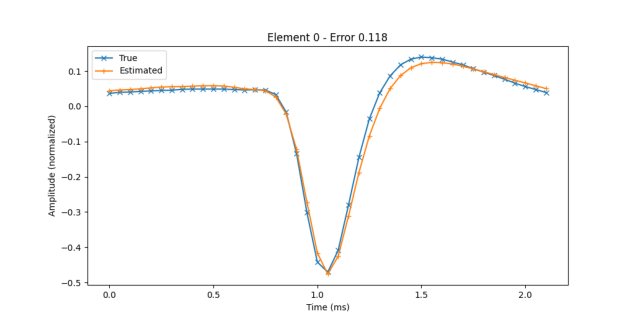

Final dictionary (shifted and interpolated truth):


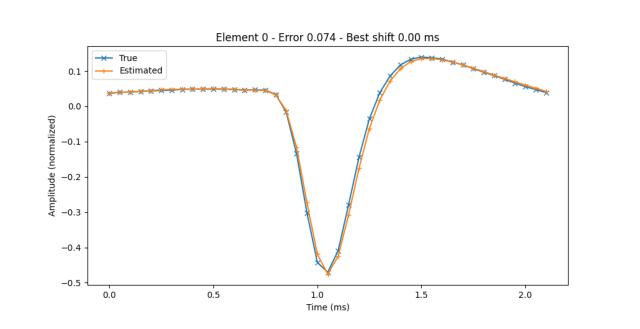

True positive on test set:


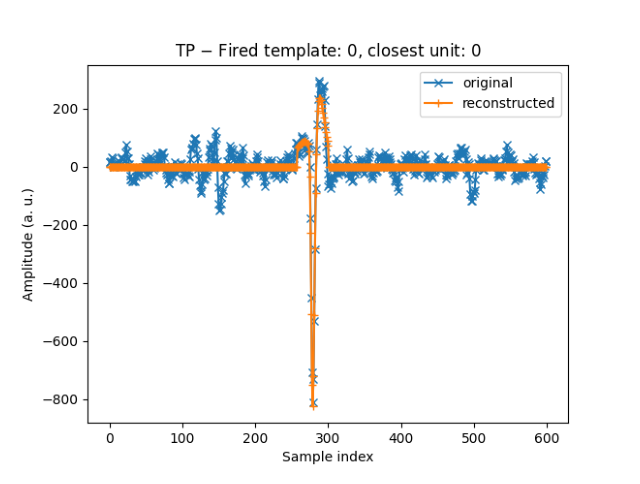

False positive on test set:


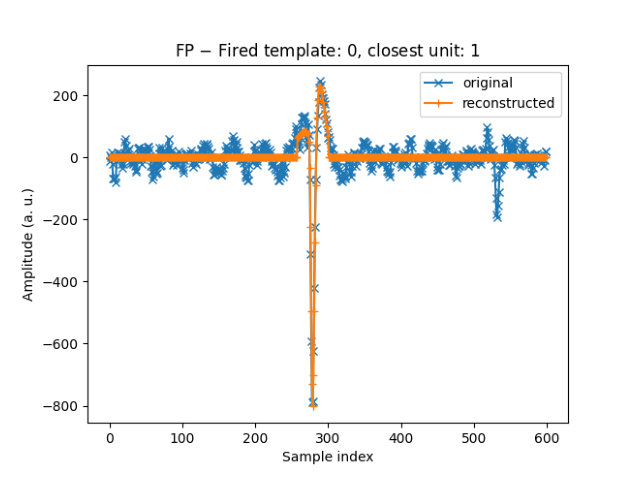

Confusion matrix train:


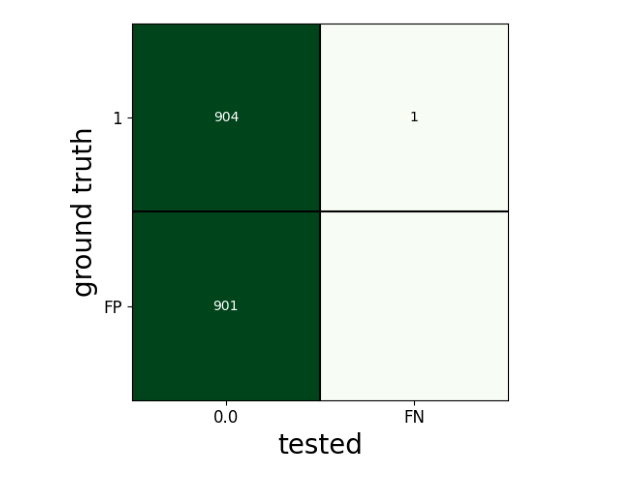

Confusion matrix test:


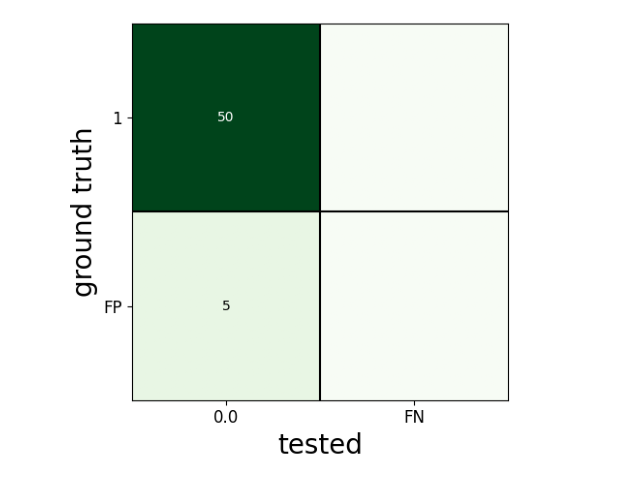

Time:


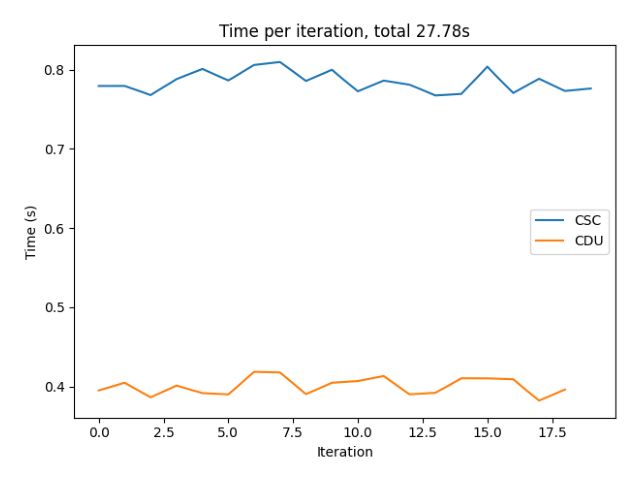

In [89]:
path = f"outputs/spikeforest_experiments/experiment_sandbox/single/interp_1_0/seed_None"
helper.show_plots(path, num_elements=1, show_confusion_train=True)

Initial dictionary:


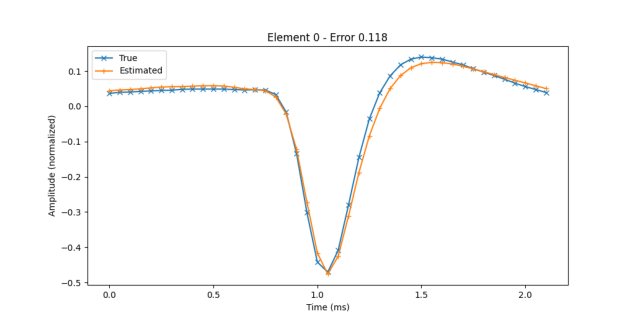

Final dictionary (shifted and interpolated truth):


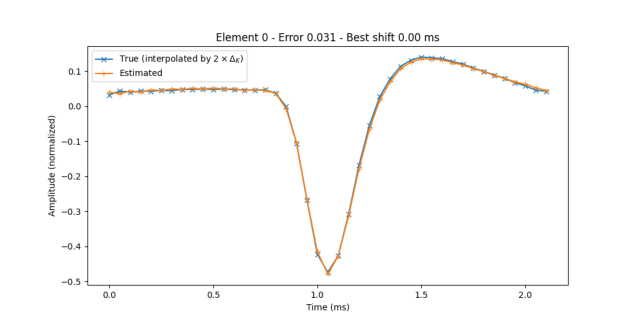

True positive on test set:


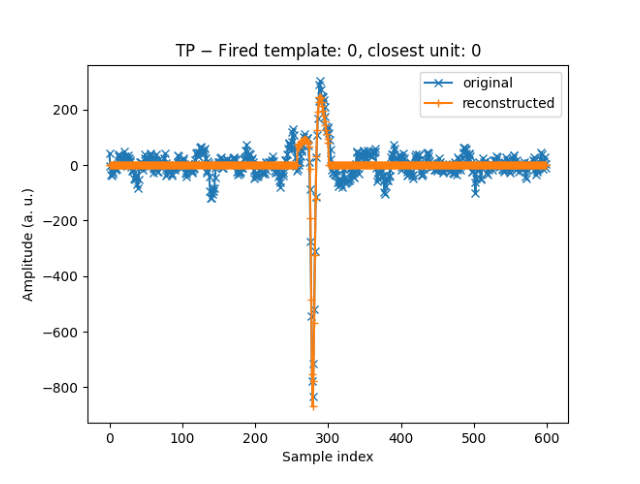

False positive on test set:


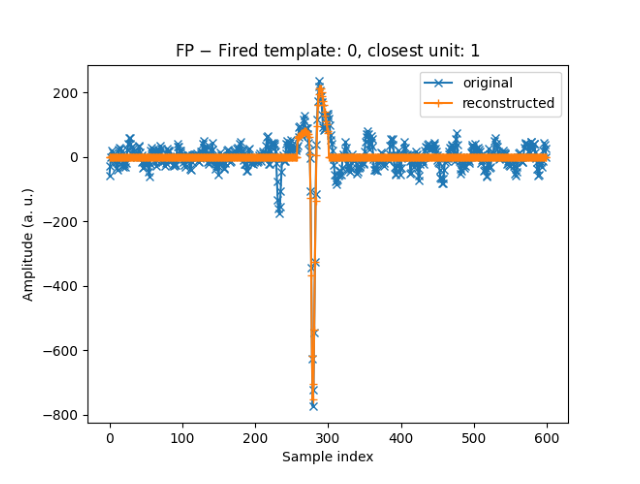

Confusion matrix train:


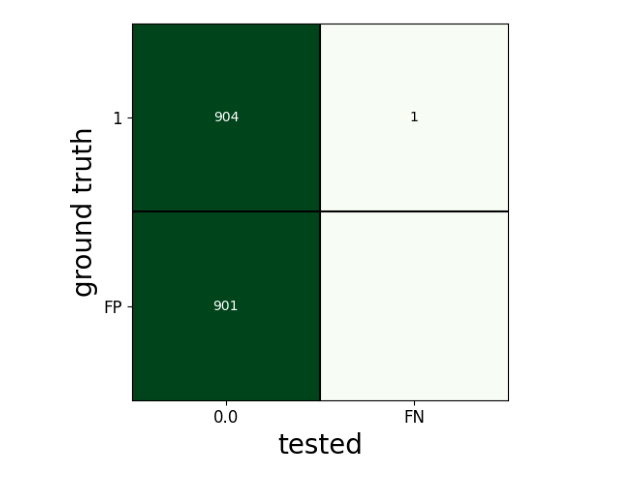

Confusion matrix test:


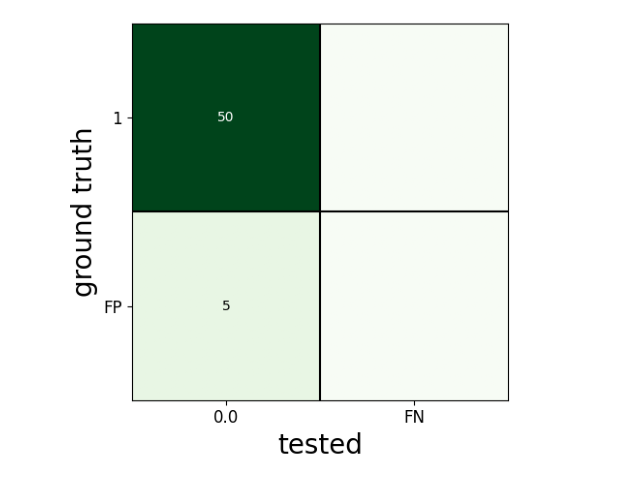

Time:


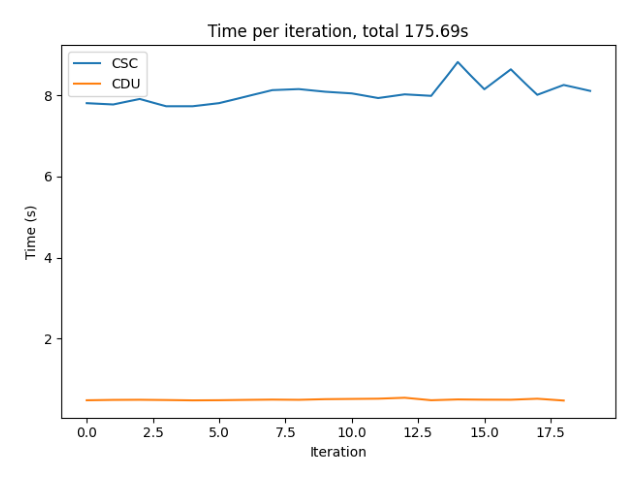

In [90]:
path = f"outputs/spikeforest_experiments/experiment_sandbox/single/interp_1_10/seed_None"
helper.show_plots(path, num_elements=1, show_confusion_train=True)

**Observations**: COMP and COMP-INTERP have similar performance on this real dataset with only one template. COMP-INTERP performs very slightly better on template reconstruction despite many false positives. In any case, a post processing splitting units would be necessary.

## Extra figures for the report

In [91]:
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np

[ 0 11 22 33 44 55 66 77 88 99]
[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71
 72 73 74 75 76 77 78 79 80 81 82 83 84 85 86 87 88 89 90 91 92 93 94 95
 96 97 98 99]
22


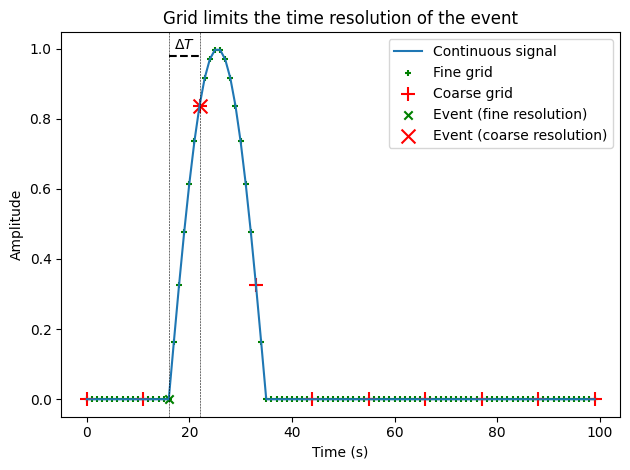

In [93]:
def event_curve(x, idx):
    y = np.zeros(100)
    length = 20
    y[idx:idx+length] = -np.cos(np.linspace(np.pi/2, 3*np.pi/2, length))
    return y[x]

idx = 16
x = np.linspace(0, 99, 100).astype(int)
plt.plot(event_curve(x, idx), label='Continuous signal')
coarse_grid = np.linspace(0, 99, 10).astype(int)
fine_grid = np.linspace(0, 99, 100).astype(int)
plt.scatter(fine_grid, event_curve(fine_grid, idx), color="green", marker='+', label='Fine grid', s=20)
plt.scatter(coarse_grid, event_curve(coarse_grid, idx), color="red", marker='+', label='Coarse grid', s=100)

print(coarse_grid)
print(fine_grid)
print((idx//11+1)*11)
idx_coarse = (idx//11+1)*11
plt.scatter([idx], [event_curve(idx, idx)], color="green", label='Event (fine resolution)', marker='x')
plt.scatter([(idx//11+1)*11], [event_curve((idx//11+1)*11, idx)], color="red", label='Event (coarse resolution)', marker='x', s=100)

# draw line between the two idx and add time error text
plt.axvline(idx, color="black", linestyle="--", linewidth=0.4)
plt.axvline(idx_coarse, color="black", linestyle="--", linewidth=0.4)
value_coarse = event_curve((idx//11+1)*11, idx)
plt.plot([idx, idx_coarse], [0.98,0.98], color="black", linestyle="--")
plt.text((idx+idx_coarse)/2, 1, f"$\Delta T$", horizontalalignment='center')

plt.xlabel("Time (s)")
plt.ylabel("Amplitude")
plt.title("Grid limits the time resolution of the event")

plt.legend()
plt.tight_layout()
plt.show()